In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.linear_model import TweedieRegressor
from sklearn.linear_model import Lasso
from sklearn.cross_decomposition import PLSRegression
from sklearn.neural_network import MLPRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.tree import DecisionTreeRegressor 
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.linear_model import Ridge
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.preprocessing import OrdinalEncoder

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
%matplotlib inline 

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Upload dataset

In [2]:
train_data = pd.read_csv('train.csv')

In [3]:
test_data = pd.read_csv('test.csv')

In [4]:
#split diamond data into data & labels
from sklearn.model_selection import train_test_split
train_set ,test_set = train_test_split(train_data,test_size = 0.2,random_state = 42 )

In [5]:
train_set.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
6620,8142,0.90,Premium,H,VVS2,62.0,58.0,4355,6.16,6.13,3.81
38308,47475,0.52,Very Good,D,VS1,62.6,59.0,1860,5.03,5.13,3.18
41706,52107,0.47,Ideal,D,VVS1,62.0,54.0,2460,4.99,5.01,3.10
22543,28015,0.30,Ideal,E,VS2,62.6,54.0,658,4.29,4.33,2.70
28532,35361,0.38,Premium,I,VS1,61.3,60.0,898,4.65,4.62,2.84


In [6]:
test_set.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
39754,49326,0.75,Very Good,H,SI2,62.2,58.0,2093,5.77,5.83,3.61
2705,3471,0.71,Good,F,IF,62.1,62.0,3393,5.68,5.79,3.56
14948,18479,1.25,Very Good,H,VS2,63.3,57.0,7525,6.87,6.82,4.33
18874,23543,2.01,Good,J,SI2,63.4,59.0,11554,7.95,7.99,5.05
17647,22012,1.52,Good,H,SI1,63.8,60.0,10078,7.30,7.24,4.64


In [7]:
train_set.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34432 entries, 6620 to 15795
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  34432 non-null  int64  
 1   carat       34432 non-null  float64
 2   cut         34432 non-null  object 
 3   color       34432 non-null  object 
 4   clarity     34432 non-null  object 
 5   depth       34432 non-null  float64
 6   table       34432 non-null  float64
 7   price       34432 non-null  int64  
 8   x           34432 non-null  float64
 9   y           34432 non-null  float64
 10  z           34432 non-null  float64
dtypes: float64(6), int64(2), object(3)
memory usage: 3.2+ MB


In [8]:
# Drop the "Unnamed: 0" column
train_set = train_set.drop("Unnamed: 0", axis = 1)

# Price is int64, best if all numeric attributes have the same datatype, especially as float64
train_set["price"] = train_set["price"].astype(float)

# Preview dataset again
train_set.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
6620,0.90,Premium,H,VVS2,62.0,58.0,4355.0,6.16,6.13,3.81
38308,0.52,Very Good,D,VS1,62.6,59.0,1860.0,5.03,5.13,3.18
41706,0.47,Ideal,D,VVS1,62.0,54.0,2460.0,4.99,5.01,3.10
22543,0.30,Ideal,E,VS2,62.6,54.0,658.0,4.29,4.33,2.70
28532,0.38,Premium,I,VS1,61.3,60.0,898.0,4.65,4.62,2.84


In [9]:
#Checking for duplicate records in the data
dups = train_set .duplicated()
print('Number of duplicate rows = %d' % (dups.sum()))
print(train_set .shape)

Number of duplicate rows = 80
(34432, 10)


In [10]:
print('Before',train_set.shape)
train_set.drop_duplicates(inplace=True) 
print('After',train_set.shape)

Before (34432, 10)
After (34352, 10)


In [11]:
train_set["cut"].value_counts()

Ideal        13924
Premium       8804
Very Good     7551
Good          3114
Fair           959
Name: cut, dtype: int64

In [12]:
train_set["color"].value_counts()

G    7272
E    6099
F    6073
H    5293
D    4452
I    3414
J    1749
Name: color, dtype: int64

In [13]:
train_set["clarity"].value_counts()

SI1     8273
VS2     7973
SI2     5851
VS1     5175
VVS2    3196
VVS1    2258
IF      1192
I1       434
Name: clarity, dtype: int64

In [14]:
train_set.describe()

,carat,depth,table,price,x,y,z
count,34352.000000,34352.000000,34352.000000,34352.000000,34352.000000,34352.000000,34352.000000
mean,0.798002,61.741849,57.436941,3958.504658,5.727570,5.731838,3.535902
std,0.482149,1.423439,2.241567,4033.920500,1.132485,1.168377,0.717971
min,0.200000,43.000000,44.000000,335.000000,0.000000,0.000000,0.000000
25%,0.380000,61.000000,56.000000,942.000000,4.660000,4.670000,2.870000
50%,0.710000,61.800000,57.000000,2391.000000,5.710000,5.720000,3.530000
75%,1.030000,62.500000,59.000000,5347.000000,6.510000,6.500000,4.020000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


## Data Analysis & Visualization

In [15]:
corr_matrix = train_set.corr()
corr_matrix["price"].sort_values(ascending=False)

price    1.000000
carat    0.923252
x        0.888350
y        0.858541
z        0.856001
table    0.136393
depth   -0.016125
Name: price, dtype: float64

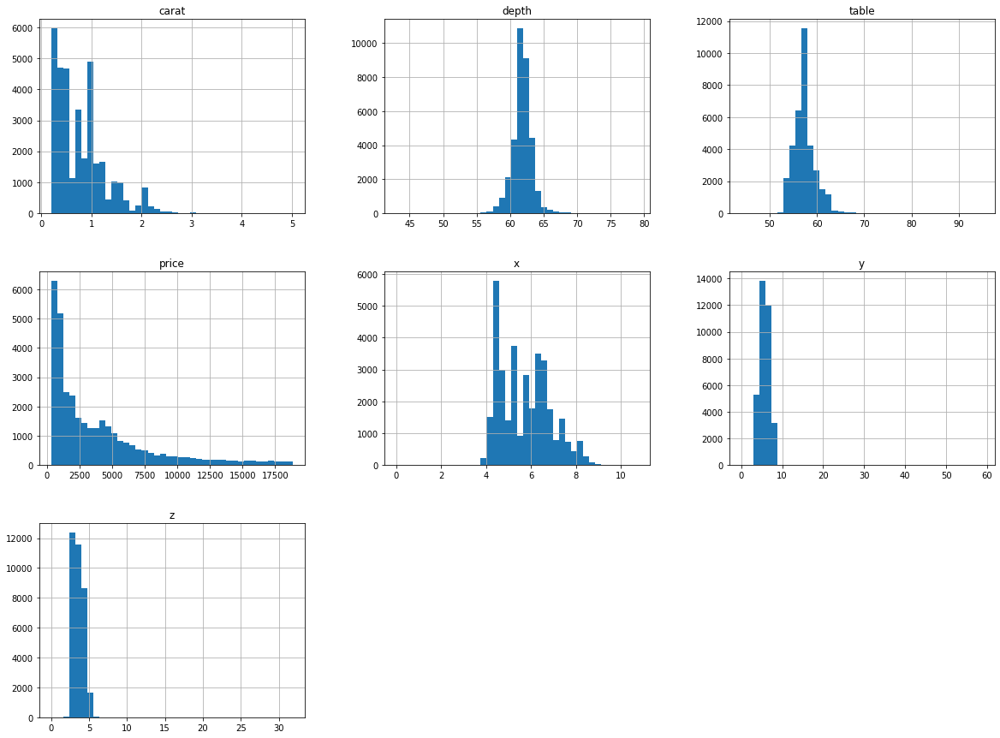

In [16]:
train_set.hist(bins = 40, figsize = (20,15))
plt.show()

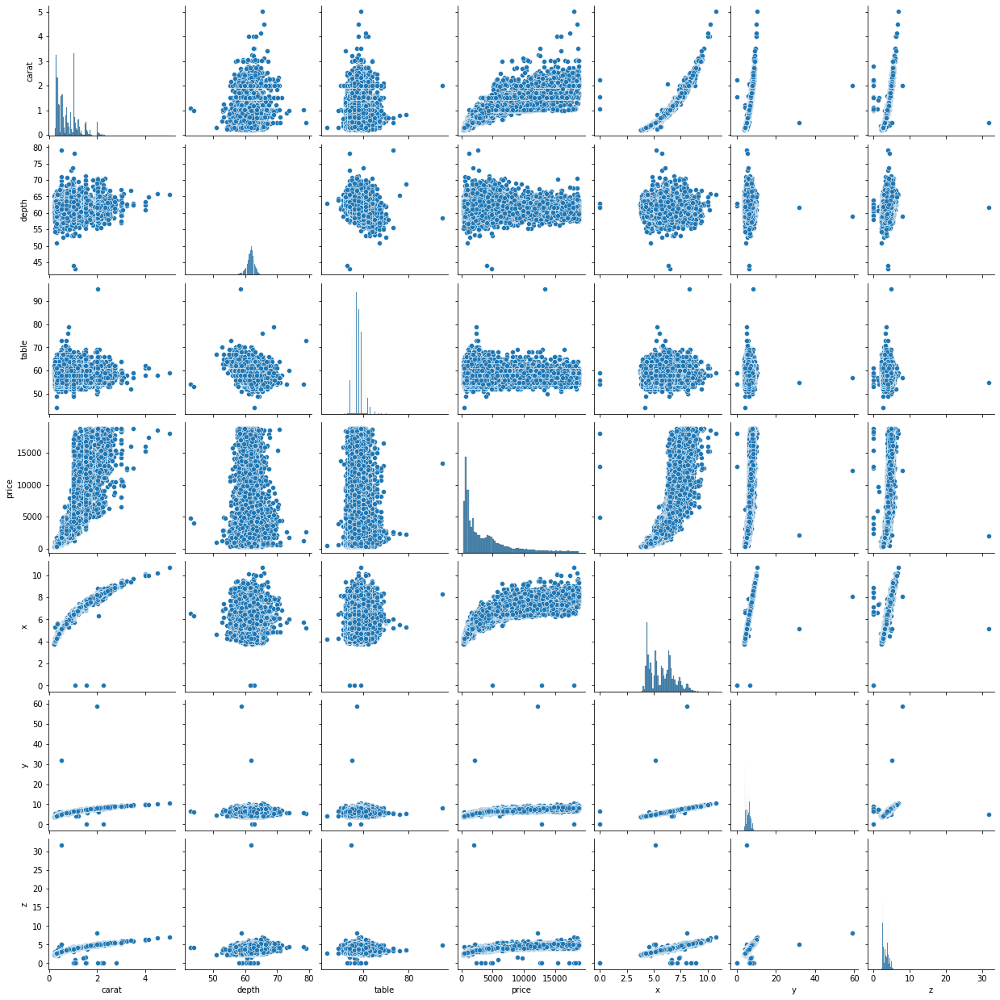

In [17]:
ans =sns.pairplot(train_set)

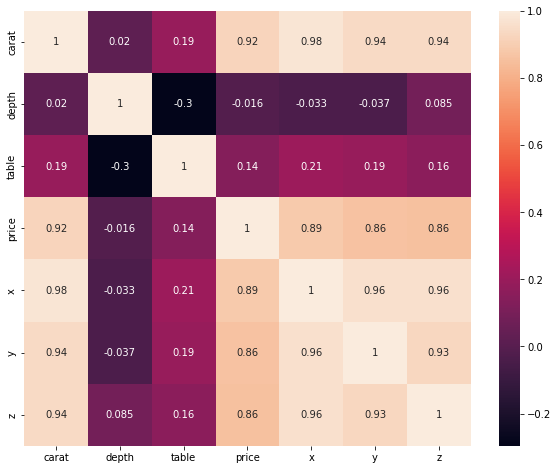

In [18]:
# Plot the correlation with seaborn
plt.subplots(figsize = (10, 8))
sns.heatmap(corr_matrix, annot = True)
plt.show()

C:\Users\ASUS\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='price', ylabel='Density'>

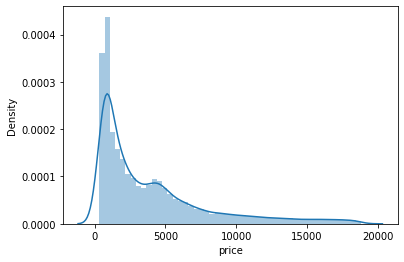

In [19]:
sns.distplot(train_set.price)

In [20]:
train_set.isna().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
dtype: int64

In [21]:
print("Number of rows with x == 0: {} ".format((train_set.x==0).sum()))
print("Number of rows with y == 0: {} ".format((train_set.y==0).sum()))
print("Number of rows with z == 0: {} ".format((train_set.z==0).sum()))
print("Number of rows with depth == 0: {} ".format((train_set.depth==0).sum()))

Number of rows with x == 0: 3 
Number of rows with y == 0: 2 
Number of rows with z == 0: 13 
Number of rows with depth == 0: 0 


In [22]:
train_set[['x','y','z']] = train_set[['x','y','z']].replace(0,np.NaN)

In [23]:
train_set.isnull().sum()

carat       0
cut         0
color       0
clarity     0
depth       0
table       0
price       0
x           3
y           2
z          13
dtype: int64

In [24]:
train_set.dropna(inplace=True)

In [25]:
train_set.isnull().sum()

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
dtype: int64

In [26]:
train_set.shape

(34339, 10)

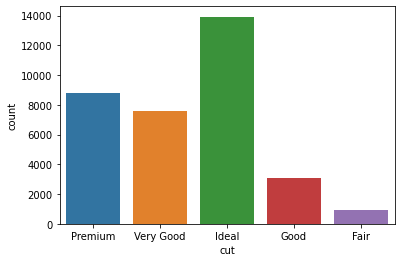

In [27]:
ans = sns.countplot(data = train_set,x = 'cut')

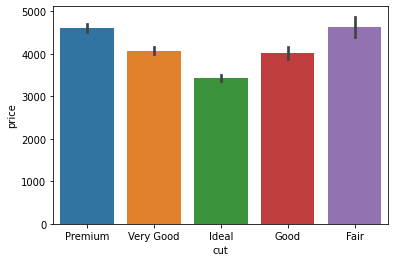

In [28]:
ans = sns.barplot(data = train_set, x ='cut', y='price')

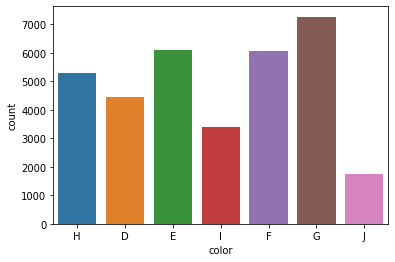

In [29]:
ans = sns.countplot(data = train_set,x = 'color')

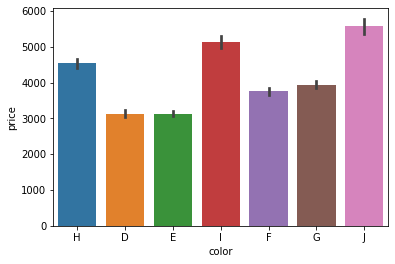

In [30]:
ans = sns.barplot(data = train_set, x ='color', y='price')

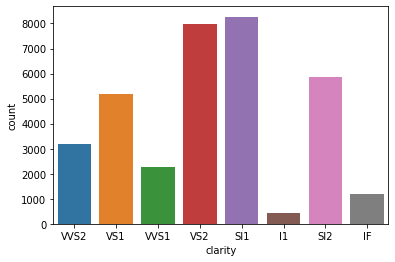

In [31]:
ans = sns.countplot(data = train_set,x = 'clarity')

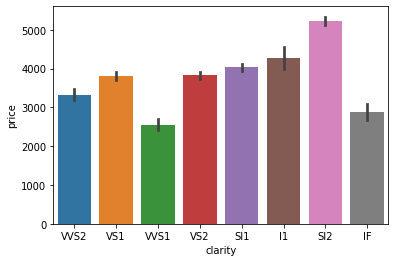

In [32]:
ans = sns.barplot(data = train_set, x ='clarity', y='price')

In [33]:
layout_options = {
    'paper_bgcolor':"#383838",
    'plot_bgcolor':'#383838',
    'title_font': dict(color='white'),
    'legend_font': dict(color='white'),
    'yaxis':dict(color="white"),
    'xaxis':dict(color="white")
    }

In [34]:
fig = px.box(train_set, y='price', x='cut', width=600, height=400)
fig.update_layout(**layout_options)
fig.show()

In [35]:
fig = px.box(train_set, y='price', x='color', width=600, height=400)
fig.update_layout(**layout_options)
fig.show()

In [36]:
fig = px.box(train_set, y='price', x='clarity', width=600, height=400)
fig.update_layout(**layout_options)
fig.show()

## Feature Engineering

In [37]:
train_set['volume'] = train_set['x'] * train_set['y'] * train_set['z']

In [38]:
corr_matrix = train_set.corr()
corr_matrix["price"].sort_values(ascending=False)

price     1.000000
carat     0.923198
volume    0.896333
x         0.890439
z         0.863795
y         0.860145
table     0.136583
depth    -0.016347
Name: price, dtype: float64

In [39]:
train_set.drop(['x','y','z'], axis = 1, inplace = True)
train_set.head()

,carat,cut,color,clarity,depth,table,price,volume
6620,0.90,Premium,H,VVS2,62.0,58.0,4355.0,143.868648
38308,0.52,Very Good,D,VS1,62.6,59.0,1860.0,82.056402
41706,0.47,Ideal,D,VVS1,62.0,54.0,2460.0,77.499690
22543,0.30,Ideal,E,VS2,62.6,54.0,658.0,50.154390
28532,0.38,Premium,I,VS1,61.3,60.0,898.0,61.011720


### One hot Encoding

In [40]:
Encoder_cut_object = OrdinalEncoder(categories=[[ 'Fair', 'Good', 'Very Good', 'Premium', 'Ideal']])
Encoder_clarity_object = OrdinalEncoder(categories=[['I1', 'SI2', 'SI1', 'VS2', 'VS1', 'VVS2', 'VVS1', 'IF' ]])
Encoder_color_object = OrdinalEncoder(categories=[[ 'J', 'I', 'H','G', 'F', 'E', 'D' ]])

In [41]:
train_set['color'] =Encoder_color_object.fit_transform(np.array(train_set['color']).reshape(-1,1))+1
train_set['clarity'] =Encoder_clarity_object.fit_transform(np.array(train_set['clarity']).reshape(-1,1))+1
train_set['cut'] =Encoder_cut_object.fit_transform(np.array(train_set['cut']).reshape(-1,1))+1

In [42]:
train_set.head()

,carat,cut,color,clarity,depth,table,price,volume
6620,0.90,4.0,3.0,6.0,62.0,58.0,4355.0,143.868648
38308,0.52,3.0,7.0,5.0,62.6,59.0,1860.0,82.056402
41706,0.47,5.0,7.0,7.0,62.0,54.0,2460.0,77.499690
22543,0.30,5.0,6.0,4.0,62.6,54.0,658.0,50.154390
28532,0.38,4.0,2.0,5.0,61.3,60.0,898.0,61.011720


In [43]:
X_train = train_set.drop(["price"],axis=1)
Y_train = train_set.price

In [44]:
X_train.shape

(34339, 7)

### Preprocessing Test data

In [45]:
# Drop the "Unnamed: 0" column
test_set = test_set.drop("Unnamed: 0", axis = 1)

In [46]:
test_set['volume'] = test_set['x'] * test_set['y'] * test_set['z']
test_set.drop(['x','y','z'], axis = 1, inplace = True)

In [47]:
test_set['color'] =Encoder_color_object.transform(np.array(test_set['color']).reshape(-1,1))+1
test_set['clarity'] =Encoder_clarity_object.transform(np.array(test_set['clarity']).reshape(-1,1))+1
test_set['cut'] =Encoder_cut_object.transform(np.array(test_set['cut']).reshape(-1,1))+1

In [48]:
X_test = test_set.drop(["price"],axis=1)
X_test.head()

,carat,cut,color,clarity,depth,table,volume
39754,0.75,3.0,3.0,2.0,62.2,58.0,121.437151
2705,0.71,2.0,5.0,8.0,62.1,62.0,117.078432
14948,1.25,3.0,3.0,4.0,63.3,57.0,202.875222
18874,2.01,2.0,1.0,2.0,63.4,59.0,320.778525
17647,1.52,2.0,3.0,3.0,63.8,60.0,245.233280


In [49]:
X_test.shape

(8608, 7)

In [50]:
Y_test = test_set.price

### Select and Train Model

In [51]:
#CV = []
#R2_train = []
rmse_ = []
def evaluation_train(model):

  model.fit(X_train,Y_train)
  Y_pred = model.predict(X_train)
  # MAE
  mae =mean_absolute_error(Y_train, Y_pred)
    
  # MSE
  lin_mse = mean_squared_error(Y_train, Y_pred)
  lin_rmse = np.sqrt(lin_mse)


  scores = cross_val_score(model, X_train, Y_train, scoring ="neg_mean_squared_error",cv = 10)
  rmse_scores = np.sqrt(-scores)

  return mae,lin_rmse,rmse_scores,rmse_scores.mean(),rmse_scores.std()

In [52]:
def meansquarederror(y_pred, y_test):
    lin_mse = mean_squared_error(y_pred, y_test)
    lin_rmse = np.sqrt(lin_mse)
    return lin_rmse

#### Linear Regression Model

In [53]:
X_train.shape

(34339, 7)

In [54]:
model_1 = LinearRegression()
model_1.fit(X_train,Y_train)
mse,lin_rmse,rmse_scores,rmse_scores_mean,rmse_scores_std =evaluation_train(model_1)
print("MAE: ",lin_rmse)
print("MSE: ",mse)
print("Scores: ", rmse_scores)
print("Mean: ", rmse_scores_mean)
print("Standard Deviation: ", rmse_scores_std)

MAE:  1245.7973856003869
MSE:  852.3332957609283
Scores:  [1317.70733323 1345.14686419 1271.2340569  1241.50804222 1181.02167661
 1202.90936122 1267.52533664 1234.54188367 1252.29338531 1235.19139449]
Mean:  1254.9079334484768
Standard Deviation:  46.54622617011347


In [55]:
y_pred=model_1.predict(X_test)
rmse_.append(meansquarederror(y_pred, Y_test))
meansquarederror(y_pred, Y_test)

1204.886237380036

#### Decision Tree Regressor Model

In [56]:
model_2 = DecisionTreeRegressor()
model_2.fit(X_train,Y_train)

mse,d_rmse,rmse_scores,rmse_scores_mean,rmse_scores_std =evaluation_train(model_2)
print("MAE: ",d_rmse)
print("MSE: ",mse)
print("Scores: ", rmse_scores)
print("Mean: ", rmse_scores_mean)
print("Standard Deviation: ", rmse_scores_std)

MAE:  33.770720019288305
MSE:  13.632400477591077
Scores:  [721.13236321 737.32756593 718.8507129  816.04587949 750.14359492
 733.16594381 796.83192034 748.30687723 752.68800948 741.59304025]
Mean:  751.6085907568525
Standard Deviation:  29.762048893718717


In [57]:
y_pred=model_2.predict(X_test)
rmse_.append(meansquarederror(y_pred, Y_test))
meansquarederror(y_pred, Y_test)

733.181558129306

####  Random Forest Regressor Model

In [58]:
model_3 = RandomForestRegressor()
model_3.fit(X_train,Y_train)

mse,rf_rmse,rmse_scores,rmse_scores_mean,rmse_scores_std =evaluation_train(model_3)
print("MAE: ",rf_rmse)
print("MSE: ",mse)
print("Scores: ", rmse_scores)
print("Mean: ", rmse_scores_mean)
print("Standard Deviation: ", rmse_scores_std)

MAE:  210.40288081235263
MSE:  109.1048761247303
Scores:  [552.15788939 558.0792749  536.07417945 614.55202519 548.35804219
 572.11633731 620.61005356 554.9501977  533.27849019 567.19041821]
Mean:  565.7366908104055
Standard Deviation:  28.34011488911164


In [59]:
y_pred=model_3.predict(X_test)
rmse_.append(meansquarederror(y_pred, Y_test))
meansquarederror(y_pred, Y_test)

548.3001321061695

#### Support Vector Machines

In [60]:
model_4 = SVR(kernel="rbf")
model_4.fit(X_train,Y_train)

mse,s_rmse,rmse_scores,rmse_scores_mean,rmse_scores_std =evaluation_train(model_4)
print("MAE: ",s_rmse)
print("MSE: ",mse)
print("Scores: ", rmse_scores)
print("Mean: ", rmse_scores_mean)
print("Standard Deviation: ", rmse_scores_std)

MAE:  2340.906971676293
MSE:  1134.3364426269593
Scores:  [2385.41248897 2367.03733526 2415.83827785 2346.2224351  2381.52530164
 2429.42373519 2476.20762643 2573.29260162 2325.98653458 2385.40757512]
Mean:  2408.635391176916
Standard Deviation:  68.14135394235504


In [61]:
y_pred= model_4.predict(X_test)
rmse_.append(meansquarederror(y_pred, Y_test))
meansquarederror(y_pred, Y_test)

2292.502460017537

In [62]:
model_5 = SVR(kernel="linear")
model_5.fit(X_train,Y_train)

mse,sv_rmse,rmse_scores,rmse_scores_mean,rmse_scores_std =evaluation_train(model_5)
print("MAE: ",sv_rmse)
print("MSE: ",mse)
print("Scores: ", rmse_scores)
print("Mean: ", rmse_scores_mean)
print("Standard Deviation: ", rmse_scores_std)

MAE:  1646.8161668792902
MSE:  799.5079897991992
Scores:  [1387.87478831 3144.59549304 1386.59447544 1467.86197574 1299.54272824
 1333.69740315 1404.96141379 1376.71664638 1336.86335941 1488.27912375]
Mean:  1562.698740724716
Standard Deviation:  530.1575686205865


In [63]:
y_pred = model_5.predict(X_test)
rmse_.append(meansquarederror(y_pred, Y_test))
meansquarederror(y_pred, Y_test)

1317.002691501617

#### Random Forest Regressor Hyperparameter tuning

In [64]:
model_6 = RandomForestRegressor(n_estimators=400,
                                  max_features='sqrt',
                                  )

mse,h_rmse,rmse_scores,rmse_scores_mean,rmse_scores_std =evaluation_train(model_6)
print("MAE: ",h_rmse)
print("MSE: ",mse)
print("Scores: ", rmse_scores)
print("Mean: ", rmse_scores_mean)
print("Standard Deviation: ", rmse_scores_std)

MAE:  211.44267993792263
MSE:  110.6211213631964
Scores:  [595.09576686 569.44423705 559.51967485 616.3202526  543.43029432
 572.51577447 625.60752532 551.88896246 544.65670457 569.92690185]
Mean:  574.8406094347305
Standard Deviation:  27.250628078336298


In [65]:
y_pred = model_6.predict(X_test)
rmse_.append(meansquarederror(y_pred, Y_test))
meansquarederror(y_pred, Y_test)

542.8146422451126

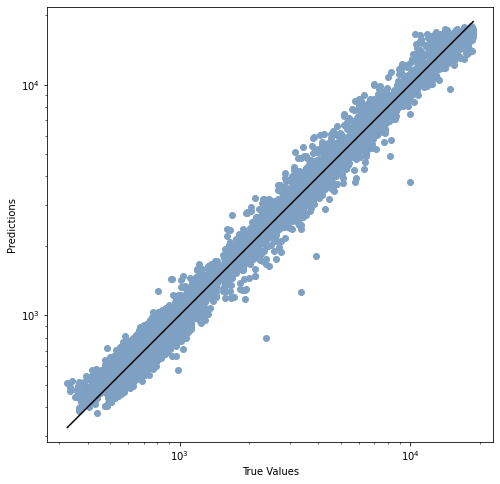

In [66]:
plt.figure(figsize=(8,8))
plt.scatter(Y_test, y_pred, c="#7ea0c3")
plt.yscale('log')
plt.xscale('log')

p1 = max(max(y_pred), max(Y_test))
p2 = min(min(y_pred), min(Y_test))
plt.plot([p1, p2], [p1, p2], "k-")
plt.xlabel('True Values', fontsize=10)
plt.ylabel('Predictions', fontsize=10)
plt.axis('equal')
plt.show()

In [67]:
model_7 = RandomForestRegressor(criterion= 'squared_error',max_depth= 8,n_estimators= 500,random_state=42)
model_7.fit(X_train,Y_train)

mse,a_rmse,rmse_scores,rmse_scores_mean,rmse_scores_std =evaluation_train(model_7)
print("MAE: ",a_rmse)
print("MSE: ",mse)
print("Scores: ", rmse_scores)
print("Mean: ", rmse_scores_mean)
print("Standard Deviation: ", rmse_scores_std)

MAE:  578.1790229600375
MSE:  321.20289923598335
Scores:  [605.74480368 611.35164503 615.52454685 655.94046706 610.07132068
 620.88549535 654.48089556 624.92625697 570.9457753  617.08349504]
Mean:  618.6954701526629
Standard Deviation:  23.02198827398061


In [68]:
y_pred = model_7.predict(X_test)
rmse_.append(meansquarederror(y_pred, Y_test))
meansquarederror(y_pred, Y_test)

611.2577755960119

#### Grid Search with Random Forest

In [69]:
params= {
    'n_estimators': [175,200,225],
    'max_depth':[6,8,9]
}

model_8 = RandomForestRegressor()

grid = GridSearchCV(param_grid = params,estimator = model_8,cv = 5)

In [70]:
grid.fit(X_train,Y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [6, 8, 9],
                         'n_estimators': [175, 200, 225]})

In [71]:
print(grid.best_estimator_)
print(grid.best_params_)

RandomForestRegressor(max_depth=9, n_estimators=200)
{'max_depth': 9, 'n_estimators': 200}


In [72]:
y_pred=grid.predict(X_test)
meansquarederror(y_pred, Y_test)

576.9235613576045

#### Grid Search with XGBoosting

In [73]:
parameters = {
    'nthread':[x for x in range(4,6)], 
    'learning_rate': [0.05,0.06], 
    'max_depth': [x for x in range(4,9)],
    'n_estimators': [500]
 }

In [74]:
RegModel=XGBRegressor(objective= 'reg:squarederror')

In [75]:
grid_search = GridSearchCV(RegModel, parameters, cv=5,scoring='neg_mean_squared_error',return_train_score=True)

In [76]:
grid_search.fit(X_train,Y_train)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    gamma=None, gpu_id=None, grow_policy=None,
                                    importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_bin=None,
                                    max_cat...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                  

In [77]:
print(grid_search.best_estimator_)
print(grid_search.best_params_)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.05, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=500, n_jobs=4,
             nthread=4, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, ...)
{'learning_rate': 0.05, 'max_depth': 6, 'n_estimators': 500, 'nthread': 4}


In [78]:
y_pred=grid_search.predict(X_test)
meansquarederror(y_pred, Y_test)

520.471442487916

#### AdaBoost Regression

In [79]:
model_9 = AdaBoostRegressor(n_estimators = 100)
model_9.fit(X_train,Y_train)

mse,ad_rmse,rmse_scores,rmse_scores_mean,rmse_scores_std =evaluation_train(model_9)
print("MAE: ",ad_rmse)
print("MSE: ",mse)
print("Scores: ", rmse_scores)
print("Mean: ", rmse_scores_mean)
print("Standard Deviation: ", rmse_scores_std)

MAE:  1252.4549910319736
MSE:  1056.4073838228662
Scores:  [1210.44255475 1159.93534687 1240.98964766 1225.1635161  1179.97597201
 1222.74699465 1271.21978014 1161.45203571 1170.39232334 1247.29889328]
Mean:  1208.9617064516576
Standard Deviation:  37.16832688333255


In [80]:
y_pred = model_9.predict(X_test)
rmse_.append(meansquarederror(y_pred, Y_test))
meansquarederror(y_pred, Y_test)

1253.0459347834947

#### GradientBoosting Regression

In [81]:
model_10 = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1,max_depth=1)
model_10.fit(X_train,Y_train)

mse,g_rmse,rmse_scores,rmse_scores_mean,rmse_scores_std =evaluation_train(model_10)
print("MAE: ",g_rmse)
print("MSE: ",mse)
print("Scores: ", rmse_scores)
print("Mean: ", rmse_scores_mean)
print("Standard Deviation: ", rmse_scores_std)

MAE:  1181.534301824394
MSE:  678.639048704984
Scores:  [1206.74783996 1183.17206329 1203.96836578 1181.53381606 1133.27319462
 1183.34026639 1241.0569476  1210.20966957 1146.35779278 1220.70503448]
Mean:  1191.0364990519604
Standard Deviation:  31.15786515400148


In [82]:
y_pred = model_10.predict(X_test)
rmse_.append(meansquarederror(y_pred, Y_test))
meansquarederror(y_pred, Y_test)

1136.4296532427697

#### XGBRegressor

In [83]:
model_11 = XGBRegressor()
model_11.fit(X_train,Y_train)

mse,x_rmse,rmse_scores,rmse_scores_mean,rmse_scores_std =evaluation_train(model_11)
print("MAE: ",x_rmse)
print("MSE: ",mse)
print("Scores: ", rmse_scores)
print("Mean: ", rmse_scores_mean)
print("Standard Deviation: ", rmse_scores_std)

MAE:  381.58384081718054
MSE:  223.2728540836062
Scores:  [542.64316616 535.52545573 557.80095216 590.8075539  565.51137406
 571.9917877  629.45012291 542.01157586 537.47738269 559.12473181]
Mean:  563.2344102975869
Standard Deviation:  27.529449074207935


In [84]:
y_pred = model_11.predict(X_test)
rmse_.append(meansquarederror(y_pred, Y_test))
meansquarederror(y_pred, Y_test)

538.7034299145369

In [85]:
model_12=XGBRegressor(colsample_bytree= 0.9,learning_rate= 0.05, max_depth= 5,objective= 'reg:squarederror', n_estimators= 500, nthread= 4)
model_12.fit(X_train,Y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=0.9,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.05, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=5, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=500, n_jobs=4,
             nthread=4, num_parallel_tree=1, predictor='auto', random_state=0,
             reg_alpha=0, ...)

In [86]:
y_pred = model_12.predict(X_test)
rmse_.append(meansquarederror(y_pred, Y_test))
meansquarederror(y_pred, Y_test)

527.4254853082198

In [87]:
model_13 = XGBRegressor(colsample_bytree= 0.7,learning_rate= 0.01,max_depth= 7,min_child_weight= 5,n_estimators= 500,nthread= 1,objective= 'reg:squarederror',subsample= 0.7)
model_13.fit(X_train,Y_train)

mse,xg_rmse,rmse_scores,rmse_scores_mean,rmse_scores_std =evaluation_train(model_13)
print("MAE: ",xg_rmse)
print("MSE: ",mse)
print("Scores: ", rmse_scores)
print("Mean: ", rmse_scores_mean)
print("Standard Deviation: ", rmse_scores_std)

MAE:  532.0623915715978
MSE:  285.9904164833307
Scores:  [594.56161252 589.95947235 598.60507175 642.14562305 585.21394509
 598.67165384 640.33019309 588.61784547 555.38497332 612.39684553]
Mean:  600.5887236019962
Standard Deviation:  24.547451783083293


In [88]:
y_pred = model_13.predict(X_test)
rmse_.append(meansquarederror(y_pred, Y_test))
meansquarederror(y_pred, Y_test)

577.3528744519912

In [89]:
model_14 = XGBRegressor(learning_rate=0.07, max_depth=7, n_estimators=500, nthread=1,
             objective='reg:squarederror')
model_14.fit(X_train,Y_train)

mse,xgr_rmse,rmse_scores,rmse_scores_mean,rmse_scores_std =evaluation_train(model_14)
print("MAE: ",xgr_rmse)
print("MSE: ",mse)
print("Scores: ", rmse_scores)
print("Mean: ", rmse_scores_mean)
print("Standard Deviation: ", rmse_scores_std)

MAE:  310.2150361905841
MSE:  184.86486036825613
Scores:  [538.71779641 535.08470828 550.61001066 591.29396264 550.51502076
 545.56258431 597.11375484 533.37771137 526.60951415 546.33770096]
Mean:  551.5222764374644
Standard Deviation:  22.602287039303462


In [90]:
y_pred = model_14.predict(X_test)
rmse_.append(meansquarederror(y_pred, Y_test))
meansquarederror(y_pred, Y_test)

516.5627666726976

### best model


In [91]:
model_15 = XGBRegressor(colsample_bytree= 0.9,learning_rate= 0.05,max_depth= 7,min_child_weight= 3,n_estimators= 500,nthread= 1,objective= 'reg:squarederror',subsample= 0.7)
model_15.fit(X_train,Y_train)

mse,G_rmse,rmse_scores,rmse_scores_mean,rmse_scores_std =evaluation_train(model_15)
print("MAE: ",G_rmse)
print("MSE: ",mse)
print("Scores: ", rmse_scores)
print("Mean: ", rmse_scores_mean)
print("Standard Deviation: ", rmse_scores_std)

MAE:  345.8380959372753
MSE:  204.26128013990987
Scores:  [535.76772417 532.84324637 550.42252068 580.50545133 545.99504394
 551.47822429 600.399493   523.19203656 525.34042552 545.49542689]
Mean:  549.1439592741436
Standard Deviation:  23.0775460338514


In [92]:
y_pred = model_15.predict(X_test)
rmse_.append(meansquarederror(y_pred, Y_test))
meansquarederror(y_pred, Y_test)

514.2715107616406

### CatBoostRegressor

In [99]:
import catboost as cb

train_dataset = cb.Pool(X_train, Y_train) 
test_dataset = cb.Pool(X_test, Y_test)

In [100]:
model_16 = cb.CatBoostRegressor(loss_function='RMSE')
grid = {'iterations': [100, 150, 200],
        'learning_rate': [0.03, 0.1],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}
model_16.grid_search(grid, train_dataset)

0:	learn: 5477.7359579	test: 5598.1433289	best: 5598.1433289 (0)	total: 2.88ms	remaining: 286ms
1:	learn: 5336.3126690	test: 5455.0901635	best: 5455.0901635 (1)	total: 5.91ms	remaining: 290ms
2:	learn: 5194.6809798	test: 5310.0098858	best: 5310.0098858 (2)	total: 8.64ms	remaining: 279ms
3:	learn: 5057.2140927	test: 5169.3285976	best: 5169.3285976 (3)	total: 11.3ms	remaining: 272ms
4:	learn: 4926.1480765	test: 5035.4540718	best: 5035.4540718 (4)	total: 14ms	remaining: 267ms
5:	learn: 4798.3956799	test: 4905.0682529	best: 4905.0682529 (5)	total: 16.7ms	remaining: 261ms
6:	learn: 4674.0146913	test: 4777.2274621	best: 4777.2274621 (6)	total: 19.6ms	remaining: 260ms
7:	learn: 4553.8497313	test: 4654.0147908	best: 4654.0147908 (7)	total: 22.4ms	remaining: 257ms
8:	learn: 4438.5073349	test: 4535.8748603	best: 4535.8748603 (8)	total: 25.1ms	remaining: 254ms
9:	learn: 4325.7585618	test: 4420.5613473	best: 4420.5613473 (9)	total: 27.8ms	remaining: 251ms
10:	learn: 4219.7321278	test: 4312.1360286

93:	learn: 1361.8623603	test: 1387.7078430	best: 1387.7078430 (93)	total: 280ms	remaining: 17.9ms
94:	learn: 1355.5409199	test: 1381.1080761	best: 1381.1080761 (94)	total: 283ms	remaining: 14.9ms
95:	learn: 1349.5891529	test: 1375.0811254	best: 1375.0811254 (95)	total: 287ms	remaining: 11.9ms
96:	learn: 1341.0077232	test: 1366.0901365	best: 1366.0901365 (96)	total: 291ms	remaining: 8.98ms
97:	learn: 1333.7597965	test: 1358.2806183	best: 1358.2806183 (97)	total: 294ms	remaining: 6ms
98:	learn: 1328.1180197	test: 1352.8384297	best: 1352.8384297 (98)	total: 297ms	remaining: 3ms
99:	learn: 1321.7491205	test: 1346.3774298	best: 1346.3774298 (99)	total: 302ms	remaining: 0us

bestTest = 1346.37743
bestIteration = 99

0:	loss: 1346.3774298	best: 1346.3774298 (0)	total: 349ms	remaining: 33.2s
0:	learn: 5141.3860421	test: 5256.6477226	best: 5256.6477226 (0)	total: 2.67ms	remaining: 265ms
1:	learn: 4710.3511513	test: 4820.3421717	best: 4820.3421717 (1)	total: 5.59ms	remaining: 274ms
2:	learn: 430

1:	learn: 5336.3280160	test: 5455.1054018	best: 5455.1054018 (1)	total: 7.12ms	remaining: 349ms
2:	learn: 5194.7057979	test: 5310.0347688	best: 5310.0347688 (2)	total: 10.8ms	remaining: 350ms
3:	learn: 5057.2485316	test: 5169.3632514	best: 5169.3632514 (3)	total: 14ms	remaining: 336ms
4:	learn: 4926.1948292	test: 5035.4977305	best: 5035.4977305 (4)	total: 17.4ms	remaining: 331ms
5:	learn: 4798.4498980	test: 4905.1196158	best: 4905.1196158 (5)	total: 21.3ms	remaining: 333ms
6:	learn: 4674.0773541	test: 4777.2874882	best: 4777.2874882 (6)	total: 27.3ms	remaining: 362ms
7:	learn: 4553.9193182	test: 4654.0819999	best: 4654.0819999 (7)	total: 30.8ms	remaining: 355ms
8:	learn: 4438.5863635	test: 4535.9519765	best: 4535.9519765 (8)	total: 35.8ms	remaining: 362ms
9:	learn: 4325.8431128	test: 4420.6441816	best: 4420.6441816 (9)	total: 38.9ms	remaining: 350ms
10:	learn: 4219.8251478	test: 4312.2277528	best: 4312.2277528 (10)	total: 42.8ms	remaining: 347ms
11:	learn: 4114.8539731	test: 4204.12838

6:	learn: 3104.3509206	test: 3175.4709249	best: 3175.4709249 (6)	total: 23.7ms	remaining: 314ms
7:	learn: 2884.7277398	test: 2949.5263959	best: 2949.5263959 (7)	total: 26.7ms	remaining: 307ms
8:	learn: 2691.7738225	test: 2751.1530700	best: 2751.1530700 (8)	total: 30ms	remaining: 303ms
9:	learn: 2525.5992466	test: 2580.8039735	best: 2580.8039735 (9)	total: 32.9ms	remaining: 296ms
10:	learn: 2370.4681056	test: 2421.1917743	best: 2421.1917743 (10)	total: 36.7ms	remaining: 297ms
11:	learn: 2232.1635454	test: 2278.5060869	best: 2278.5060869 (11)	total: 40.2ms	remaining: 295ms
12:	learn: 2110.7482844	test: 2155.0297577	best: 2155.0297577 (12)	total: 44.3ms	remaining: 296ms
13:	learn: 2007.3019785	test: 2049.1624785	best: 2049.1624785 (13)	total: 48.1ms	remaining: 296ms
14:	learn: 1916.4715856	test: 1957.1524170	best: 1957.1524170 (14)	total: 52.2ms	remaining: 296ms
15:	learn: 1832.9131621	test: 1870.8191076	best: 1870.8191076 (15)	total: 56.3ms	remaining: 296ms
16:	learn: 1764.7383856	test: 

12:	learn: 4014.0298718	test: 4100.7047072	best: 4100.7047072 (12)	total: 42.7ms	remaining: 286ms
13:	learn: 3916.3451423	test: 4000.2696967	best: 4000.2696967 (13)	total: 46.2ms	remaining: 284ms
14:	learn: 3822.6922196	test: 3905.3483969	best: 3905.3483969 (14)	total: 50.3ms	remaining: 285ms
15:	learn: 3732.9193571	test: 3814.2245474	best: 3814.2245474 (15)	total: 53.1ms	remaining: 279ms
16:	learn: 3643.8862248	test: 3723.2187476	best: 3723.2187476 (16)	total: 57.2ms	remaining: 279ms
17:	learn: 3559.0319821	test: 3636.9584666	best: 3636.9584666 (17)	total: 60.4ms	remaining: 275ms
18:	learn: 3476.0270371	test: 3551.6886570	best: 3551.6886570 (18)	total: 63.8ms	remaining: 272ms
19:	learn: 3397.2294859	test: 3471.7818202	best: 3471.7818202 (19)	total: 66.7ms	remaining: 267ms
20:	learn: 3319.3893289	test: 3391.9432421	best: 3391.9432421 (20)	total: 69.6ms	remaining: 262ms
21:	learn: 3245.6533136	test: 3317.0847423	best: 3317.0847423 (21)	total: 72.8ms	remaining: 258ms
22:	learn: 3173.6508

4:	learn: 3639.9572883	test: 3724.6990017	best: 3724.6990017 (4)	total: 16.9ms	remaining: 321ms
5:	learn: 3355.8467662	test: 3433.8810456	best: 3433.8810456 (5)	total: 20ms	remaining: 313ms
6:	learn: 3104.5495656	test: 3175.6727060	best: 3175.6727060 (6)	total: 24.7ms	remaining: 329ms
7:	learn: 2884.9295288	test: 2949.7316939	best: 2949.7316939 (7)	total: 28ms	remaining: 322ms
8:	learn: 2691.9703155	test: 2751.3544759	best: 2751.3544759 (8)	total: 31.1ms	remaining: 315ms
9:	learn: 2525.7900065	test: 2581.0001402	best: 2581.0001402 (9)	total: 34ms	remaining: 306ms
10:	learn: 2370.6614562	test: 2421.3926822	best: 2421.3926822 (10)	total: 37ms	remaining: 300ms
11:	learn: 2232.3587220	test: 2278.7089187	best: 2278.7089187 (11)	total: 40.1ms	remaining: 294ms
12:	learn: 2110.9451317	test: 2155.2345464	best: 2155.2345464 (12)	total: 43.4ms	remaining: 290ms
13:	learn: 2007.4893791	test: 2049.3591012	best: 2049.3591012 (13)	total: 46.3ms	remaining: 285ms
14:	learn: 1916.6535343	test: 1957.34352

11:	learn: 4115.6602667	test: 4204.9454101	best: 4204.9454101 (11)	total: 43.7ms	remaining: 320ms
12:	learn: 4014.7100316	test: 4101.3886780	best: 4101.3886780 (12)	total: 51.5ms	remaining: 345ms
13:	learn: 3917.0642159	test: 4000.9945457	best: 4000.9945457 (13)	total: 55.8ms	remaining: 343ms
14:	learn: 3823.4243676	test: 3906.0866223	best: 3906.0866223 (14)	total: 59.5ms	remaining: 337ms
15:	learn: 3733.6699071	test: 3814.9755957	best: 3814.9755957 (15)	total: 62.9ms	remaining: 330ms
16:	learn: 3644.6526664	test: 3723.9865057	best: 3723.9865057 (16)	total: 70.7ms	remaining: 345ms
17:	learn: 3559.8083179	test: 3637.7365615	best: 3637.7365615 (17)	total: 75.4ms	remaining: 344ms
18:	learn: 3476.8381879	test: 3552.5031913	best: 3552.5031913 (18)	total: 79.5ms	remaining: 339ms
19:	learn: 3398.0457704	test: 3472.6013316	best: 3472.6013316 (19)	total: 83.3ms	remaining: 333ms
20:	learn: 3320.0999234	test: 3392.5745116	best: 3392.5745116 (20)	total: 92.3ms	remaining: 347ms
21:	learn: 3246.3329

3:	learn: 3949.9443447	test: 4041.2562010	best: 4041.2562010 (3)	total: 30.2ms	remaining: 725ms
4:	learn: 3640.6544497	test: 3725.4084048	best: 3725.4084048 (4)	total: 36.1ms	remaining: 686ms
5:	learn: 3356.6013927	test: 3434.6504728	best: 3434.6504728 (5)	total: 40.3ms	remaining: 632ms
6:	learn: 3105.3397421	test: 3176.4798900	best: 3176.4798900 (6)	total: 44.1ms	remaining: 585ms
7:	learn: 2885.7324531	test: 2950.5531581	best: 2950.5531581 (7)	total: 50.7ms	remaining: 583ms
8:	learn: 2692.7568186	test: 2752.1628804	best: 2752.1628804 (8)	total: 54.5ms	remaining: 552ms
9:	learn: 2526.5546485	test: 2581.7879282	best: 2581.7879282 (9)	total: 59.1ms	remaining: 532ms
10:	learn: 2371.4423690	test: 2422.2021539	best: 2422.2021539 (10)	total: 62.9ms	remaining: 509ms
11:	learn: 2233.1459898	test: 2279.5252962	best: 2279.5252962 (11)	total: 66.2ms	remaining: 485ms
12:	learn: 2111.7405527	test: 2156.0591034	best: 2156.0591034 (12)	total: 71ms	remaining: 475ms
13:	learn: 2008.2514434	test: 2050.1

95:	learn: 854.7459366	test: 858.6649396	best: 858.6649396 (95)	total: 394ms	remaining: 16.4ms
96:	learn: 851.2199016	test: 856.4288985	best: 856.4288985 (96)	total: 397ms	remaining: 12.3ms
97:	learn: 849.2322018	test: 853.8416232	best: 853.8416232 (97)	total: 400ms	remaining: 8.17ms
98:	learn: 847.4326601	test: 852.2234723	best: 852.2234723 (98)	total: 403ms	remaining: 4.07ms
99:	learn: 845.1577439	test: 850.1586619	best: 850.1586619 (99)	total: 407ms	remaining: 0us

bestTest = 850.1586619
bestIteration = 99

7:	loss: 850.1586619	best: 845.6564611 (1)	total: 3.16s	remaining: 34.8s
0:	learn: 5477.7359579	test: 5598.1433289	best: 5598.1433289 (0)	total: 2.79ms	remaining: 416ms
1:	learn: 5336.3126690	test: 5455.0901635	best: 5455.0901635 (1)	total: 6.2ms	remaining: 458ms
2:	learn: 5194.6809798	test: 5310.0098858	best: 5310.0098858 (2)	total: 14.1ms	remaining: 693ms
3:	learn: 5057.2140927	test: 5169.3285976	best: 5169.3285976 (3)	total: 18.7ms	remaining: 681ms
4:	learn: 4926.1480765	test:

101:	learn: 1310.3536595	test: 1335.1733403	best: 1335.1733403 (101)	total: 337ms	remaining: 159ms
102:	learn: 1305.1838982	test: 1329.8701264	best: 1329.8701264 (102)	total: 340ms	remaining: 155ms
103:	learn: 1299.4019849	test: 1323.9867587	best: 1323.9867587 (103)	total: 344ms	remaining: 152ms
104:	learn: 1291.6872433	test: 1316.2497349	best: 1316.2497349 (104)	total: 347ms	remaining: 149ms
105:	learn: 1286.8590017	test: 1311.4466110	best: 1311.4466110 (105)	total: 350ms	remaining: 145ms
106:	learn: 1280.4982745	test: 1304.9002546	best: 1304.9002546 (106)	total: 353ms	remaining: 142ms
107:	learn: 1275.9067030	test: 1300.1994387	best: 1300.1994387 (107)	total: 357ms	remaining: 139ms
108:	learn: 1268.7655311	test: 1293.0326960	best: 1293.0326960 (108)	total: 360ms	remaining: 136ms
109:	learn: 1263.7592612	test: 1288.1491593	best: 1288.1491593 (109)	total: 363ms	remaining: 132ms
110:	learn: 1257.7395032	test: 1281.4583034	best: 1281.4583034 (110)	total: 366ms	remaining: 129ms
111:	learn

57:	learn: 1001.2830914	test: 1011.7091573	best: 1011.7091573 (57)	total: 197ms	remaining: 312ms
58:	learn: 996.6116363	test: 1006.3926586	best: 1006.3926586 (58)	total: 202ms	remaining: 312ms
59:	learn: 990.4672310	test: 999.1946876	best: 999.1946876 (59)	total: 205ms	remaining: 307ms
60:	learn: 985.6572788	test: 993.9718360	best: 993.9718360 (60)	total: 208ms	remaining: 303ms
61:	learn: 979.3527601	test: 986.6764450	best: 986.6764450 (61)	total: 212ms	remaining: 300ms
62:	learn: 972.0139309	test: 978.6427417	best: 978.6427417 (62)	total: 215ms	remaining: 297ms
63:	learn: 967.0298168	test: 972.5295615	best: 972.5295615 (63)	total: 219ms	remaining: 294ms
64:	learn: 962.4581954	test: 968.5160330	best: 968.5160330 (64)	total: 222ms	remaining: 291ms
65:	learn: 958.7277384	test: 964.9797686	best: 964.9797686 (65)	total: 227ms	remaining: 288ms
66:	learn: 955.2597395	test: 961.6635243	best: 961.6635243 (66)	total: 229ms	remaining: 284ms
67:	learn: 951.6564587	test: 957.8252136	best: 957.8252

8:	learn: 4438.5863635	test: 4535.9519765	best: 4535.9519765 (8)	total: 33.9ms	remaining: 531ms
9:	learn: 4325.8431128	test: 4420.6441816	best: 4420.6441816 (9)	total: 38.7ms	remaining: 542ms
10:	learn: 4219.8251478	test: 4312.2277528	best: 4312.2277528 (10)	total: 43.1ms	remaining: 544ms
11:	learn: 4114.8539731	test: 4204.1283827	best: 4204.1283827 (11)	total: 46.6ms	remaining: 536ms
12:	learn: 4013.8557876	test: 4100.5341236	best: 4100.5341236 (12)	total: 51.6ms	remaining: 544ms
13:	learn: 3916.1614268	test: 4000.0889862	best: 4000.0889862 (13)	total: 57.8ms	remaining: 561ms
14:	learn: 3822.5053816	test: 3905.1644614	best: 3905.1644614 (14)	total: 61.9ms	remaining: 557ms
15:	learn: 3732.7270506	test: 3814.0374213	best: 3814.0374213 (15)	total: 65.2ms	remaining: 546ms
16:	learn: 3643.6901658	test: 3723.0276101	best: 3723.0276101 (16)	total: 72.7ms	remaining: 569ms
17:	learn: 3558.8336419	test: 3636.7648913	best: 3636.7648913 (17)	total: 80.3ms	remaining: 589ms
18:	learn: 3475.8200796	

111:	learn: 1254.8898427	test: 1278.6016404	best: 1278.6016404 (111)	total: 392ms	remaining: 133ms
112:	learn: 1248.6024839	test: 1272.0851986	best: 1272.0851986 (112)	total: 395ms	remaining: 129ms
113:	learn: 1244.1283404	test: 1267.9633136	best: 1267.9633136 (113)	total: 398ms	remaining: 126ms
114:	learn: 1239.9416734	test: 1264.1163877	best: 1264.1163877 (114)	total: 401ms	remaining: 122ms
115:	learn: 1235.8105967	test: 1259.6116585	best: 1259.6116585 (115)	total: 403ms	remaining: 118ms
116:	learn: 1230.9141139	test: 1254.5631979	best: 1254.5631979 (116)	total: 407ms	remaining: 115ms
117:	learn: 1226.6731632	test: 1250.4386740	best: 1250.4386740 (117)	total: 410ms	remaining: 111ms
118:	learn: 1222.8217975	test: 1246.6073639	best: 1246.6073639 (118)	total: 413ms	remaining: 108ms
119:	learn: 1217.5782356	test: 1241.1827335	best: 1241.1827335 (119)	total: 416ms	remaining: 104ms
120:	learn: 1211.8123503	test: 1235.4454906	best: 1235.4454906 (120)	total: 420ms	remaining: 101ms
121:	learn

46:	learn: 1085.8063504	test: 1100.4070092	best: 1100.4070092 (46)	total: 141ms	remaining: 310ms
47:	learn: 1078.3165014	test: 1092.1786430	best: 1092.1786430 (47)	total: 145ms	remaining: 307ms
48:	learn: 1064.9005383	test: 1077.9873965	best: 1077.9873965 (48)	total: 149ms	remaining: 308ms
49:	learn: 1055.7101861	test: 1067.4570740	best: 1067.4570740 (49)	total: 153ms	remaining: 306ms
50:	learn: 1048.5260671	test: 1059.7065401	best: 1059.7065401 (50)	total: 156ms	remaining: 303ms
51:	learn: 1041.8341833	test: 1053.2177864	best: 1053.2177864 (51)	total: 160ms	remaining: 301ms
52:	learn: 1031.5167463	test: 1042.1031606	best: 1042.1031606 (52)	total: 163ms	remaining: 298ms
53:	learn: 1025.9417481	test: 1036.4189354	best: 1036.4189354 (53)	total: 165ms	remaining: 294ms
54:	learn: 1019.6297204	test: 1030.4745389	best: 1030.4745389 (54)	total: 168ms	remaining: 291ms
55:	learn: 1014.2139610	test: 1024.6665128	best: 1024.6665128 (55)	total: 171ms	remaining: 288ms
56:	learn: 1008.0516217	test: 

136:	learn: 794.3007716	test: 796.2312555	best: 796.2312555 (136)	total: 422ms	remaining: 40ms
137:	learn: 793.7151814	test: 795.6112998	best: 795.6112998 (137)	total: 424ms	remaining: 36.9ms
138:	learn: 792.6157135	test: 794.0353898	best: 794.0353898 (138)	total: 427ms	remaining: 33.8ms
139:	learn: 792.0640108	test: 793.7784460	best: 793.7784460 (139)	total: 430ms	remaining: 30.7ms
140:	learn: 790.5333918	test: 792.0501210	best: 792.0501210 (140)	total: 433ms	remaining: 27.6ms
141:	learn: 789.5400477	test: 791.2642930	best: 791.2642930 (141)	total: 435ms	remaining: 24.5ms
142:	learn: 788.9342117	test: 790.6004668	best: 790.6004668 (142)	total: 438ms	remaining: 21.5ms
143:	learn: 788.0206985	test: 789.2901245	best: 789.2901245 (143)	total: 441ms	remaining: 18.4ms
144:	learn: 787.4575683	test: 789.0363499	best: 789.0363499 (144)	total: 444ms	remaining: 15.3ms
145:	learn: 786.7954082	test: 788.2162466	best: 788.2162466 (145)	total: 447ms	remaining: 12.3ms
146:	learn: 785.4018708	test: 78

100:	learn: 1316.1663456	test: 1340.6565498	best: 1340.6565498 (100)	total: 313ms	remaining: 152ms
101:	learn: 1311.0052130	test: 1335.4026819	best: 1335.4026819 (101)	total: 316ms	remaining: 149ms
102:	learn: 1305.9445528	test: 1330.3842117	best: 1330.3842117 (102)	total: 320ms	remaining: 146ms
103:	learn: 1299.8532414	test: 1324.1938655	best: 1324.1938655 (103)	total: 323ms	remaining: 143ms
104:	learn: 1294.1875932	test: 1318.6473956	best: 1318.6473956 (104)	total: 327ms	remaining: 140ms
105:	learn: 1289.4467728	test: 1313.9336810	best: 1313.9336810 (105)	total: 330ms	remaining: 137ms
106:	learn: 1282.7889589	test: 1307.0840639	best: 1307.0840639 (106)	total: 333ms	remaining: 134ms
107:	learn: 1275.7441877	test: 1299.8057446	best: 1299.8057446 (107)	total: 337ms	remaining: 131ms
108:	learn: 1270.6643260	test: 1294.3061612	best: 1294.3061612 (108)	total: 340ms	remaining: 128ms
109:	learn: 1265.6230204	test: 1289.3770032	best: 1289.3770032 (109)	total: 343ms	remaining: 125ms
110:	learn

35:	learn: 1203.2474863	test: 1227.6304853	best: 1227.6304853 (35)	total: 104ms	remaining: 329ms
36:	learn: 1190.0375738	test: 1214.2139927	best: 1214.2139927 (36)	total: 108ms	remaining: 330ms
37:	learn: 1174.0350169	test: 1196.5797785	best: 1196.5797785 (37)	total: 111ms	remaining: 327ms
38:	learn: 1163.3496534	test: 1186.4643184	best: 1186.4643184 (38)	total: 114ms	remaining: 325ms
39:	learn: 1150.5569611	test: 1173.4725058	best: 1173.4725058 (39)	total: 118ms	remaining: 324ms
40:	learn: 1138.4864504	test: 1160.5360170	best: 1160.5360170 (40)	total: 121ms	remaining: 323ms
41:	learn: 1129.0378950	test: 1149.2058505	best: 1149.2058505 (41)	total: 125ms	remaining: 322ms
42:	learn: 1118.6287333	test: 1137.8231922	best: 1137.8231922 (42)	total: 128ms	remaining: 318ms
43:	learn: 1107.5290346	test: 1125.7514927	best: 1125.7514927 (43)	total: 131ms	remaining: 316ms
44:	learn: 1098.5831399	test: 1117.2774824	best: 1117.2774824 (44)	total: 134ms	remaining: 313ms
45:	learn: 1091.5731765	test: 

134:	learn: 795.0669292	test: 801.0252780	best: 801.0252780 (134)	total: 392ms	remaining: 43.5ms
135:	learn: 794.0452248	test: 799.5637891	best: 799.5637891 (135)	total: 395ms	remaining: 40.7ms
136:	learn: 793.0508131	test: 798.4652636	best: 798.4652636 (136)	total: 398ms	remaining: 37.8ms
137:	learn: 791.9665105	test: 797.2626427	best: 797.2626427 (137)	total: 402ms	remaining: 35ms
138:	learn: 791.4769544	test: 797.0121450	best: 797.0121450 (138)	total: 405ms	remaining: 32.1ms
139:	learn: 790.8562051	test: 796.2738445	best: 796.2738445 (139)	total: 409ms	remaining: 29.2ms
140:	learn: 789.0901596	test: 794.4256626	best: 794.4256626 (140)	total: 412ms	remaining: 26.3ms
141:	learn: 788.5170829	test: 793.8240644	best: 793.8240644 (141)	total: 415ms	remaining: 23.4ms
142:	learn: 787.3637527	test: 792.5167260	best: 792.5167260 (142)	total: 418ms	remaining: 20.5ms
143:	learn: 786.4082970	test: 791.1580118	best: 791.1580118 (143)	total: 421ms	remaining: 17.5ms
144:	learn: 785.9617813	test: 79

94:	learn: 1356.3386886	test: 1382.5840955	best: 1382.5840955 (94)	total: 303ms	remaining: 175ms
95:	learn: 1350.3572710	test: 1376.5197094	best: 1376.5197094 (95)	total: 307ms	remaining: 173ms
96:	learn: 1343.8792485	test: 1369.4451221	best: 1369.4451221 (96)	total: 312ms	remaining: 171ms
97:	learn: 1336.7913721	test: 1361.8029672	best: 1361.8029672 (97)	total: 316ms	remaining: 168ms
98:	learn: 1329.2103197	test: 1354.2696588	best: 1354.2696588 (98)	total: 322ms	remaining: 166ms
99:	learn: 1322.6233558	test: 1347.3476200	best: 1347.3476200 (99)	total: 325ms	remaining: 162ms
100:	learn: 1316.1696285	test: 1340.8056591	best: 1340.8056591 (100)	total: 330ms	remaining: 160ms
101:	learn: 1310.7897063	test: 1335.3319021	best: 1335.3319021 (101)	total: 333ms	remaining: 157ms
102:	learn: 1305.4689184	test: 1329.8759167	best: 1329.8759167 (102)	total: 338ms	remaining: 154ms
103:	learn: 1299.4430018	test: 1323.7515623	best: 1323.7515623 (103)	total: 342ms	remaining: 151ms
104:	learn: 1293.82895

38:	learn: 1163.9394043	test: 1187.1379284	best: 1187.1379284 (38)	total: 134ms	remaining: 382ms
39:	learn: 1151.1453677	test: 1174.1461260	best: 1174.1461260 (39)	total: 137ms	remaining: 377ms
40:	learn: 1139.0726647	test: 1161.2091119	best: 1161.2091119 (40)	total: 140ms	remaining: 372ms
41:	learn: 1129.6325908	test: 1149.9017633	best: 1149.9017633 (41)	total: 142ms	remaining: 366ms
42:	learn: 1119.2288335	test: 1138.5268639	best: 1138.5268639 (42)	total: 145ms	remaining: 361ms
43:	learn: 1108.1332675	test: 1126.4624451	best: 1126.4624451 (43)	total: 148ms	remaining: 356ms
44:	learn: 1099.1763956	test: 1117.9804849	best: 1117.9804849 (44)	total: 151ms	remaining: 352ms
45:	learn: 1092.1621540	test: 1111.2783546	best: 1111.2783546 (45)	total: 153ms	remaining: 347ms
46:	learn: 1085.1936570	test: 1103.6352961	best: 1103.6352961 (46)	total: 156ms	remaining: 342ms
47:	learn: 1076.0373478	test: 1092.9223110	best: 1092.9223110 (47)	total: 159ms	remaining: 338ms
48:	learn: 1061.6851742	test: 

5:	learn: 4798.3956799	test: 4905.0682529	best: 4905.0682529 (5)	total: 19.4ms	remaining: 627ms
6:	learn: 4674.0146913	test: 4777.2274621	best: 4777.2274621 (6)	total: 22.3ms	remaining: 616ms
7:	learn: 4553.8497313	test: 4654.0147908	best: 4654.0147908 (7)	total: 25.4ms	remaining: 609ms
8:	learn: 4438.5073349	test: 4535.8748603	best: 4535.8748603 (8)	total: 28.9ms	remaining: 613ms
9:	learn: 4325.7585618	test: 4420.5613473	best: 4420.5613473 (9)	total: 31.7ms	remaining: 602ms
10:	learn: 4219.7321278	test: 4312.1360286	best: 4312.1360286 (10)	total: 35.7ms	remaining: 614ms
11:	learn: 4114.7552436	test: 4204.0307153	best: 4204.0307153 (11)	total: 38.5ms	remaining: 603ms
12:	learn: 4013.7496563	test: 4100.4319754	best: 4100.4319754 (12)	total: 43.4ms	remaining: 624ms
13:	learn: 3916.0495585	test: 3999.9808023	best: 3999.9808023 (13)	total: 46.2ms	remaining: 614ms
14:	learn: 3822.3917036	test: 3905.0543936	best: 3905.0543936 (14)	total: 49ms	remaining: 605ms
15:	learn: 3732.6098184	test: 38

113:	learn: 1241.8903718	test: 1265.0042276	best: 1265.0042276 (113)	total: 379ms	remaining: 286ms
114:	learn: 1237.6203971	test: 1261.0786585	best: 1261.0786585 (114)	total: 383ms	remaining: 283ms
115:	learn: 1233.4587744	test: 1256.5425224	best: 1256.5425224 (115)	total: 386ms	remaining: 279ms
116:	learn: 1228.8020710	test: 1251.7912958	best: 1251.7912958 (116)	total: 389ms	remaining: 276ms
117:	learn: 1224.5329524	test: 1247.6515633	best: 1247.6515633 (117)	total: 393ms	remaining: 273ms
118:	learn: 1220.7532662	test: 1243.9012527	best: 1243.9012527 (118)	total: 395ms	remaining: 269ms
119:	learn: 1216.7142475	test: 1239.3924558	best: 1239.3924558 (119)	total: 398ms	remaining: 265ms
120:	learn: 1210.9761994	test: 1233.3993619	best: 1233.3993619 (120)	total: 401ms	remaining: 262ms
121:	learn: 1207.3885133	test: 1229.6933790	best: 1229.6933790 (121)	total: 404ms	remaining: 258ms
122:	learn: 1203.7508902	test: 1225.5572197	best: 1225.5572197 (122)	total: 407ms	remaining: 255ms
123:	learn

7:	learn: 2884.6063602	test: 2949.4032589	best: 2949.4032589 (7)	total: 33.3ms	remaining: 798ms
8:	learn: 2691.6560852	test: 2751.0325082	best: 2751.0325082 (8)	total: 36.2ms	remaining: 769ms
9:	learn: 2525.4850563	test: 2580.6865857	best: 2580.6865857 (9)	total: 40.2ms	remaining: 764ms
10:	learn: 2370.3529394	test: 2421.0718051	best: 2421.0718051 (10)	total: 43.1ms	remaining: 740ms
11:	learn: 2232.0471586	test: 2278.3848860	best: 2278.3848860 (11)	total: 49.1ms	remaining: 769ms
12:	learn: 2110.6310275	test: 2154.9074097	best: 2154.9074097 (12)	total: 52ms	remaining: 748ms
13:	learn: 2007.1907833	test: 2049.0451772	best: 2049.0451772 (13)	total: 55.4ms	remaining: 736ms
14:	learn: 1916.3636132	test: 1957.0383418	best: 1957.0383418 (14)	total: 58.4ms	remaining: 720ms
15:	learn: 1832.8094192	test: 1870.7083248	best: 1870.7083248 (15)	total: 61.5ms	remaining: 707ms
16:	learn: 1764.6456586	test: 1800.1645483	best: 1800.1645483 (16)	total: 64.3ms	remaining: 693ms
17:	learn: 1703.8292459	test

121:	learn: 806.7988874	test: 808.9454665	best: 808.9454665 (121)	total: 394ms	remaining: 252ms
122:	learn: 805.5397962	test: 807.3284663	best: 807.3284663 (122)	total: 397ms	remaining: 249ms
123:	learn: 804.0381384	test: 805.5889269	best: 805.5889269 (123)	total: 400ms	remaining: 245ms
124:	learn: 803.0351084	test: 804.5760321	best: 804.5760321 (124)	total: 403ms	remaining: 242ms
125:	learn: 801.2328926	test: 802.0254223	best: 802.0254223 (125)	total: 407ms	remaining: 239ms
126:	learn: 800.3345449	test: 800.8911628	best: 800.8911628 (126)	total: 410ms	remaining: 236ms
127:	learn: 798.6298086	test: 799.1182404	best: 799.1182404 (127)	total: 414ms	remaining: 233ms
128:	learn: 797.8392291	test: 798.8514013	best: 798.8514013 (128)	total: 418ms	remaining: 230ms
129:	learn: 795.5982571	test: 797.5370932	best: 797.5370932 (129)	total: 421ms	remaining: 227ms
130:	learn: 794.2368577	test: 796.0402477	best: 796.0402477 (130)	total: 424ms	remaining: 223ms
131:	learn: 793.2655934	test: 794.606911

19:	learn: 3397.0212284	test: 3471.5780082	best: 3471.5780082 (19)	total: 68.5ms	remaining: 616ms
20:	learn: 3319.1753526	test: 3391.7368452	best: 3391.7368452 (20)	total: 71.4ms	remaining: 609ms
21:	learn: 3245.4385546	test: 3316.8776862	best: 3316.8776862 (21)	total: 78ms	remaining: 631ms
22:	learn: 3173.4352506	test: 3243.1544616	best: 3243.1544616 (22)	total: 83.6ms	remaining: 643ms
23:	learn: 3103.4536740	test: 3172.0389860	best: 3172.0389860 (23)	total: 87.6ms	remaining: 642ms
24:	learn: 3036.1279564	test: 3103.1007843	best: 3103.1007843 (24)	total: 91.4ms	remaining: 639ms
25:	learn: 2971.9509598	test: 3037.5510540	best: 3037.5510540 (25)	total: 94.1ms	remaining: 630ms
26:	learn: 2911.9507318	test: 2976.4231201	best: 2976.4231201 (26)	total: 96.9ms	remaining: 621ms
27:	learn: 2851.2886949	test: 2914.1239992	best: 2914.1239992 (27)	total: 100ms	remaining: 614ms
28:	learn: 2792.8885263	test: 2854.3312143	best: 2854.3312143 (28)	total: 103ms	remaining: 607ms
29:	learn: 2736.5201115	

106:	learn: 1282.6039621	test: 1306.9330859	best: 1306.9330859 (106)	total: 325ms	remaining: 282ms
107:	learn: 1275.5595119	test: 1299.6550500	best: 1299.6550500 (107)	total: 328ms	remaining: 279ms
108:	learn: 1270.4803198	test: 1294.1563852	best: 1294.1563852 (108)	total: 331ms	remaining: 276ms
109:	learn: 1265.4386109	test: 1289.2270130	best: 1289.2270130 (109)	total: 334ms	remaining: 273ms
110:	learn: 1259.4388403	test: 1283.2845712	best: 1283.2845712 (110)	total: 337ms	remaining: 271ms
111:	learn: 1254.8898427	test: 1278.6016404	best: 1278.6016404 (111)	total: 341ms	remaining: 268ms
112:	learn: 1248.6024839	test: 1272.0851986	best: 1272.0851986 (112)	total: 344ms	remaining: 265ms
113:	learn: 1244.1283404	test: 1267.9633136	best: 1267.9633136 (113)	total: 348ms	remaining: 263ms
114:	learn: 1239.9416734	test: 1264.1163877	best: 1264.1163877 (114)	total: 351ms	remaining: 259ms
115:	learn: 1235.8105967	test: 1259.6116585	best: 1259.6116585 (115)	total: 353ms	remaining: 256ms
116:	learn

3:	learn: 3949.1503543	test: 4040.4489233	best: 4040.4489233 (3)	total: 12.9ms	remaining: 632ms
4:	learn: 3639.7818246	test: 3724.5215555	best: 3724.5215555 (4)	total: 16.4ms	remaining: 641ms
5:	learn: 3355.6569620	test: 3433.6886453	best: 3433.6886453 (5)	total: 19.7ms	remaining: 638ms
6:	learn: 3104.3509206	test: 3175.4709249	best: 3175.4709249 (6)	total: 23.1ms	remaining: 638ms
7:	learn: 2884.7277398	test: 2949.5263959	best: 2949.5263959 (7)	total: 26.4ms	remaining: 634ms
8:	learn: 2691.7738225	test: 2751.1530700	best: 2751.1530700 (8)	total: 29.9ms	remaining: 635ms
9:	learn: 2525.5992466	test: 2580.8039735	best: 2580.8039735 (9)	total: 33.1ms	remaining: 630ms
10:	learn: 2370.4681056	test: 2421.1917743	best: 2421.1917743 (10)	total: 36.3ms	remaining: 623ms
11:	learn: 2232.1635454	test: 2278.5060869	best: 2278.5060869 (11)	total: 39ms	remaining: 611ms
12:	learn: 2110.7482844	test: 2155.0297577	best: 2155.0297577 (12)	total: 41.9ms	remaining: 602ms
13:	learn: 2007.3019785	test: 2049.1

89:	learn: 870.7316550	test: 871.7891684	best: 871.7891684 (89)	total: 266ms	remaining: 326ms
90:	learn: 869.0668926	test: 870.3771248	best: 870.3771248 (90)	total: 270ms	remaining: 324ms
91:	learn: 866.5778782	test: 867.7063992	best: 867.7063992 (91)	total: 274ms	remaining: 322ms
92:	learn: 864.4001913	test: 864.9801043	best: 864.9801043 (92)	total: 277ms	remaining: 319ms
93:	learn: 862.5921632	test: 863.1707197	best: 863.1707197 (93)	total: 280ms	remaining: 316ms
94:	learn: 860.8751400	test: 861.6557911	best: 861.6557911 (94)	total: 283ms	remaining: 313ms
95:	learn: 857.9241595	test: 858.3955012	best: 858.3955012 (95)	total: 286ms	remaining: 309ms
96:	learn: 855.1733214	test: 855.2309149	best: 855.2309149 (96)	total: 288ms	remaining: 306ms
97:	learn: 853.5717118	test: 854.2453309	best: 854.2453309 (97)	total: 292ms	remaining: 303ms
98:	learn: 849.7868622	test: 851.8436298	best: 851.8436298 (98)	total: 294ms	remaining: 300ms
99:	learn: 847.9796104	test: 849.5664996	best: 849.5664996 (

190:	learn: 751.4246577	test: 751.8113884	best: 751.8113884 (190)	total: 550ms	remaining: 25.9ms
191:	learn: 750.8230846	test: 751.3609881	best: 751.3609881 (191)	total: 553ms	remaining: 23ms
192:	learn: 750.6201090	test: 751.1765035	best: 751.1765035 (192)	total: 556ms	remaining: 20.2ms
193:	learn: 750.3645897	test: 750.8074503	best: 750.8074503 (193)	total: 560ms	remaining: 17.3ms
194:	learn: 750.0428875	test: 750.5333175	best: 750.5333175 (194)	total: 563ms	remaining: 14.4ms
195:	learn: 749.3419389	test: 750.0801391	best: 750.0801391 (195)	total: 566ms	remaining: 11.6ms
196:	learn: 748.7495909	test: 749.4489220	best: 749.4489220 (196)	total: 569ms	remaining: 8.67ms
197:	learn: 748.5490086	test: 749.2178857	best: 749.2178857 (197)	total: 572ms	remaining: 5.78ms
198:	learn: 747.7682150	test: 748.8033300	best: 748.8033300 (198)	total: 574ms	remaining: 2.89ms
199:	learn: 746.6964801	test: 747.5089918	best: 747.5089918 (199)	total: 577ms	remaining: 0us

bestTest = 747.5089918
bestIterati

75:	learn: 1525.0016798	test: 1556.1098912	best: 1556.1098912 (75)	total: 225ms	remaining: 367ms
76:	learn: 1512.1033365	test: 1542.7391210	best: 1542.7391210 (76)	total: 228ms	remaining: 365ms
77:	learn: 1502.5560975	test: 1533.0008575	best: 1533.0008575 (77)	total: 232ms	remaining: 363ms
78:	learn: 1492.2141136	test: 1522.2685547	best: 1522.2685547 (78)	total: 235ms	remaining: 360ms
79:	learn: 1482.9706096	test: 1512.2812896	best: 1512.2812896 (79)	total: 239ms	remaining: 359ms
80:	learn: 1470.8297544	test: 1499.5832930	best: 1499.5832930 (80)	total: 242ms	remaining: 356ms
81:	learn: 1462.0815375	test: 1490.7439885	best: 1490.7439885 (81)	total: 247ms	remaining: 356ms
82:	learn: 1453.9948751	test: 1482.2731137	best: 1482.2731137 (82)	total: 251ms	remaining: 354ms
83:	learn: 1442.6551260	test: 1470.4421567	best: 1470.4421567 (83)	total: 255ms	remaining: 352ms
84:	learn: 1434.8308154	test: 1462.3467635	best: 1462.3467635 (84)	total: 259ms	remaining: 350ms
85:	learn: 1424.5807694	test: 

164:	learn: 1067.0675888	test: 1082.8901565	best: 1082.8901565 (164)	total: 508ms	remaining: 108ms
165:	learn: 1064.5826145	test: 1080.1983387	best: 1080.1983387 (165)	total: 511ms	remaining: 105ms
166:	learn: 1062.2419622	test: 1077.5576563	best: 1077.5576563 (166)	total: 514ms	remaining: 102ms
167:	learn: 1058.7213691	test: 1073.8125569	best: 1073.8125569 (167)	total: 517ms	remaining: 98.4ms
168:	learn: 1055.9875479	test: 1070.8808197	best: 1070.8808197 (168)	total: 520ms	remaining: 95.3ms
169:	learn: 1053.3841265	test: 1067.9128292	best: 1067.9128292 (169)	total: 523ms	remaining: 92.3ms
170:	learn: 1051.2983313	test: 1065.9467803	best: 1065.9467803 (170)	total: 526ms	remaining: 89.2ms
171:	learn: 1048.1200529	test: 1062.5552585	best: 1062.5552585 (171)	total: 529ms	remaining: 86.1ms
172:	learn: 1046.2349220	test: 1060.7985644	best: 1060.7985644 (172)	total: 532ms	remaining: 83ms
173:	learn: 1043.2157207	test: 1057.5644463	best: 1057.5644463 (173)	total: 534ms	remaining: 79.8ms
174:	

80:	learn: 900.1483967	test: 904.5658981	best: 904.5658981 (80)	total: 251ms	remaining: 368ms
81:	learn: 897.8571199	test: 902.2905464	best: 902.2905464 (81)	total: 254ms	remaining: 366ms
82:	learn: 893.7757043	test: 897.4478882	best: 897.4478882 (82)	total: 258ms	remaining: 363ms
83:	learn: 888.9105535	test: 892.0587547	best: 892.0587547 (83)	total: 261ms	remaining: 361ms
84:	learn: 885.4988046	test: 888.9670312	best: 888.9670312 (84)	total: 265ms	remaining: 358ms
85:	learn: 883.5343641	test: 887.0437556	best: 887.0437556 (85)	total: 268ms	remaining: 355ms
86:	learn: 878.0987697	test: 882.3978222	best: 882.3978222 (86)	total: 271ms	remaining: 353ms
87:	learn: 875.8921073	test: 879.5854403	best: 879.5854403 (87)	total: 274ms	remaining: 349ms
88:	learn: 873.9412259	test: 877.6515622	best: 877.6515622 (88)	total: 277ms	remaining: 345ms
89:	learn: 872.3126518	test: 876.6362723	best: 876.6362723 (89)	total: 280ms	remaining: 343ms
90:	learn: 870.9068457	test: 875.7454168	best: 875.7454168 (

194:	learn: 750.5502440	test: 756.5624977	best: 756.5624977 (194)	total: 609ms	remaining: 15.6ms
195:	learn: 750.2199647	test: 756.1318890	best: 756.1318890 (195)	total: 612ms	remaining: 12.5ms
196:	learn: 749.7376977	test: 755.3454575	best: 755.3454575 (196)	total: 615ms	remaining: 9.37ms
197:	learn: 749.5642099	test: 755.1837588	best: 755.1837588 (197)	total: 619ms	remaining: 6.25ms
198:	learn: 748.4199541	test: 753.8859202	best: 753.8859202 (198)	total: 625ms	remaining: 3.14ms
199:	learn: 747.7164742	test: 753.1105281	best: 753.1105281 (199)	total: 629ms	remaining: 0us

bestTest = 753.1105281
bestIteration = 199

21:	loss: 753.1105281	best: 742.5181953 (17)	total: 11.2s	remaining: 37.8s
0:	learn: 5477.8078298	test: 5598.2156054	best: 5598.2156054 (0)	total: 3ms	remaining: 596ms
1:	learn: 5336.4542971	test: 5455.2323243	best: 5455.2323243 (1)	total: 5.87ms	remaining: 582ms
2:	learn: 5194.9102620	test: 5310.2420051	best: 5310.2420051 (2)	total: 8.9ms	remaining: 585ms
3:	learn: 5057.53

102:	learn: 1305.4689184	test: 1329.8759167	best: 1329.8759167 (102)	total: 332ms	remaining: 312ms
103:	learn: 1299.4430018	test: 1323.7515623	best: 1323.7515623 (103)	total: 338ms	remaining: 312ms
104:	learn: 1293.8289551	test: 1318.2572148	best: 1318.2572148 (104)	total: 343ms	remaining: 311ms
105:	learn: 1288.8128030	test: 1313.0766063	best: 1313.0766063 (105)	total: 349ms	remaining: 309ms
106:	learn: 1281.4261092	test: 1305.3593197	best: 1305.3593197 (106)	total: 352ms	remaining: 306ms
107:	learn: 1274.4694905	test: 1298.1733237	best: 1298.1733237 (107)	total: 357ms	remaining: 304ms
108:	learn: 1269.6302750	test: 1293.7080979	best: 1293.7080979 (108)	total: 362ms	remaining: 302ms
109:	learn: 1264.5998186	test: 1288.7920572	best: 1288.7920572 (109)	total: 367ms	remaining: 301ms
110:	learn: 1258.6078059	test: 1282.6030118	best: 1282.6030118 (110)	total: 370ms	remaining: 297ms
111:	learn: 1254.0723160	test: 1277.9296779	best: 1277.9296779 (111)	total: 374ms	remaining: 294ms
112:	learn

196:	learn: 995.9875919	test: 1007.0320105	best: 1007.0320105 (196)	total: 691ms	remaining: 10.5ms
197:	learn: 994.2477870	test: 1005.1900395	best: 1005.1900395 (197)	total: 695ms	remaining: 7.02ms
198:	learn: 992.8136564	test: 1003.8524410	best: 1003.8524410 (198)	total: 698ms	remaining: 3.51ms
199:	learn: 990.5425279	test: 1001.3972266	best: 1001.3972266 (199)	total: 702ms	remaining: 0us

bestTest = 1001.397227
bestIteration = 199

22:	loss: 1001.3972266	best: 742.5181953 (17)	total: 12s	remaining: 38s
0:	learn: 5141.6229429	test: 5256.8859840	best: 5256.8859840 (0)	total: 4.51ms	remaining: 898ms
1:	learn: 4710.7800713	test: 4820.7728607	best: 4820.7728607 (1)	total: 7.25ms	remaining: 718ms
2:	learn: 4309.2759648	test: 4409.0652621	best: 4409.0652621 (2)	total: 10.3ms	remaining: 679ms
3:	learn: 3949.9443447	test: 4041.2562010	best: 4041.2562010 (3)	total: 13.2ms	remaining: 649ms
4:	learn: 3640.6544497	test: 3725.4084048	best: 3725.4084048 (4)	total: 16.5ms	remaining: 645ms
5:	learn: 

105:	learn: 834.5676961	test: 838.5956068	best: 838.5956068 (105)	total: 345ms	remaining: 306ms
106:	learn: 832.9854822	test: 837.0212411	best: 837.0212411 (106)	total: 349ms	remaining: 304ms
107:	learn: 832.0806783	test: 836.4313492	best: 836.4313492 (107)	total: 354ms	remaining: 301ms
108:	learn: 831.1114410	test: 836.0737346	best: 836.0737346 (108)	total: 358ms	remaining: 299ms
109:	learn: 829.3803398	test: 833.9020721	best: 833.9020721 (109)	total: 363ms	remaining: 297ms
110:	learn: 826.7953408	test: 832.3040436	best: 832.3040436 (110)	total: 368ms	remaining: 295ms
111:	learn: 825.0707192	test: 830.2631171	best: 830.2631171 (111)	total: 373ms	remaining: 293ms
112:	learn: 823.3545146	test: 828.3796290	best: 828.3796290 (112)	total: 376ms	remaining: 289ms
113:	learn: 821.8632548	test: 826.2877477	best: 826.2877477 (113)	total: 379ms	remaining: 286ms
114:	learn: 819.2994850	test: 823.4516552	best: 823.4516552 (114)	total: 382ms	remaining: 282ms
115:	learn: 818.1681001	test: 822.341991

10:	learn: 4162.1604878	test: 4255.5713295	best: 4255.5713295 (10)	total: 53.1ms	remaining: 430ms
11:	learn: 4051.5849985	test: 4143.3475064	best: 4143.3475064 (11)	total: 58.6ms	remaining: 430ms
12:	learn: 3945.0919769	test: 4034.9550431	best: 4034.9550431 (12)	total: 65.8ms	remaining: 440ms
13:	learn: 3841.3031310	test: 3928.8166473	best: 3928.8166473 (13)	total: 71.8ms	remaining: 441ms
14:	learn: 3740.8826342	test: 3826.0746479	best: 3826.0746479 (14)	total: 76.5ms	remaining: 433ms
15:	learn: 3644.0627000	test: 3727.8599447	best: 3727.8599447 (15)	total: 82.7ms	remaining: 434ms
16:	learn: 3550.8185009	test: 3632.8084082	best: 3632.8084082 (16)	total: 87.4ms	remaining: 427ms
17:	learn: 3460.9113702	test: 3541.9886448	best: 3541.9886448 (17)	total: 91.2ms	remaining: 415ms
18:	learn: 3372.4495984	test: 3451.3825997	best: 3451.3825997 (18)	total: 95.5ms	remaining: 407ms
19:	learn: 3287.5092305	test: 3363.7277506	best: 3363.7277506 (19)	total: 101ms	remaining: 402ms
20:	learn: 3205.26657

9:	learn: 2321.8213216	test: 2375.1328614	best: 2375.1328614 (9)	total: 43.4ms	remaining: 391ms
10:	learn: 2151.7461472	test: 2202.5873406	best: 2202.5873406 (10)	total: 48ms	remaining: 389ms
11:	learn: 2001.2648660	test: 2049.1571390	best: 2049.1571390 (11)	total: 51.8ms	remaining: 380ms
12:	learn: 1866.6680909	test: 1911.7474143	best: 1911.7474143 (12)	total: 55.8ms	remaining: 374ms
13:	learn: 1750.1447083	test: 1793.4751491	best: 1793.4751491 (13)	total: 59.6ms	remaining: 366ms
14:	learn: 1644.8354571	test: 1684.3786404	best: 1684.3786404 (14)	total: 64.4ms	remaining: 365ms
15:	learn: 1548.0552085	test: 1583.0362280	best: 1583.0362280 (15)	total: 71ms	remaining: 373ms
16:	learn: 1460.8529511	test: 1492.6788775	best: 1492.6788775 (16)	total: 75.6ms	remaining: 369ms
17:	learn: 1390.2567516	test: 1420.2926836	best: 1420.2926836 (17)	total: 80.4ms	remaining: 366ms
18:	learn: 1324.0993282	test: 1350.0319955	best: 1350.0319955 (18)	total: 85.1ms	remaining: 363ms
19:	learn: 1265.3654418	te

9:	learn: 4275.3481736	test: 4371.1805953	best: 4371.1805953 (9)	total: 44.5ms	remaining: 401ms
10:	learn: 4162.4256535	test: 4255.8149100	best: 4255.8149100 (10)	total: 52.2ms	remaining: 422ms
11:	learn: 4051.8810620	test: 4143.6141874	best: 4143.6141874 (11)	total: 56.8ms	remaining: 417ms
12:	learn: 3945.4063319	test: 4035.2401555	best: 4035.2401555 (12)	total: 61.5ms	remaining: 412ms
13:	learn: 3841.6262020	test: 3929.1100054	best: 3929.1100054 (13)	total: 65.8ms	remaining: 404ms
14:	learn: 3741.2146680	test: 3826.3765906	best: 3826.3765906 (14)	total: 70.6ms	remaining: 400ms
15:	learn: 3644.4161599	test: 3728.1811996	best: 3728.1811996 (15)	total: 75.3ms	remaining: 395ms
16:	learn: 3551.1782368	test: 3633.1335102	best: 3633.1335102 (16)	total: 79.1ms	remaining: 386ms
17:	learn: 3461.2921182	test: 3542.3297215	best: 3542.3297215 (17)	total: 82.9ms	remaining: 378ms
18:	learn: 3372.8597565	test: 3451.7432480	best: 3451.7432480 (18)	total: 86.8ms	remaining: 370ms
19:	learn: 3287.939825

16:	learn: 1461.3845786	test: 1493.0879033	best: 1493.0879033 (16)	total: 71.7ms	remaining: 350ms
17:	learn: 1390.7761791	test: 1420.6763834	best: 1420.6763834 (17)	total: 76.3ms	remaining: 348ms
18:	learn: 1324.6104430	test: 1350.4020423	best: 1350.4020423 (18)	total: 86ms	remaining: 367ms
19:	learn: 1265.9018350	test: 1289.6221035	best: 1289.6221035 (19)	total: 90.7ms	remaining: 363ms
20:	learn: 1213.7265932	test: 1236.1648551	best: 1236.1648551 (20)	total: 95.1ms	remaining: 358ms
21:	learn: 1169.7492498	test: 1189.6191793	best: 1189.6191793 (21)	total: 98.7ms	remaining: 350ms
22:	learn: 1124.7718405	test: 1143.7380798	best: 1143.7380798 (22)	total: 103ms	remaining: 346ms
23:	learn: 1087.7282344	test: 1104.8554034	best: 1104.8554034 (23)	total: 107ms	remaining: 340ms
24:	learn: 1050.8542198	test: 1067.9694081	best: 1067.9694081 (24)	total: 111ms	remaining: 333ms
25:	learn: 1021.6434658	test: 1038.3631658	best: 1038.3631658 (25)	total: 115ms	remaining: 327ms
26:	learn: 989.3496264	tes

17:	learn: 3461.8991853	test: 3542.8973653	best: 3542.8973653 (17)	total: 78.7ms	remaining: 358ms
18:	learn: 3373.5117409	test: 3452.3435431	best: 3452.3435431 (18)	total: 83.7ms	remaining: 357ms
19:	learn: 3288.6254428	test: 3364.7460729	best: 3364.7460729 (19)	total: 88.9ms	remaining: 355ms
20:	learn: 3206.4194299	test: 3281.1733597	best: 3281.1733597 (20)	total: 93.3ms	remaining: 351ms
21:	learn: 3127.0364824	test: 3199.8343086	best: 3199.8343086 (21)	total: 105ms	remaining: 372ms
22:	learn: 3050.2259971	test: 3121.7754703	best: 3121.7754703 (22)	total: 109ms	remaining: 364ms
23:	learn: 2976.1818002	test: 3046.7631150	best: 3046.7631150 (23)	total: 113ms	remaining: 357ms
24:	learn: 2903.7127091	test: 2973.2615864	best: 2973.2615864 (24)	total: 117ms	remaining: 350ms
25:	learn: 2834.2719082	test: 2902.1316802	best: 2902.1316802 (25)	total: 121ms	remaining: 343ms
26:	learn: 2766.4606284	test: 2832.6874001	best: 2832.6874001 (26)	total: 124ms	remaining: 336ms
27:	learn: 2700.9336310	te

21:	learn: 1170.8421976	test: 1190.5470602	best: 1190.5470602 (21)	total: 106ms	remaining: 374ms
22:	learn: 1130.0081892	test: 1149.0918113	best: 1149.0918113 (22)	total: 111ms	remaining: 371ms
23:	learn: 1087.2102728	test: 1104.8516797	best: 1104.8516797 (23)	total: 115ms	remaining: 364ms
24:	learn: 1052.0593205	test: 1068.4202312	best: 1068.4202312 (24)	total: 120ms	remaining: 360ms
25:	learn: 1022.5399605	test: 1037.9079055	best: 1037.9079055 (25)	total: 125ms	remaining: 356ms
26:	learn: 992.8520446	test: 1008.2667700	best: 1008.2667700 (26)	total: 129ms	remaining: 350ms
27:	learn: 967.2754809	test: 979.1313646	best: 979.1313646 (27)	total: 134ms	remaining: 345ms
28:	learn: 946.1955648	test: 958.4852177	best: 958.4852177 (28)	total: 138ms	remaining: 337ms
29:	learn: 926.5260365	test: 936.7861123	best: 936.7861123 (29)	total: 142ms	remaining: 331ms
30:	learn: 910.1185860	test: 920.3803080	best: 920.3803080 (30)	total: 146ms	remaining: 325ms
31:	learn: 891.2257326	test: 900.3943110	be

7:	learn: 4514.2902114	test: 4614.6647393	best: 4614.6647393 (7)	total: 34.4ms	remaining: 395ms
8:	learn: 4395.2671491	test: 4493.0579782	best: 4493.0579782 (8)	total: 39ms	remaining: 394ms
9:	learn: 4277.3130769	test: 4373.1240922	best: 4373.1240922 (9)	total: 44.4ms	remaining: 399ms
10:	learn: 4164.4578855	test: 4257.8267648	best: 4257.8267648 (10)	total: 48.9ms	remaining: 396ms
11:	learn: 4054.1275637	test: 4145.8186796	best: 4145.8186796 (11)	total: 53.1ms	remaining: 389ms
12:	learn: 3947.8070476	test: 4037.6012028	best: 4037.6012028 (12)	total: 57.3ms	remaining: 383ms
13:	learn: 3844.0970782	test: 3931.5411578	best: 3931.5411578 (13)	total: 61.6ms	remaining: 378ms
14:	learn: 3743.7578565	test: 3828.8807614	best: 3828.8807614 (14)	total: 65.5ms	remaining: 371ms
15:	learn: 3647.1243874	test: 3730.8374140	best: 3730.8374140 (15)	total: 69.3ms	remaining: 364ms
16:	learn: 3553.9281459	test: 3635.8253098	best: 3635.8253098 (16)	total: 73.5ms	remaining: 359ms
17:	learn: 3464.1915772	test

93:	learn: 983.7899024	test: 996.4003778	best: 996.4003778 (93)	total: 393ms	remaining: 25.1ms
94:	learn: 976.4743012	test: 988.4481554	best: 988.4481554 (94)	total: 397ms	remaining: 20.9ms
95:	learn: 969.3045467	test: 981.3190024	best: 981.3190024 (95)	total: 400ms	remaining: 16.7ms
96:	learn: 962.7442578	test: 974.6719123	best: 974.6719123 (96)	total: 405ms	remaining: 12.5ms
97:	learn: 955.4418354	test: 967.0457557	best: 967.0457557 (97)	total: 409ms	remaining: 8.35ms
98:	learn: 949.2164055	test: 960.5385536	best: 960.5385536 (98)	total: 418ms	remaining: 4.22ms
99:	learn: 942.7955940	test: 954.2585131	best: 954.2585131 (99)	total: 422ms	remaining: 0us

bestTest = 954.2585131
bestIteration = 99

30:	loss: 954.2585131	best: 601.8456109 (25)	total: 16s	remaining: 33.6s
0:	learn: 5108.8735686	test: 5221.0622799	best: 5221.0622799 (0)	total: 4.87ms	remaining: 483ms
1:	learn: 4647.8645711	test: 4750.4059706	best: 4750.4059706 (1)	total: 8.7ms	remaining: 426ms
2:	learn: 4233.9910387	test: 4

92:	learn: 621.9328876	test: 610.9551103	best: 610.9551103 (92)	total: 417ms	remaining: 31.4ms
93:	learn: 621.3741390	test: 610.4520537	best: 610.4520537 (93)	total: 421ms	remaining: 26.9ms
94:	learn: 619.2215218	test: 608.0939605	best: 608.0939605 (94)	total: 425ms	remaining: 22.3ms
95:	learn: 618.3806504	test: 607.2473401	best: 607.2473401 (95)	total: 428ms	remaining: 17.9ms
96:	learn: 617.0100552	test: 605.8044053	best: 605.8044053 (96)	total: 432ms	remaining: 13.4ms
97:	learn: 615.6723061	test: 604.3326315	best: 604.3326315 (97)	total: 436ms	remaining: 8.9ms
98:	learn: 614.9472932	test: 603.4050888	best: 603.4050888 (98)	total: 440ms	remaining: 4.44ms
99:	learn: 613.9581596	test: 602.5127285	best: 602.5127285 (99)	total: 443ms	remaining: 0us

bestTest = 602.5127285
bestIteration = 99

31:	loss: 602.5127285	best: 601.8456109 (25)	total: 16.5s	remaining: 33s
0:	learn: 5467.9550146	test: 5587.4138954	best: 5587.4138954 (0)	total: 4.49ms	remaining: 669ms
1:	learn: 5317.8714332	test: 54

84:	learn: 1057.5601225	test: 1074.9645042	best: 1074.9645042 (84)	total: 483ms	remaining: 369ms
85:	learn: 1048.1221839	test: 1064.8716299	best: 1064.8716299 (85)	total: 487ms	remaining: 363ms
86:	learn: 1038.8799330	test: 1055.1085345	best: 1055.1085345 (86)	total: 491ms	remaining: 355ms
87:	learn: 1028.9784835	test: 1044.4501382	best: 1044.4501382 (87)	total: 494ms	remaining: 348ms
88:	learn: 1020.7868139	test: 1035.4154456	best: 1035.4154456 (88)	total: 498ms	remaining: 341ms
89:	learn: 1012.2824473	test: 1026.8115988	best: 1026.8115988 (89)	total: 507ms	remaining: 338ms
90:	learn: 1003.2659873	test: 1017.8931274	best: 1017.8931274 (90)	total: 511ms	remaining: 331ms
91:	learn: 995.2572153	test: 1010.0172147	best: 1010.0172147 (91)	total: 515ms	remaining: 325ms
92:	learn: 986.7732691	test: 1001.4855110	best: 1001.4855110 (92)	total: 519ms	remaining: 318ms
93:	learn: 979.5415318	test: 994.0039482	best: 994.0039482 (93)	total: 524ms	remaining: 312ms
94:	learn: 971.3155389	test: 985.26

19:	learn: 1265.3654418	test: 1289.2176417	best: 1289.2176417 (19)	total: 85.5ms	remaining: 556ms
20:	learn: 1213.1749805	test: 1235.7729774	best: 1235.7729774 (20)	total: 89.3ms	remaining: 549ms
21:	learn: 1169.2034282	test: 1189.2381514	best: 1189.2381514 (21)	total: 93ms	remaining: 541ms
22:	learn: 1124.2248372	test: 1143.3592296	best: 1143.3592296 (22)	total: 97ms	remaining: 535ms
23:	learn: 1087.1799658	test: 1104.4887181	best: 1104.4887181 (23)	total: 101ms	remaining: 529ms
24:	learn: 1050.2875980	test: 1067.6024989	best: 1067.6024989 (24)	total: 105ms	remaining: 523ms
25:	learn: 1021.0695735	test: 1037.9895525	best: 1037.9895525 (25)	total: 108ms	remaining: 516ms
26:	learn: 988.7703542	test: 1003.5284832	best: 1003.5284832 (26)	total: 112ms	remaining: 512ms
27:	learn: 963.6462624	test: 977.3978274	best: 977.3978274 (27)	total: 117ms	remaining: 508ms
28:	learn: 941.8509845	test: 956.0965609	best: 956.0965609 (28)	total: 120ms	remaining: 501ms
29:	learn: 922.8513224	test: 936.1035

106:	learn: 602.8232634	test: 597.1116231	best: 597.1116231 (106)	total: 451ms	remaining: 181ms
107:	learn: 602.0685278	test: 596.2346018	best: 596.2346018 (107)	total: 455ms	remaining: 177ms
108:	learn: 601.1980045	test: 595.2595416	best: 595.2595416 (108)	total: 459ms	remaining: 173ms
109:	learn: 600.1860217	test: 594.0764202	best: 594.0764202 (109)	total: 463ms	remaining: 168ms
110:	learn: 599.2713075	test: 593.3289817	best: 593.3289817 (110)	total: 467ms	remaining: 164ms
111:	learn: 597.2590399	test: 591.1063823	best: 591.1063823 (111)	total: 471ms	remaining: 160ms
112:	learn: 596.3636197	test: 590.3794174	best: 590.3794174 (112)	total: 475ms	remaining: 155ms
113:	learn: 593.6765368	test: 587.3303697	best: 587.3303697 (113)	total: 479ms	remaining: 151ms
114:	learn: 593.2353037	test: 586.9826814	best: 586.9826814 (114)	total: 483ms	remaining: 147ms
115:	learn: 592.5984995	test: 586.7369169	best: 586.7369169 (115)	total: 486ms	remaining: 143ms
116:	learn: 591.9365230	test: 586.219710

45:	learn: 1830.3779731	test: 1874.5606979	best: 1874.5606979 (45)	total: 198ms	remaining: 447ms
46:	learn: 1795.0110583	test: 1837.0352619	best: 1837.0352619 (46)	total: 201ms	remaining: 442ms
47:	learn: 1762.4448282	test: 1803.1963254	best: 1803.1963254 (47)	total: 206ms	remaining: 438ms
48:	learn: 1730.2572503	test: 1770.1156888	best: 1770.1156888 (48)	total: 211ms	remaining: 435ms
49:	learn: 1698.4728241	test: 1737.4710561	best: 1737.4710561 (49)	total: 215ms	remaining: 430ms
50:	learn: 1668.7936803	test: 1706.8212754	best: 1706.8212754 (50)	total: 219ms	remaining: 425ms
51:	learn: 1639.6327137	test: 1677.3319151	best: 1677.3319151 (51)	total: 223ms	remaining: 420ms
52:	learn: 1609.9612910	test: 1646.7620773	best: 1646.7620773 (52)	total: 227ms	remaining: 415ms
53:	learn: 1582.8128413	test: 1618.4668373	best: 1618.4668373 (53)	total: 233ms	remaining: 414ms
54:	learn: 1555.2151920	test: 1589.9242616	best: 1589.9242616 (54)	total: 237ms	remaining: 409ms
55:	learn: 1530.1838404	test: 

9:	learn: 2322.3715271	test: 2375.5859391	best: 2375.5859391 (9)	total: 47ms	remaining: 658ms
10:	learn: 2152.3059128	test: 2203.0448990	best: 2203.0448990 (10)	total: 51.1ms	remaining: 645ms
11:	learn: 2001.8191450	test: 2049.6043985	best: 2049.6043985 (11)	total: 57.3ms	remaining: 659ms
12:	learn: 1867.2123451	test: 1912.1798507	best: 1912.1798507 (12)	total: 61.9ms	remaining: 653ms
13:	learn: 1750.6776078	test: 1793.8921752	best: 1793.8921752 (13)	total: 65.7ms	remaining: 639ms
14:	learn: 1645.3560241	test: 1684.7772703	best: 1684.7772703 (14)	total: 70.1ms	remaining: 631ms
15:	learn: 1548.5824338	test: 1583.4413925	best: 1583.4413925 (15)	total: 75.7ms	remaining: 634ms
16:	learn: 1461.3845786	test: 1493.0879033	best: 1493.0879033 (16)	total: 80.1ms	remaining: 627ms
17:	learn: 1390.7761791	test: 1420.6763834	best: 1420.6763834 (17)	total: 84.1ms	remaining: 617ms
18:	learn: 1324.6104430	test: 1350.4020423	best: 1350.4020423 (18)	total: 88.5ms	remaining: 610ms
19:	learn: 1265.9018350	

118:	learn: 590.6334222	test: 585.1826040	best: 585.1826040 (118)	total: 592ms	remaining: 154ms
119:	learn: 589.9873114	test: 584.4288615	best: 584.4288615 (119)	total: 597ms	remaining: 149ms
120:	learn: 588.8858975	test: 583.0290906	best: 583.0290906 (120)	total: 601ms	remaining: 144ms
121:	learn: 588.5453715	test: 582.7642736	best: 582.7642736 (121)	total: 606ms	remaining: 139ms
122:	learn: 587.3407938	test: 581.5963809	best: 581.5963809 (122)	total: 611ms	remaining: 134ms
123:	learn: 586.8820426	test: 581.4136952	best: 581.4136952 (123)	total: 616ms	remaining: 129ms
124:	learn: 586.0850203	test: 580.6216938	best: 580.6216938 (124)	total: 627ms	remaining: 125ms
125:	learn: 585.5329299	test: 579.9616233	best: 579.9616233 (125)	total: 634ms	remaining: 121ms
126:	learn: 585.3730778	test: 579.8717296	best: 579.8717296 (126)	total: 639ms	remaining: 116ms
127:	learn: 584.6931147	test: 579.3019929	best: 579.3019929 (127)	total: 644ms	remaining: 111ms
128:	learn: 584.0458238	test: 578.751015

73:	learn: 1188.8558752	test: 1211.2113952	best: 1211.2113952 (73)	total: 377ms	remaining: 387ms
74:	learn: 1174.7049019	test: 1196.6255633	best: 1196.6255633 (74)	total: 381ms	remaining: 381ms
75:	learn: 1162.2551787	test: 1183.4380418	best: 1183.4380418 (75)	total: 385ms	remaining: 375ms
76:	learn: 1149.6606195	test: 1170.0824838	best: 1170.0824838 (76)	total: 389ms	remaining: 369ms
77:	learn: 1137.9647687	test: 1157.8638707	best: 1157.8638707 (77)	total: 393ms	remaining: 363ms
78:	learn: 1126.0035589	test: 1146.0217370	best: 1146.0217370 (78)	total: 400ms	remaining: 359ms
79:	learn: 1114.4558839	test: 1133.5391070	best: 1133.5391070 (79)	total: 405ms	remaining: 355ms
80:	learn: 1102.1473580	test: 1121.1866550	best: 1121.1866550 (80)	total: 409ms	remaining: 349ms
81:	learn: 1091.4169805	test: 1109.7701204	best: 1109.7701204 (81)	total: 414ms	remaining: 343ms
82:	learn: 1081.1743506	test: 1098.8314499	best: 1098.8314499 (82)	total: 417ms	remaining: 337ms
83:	learn: 1070.3237254	test: 

12:	learn: 1868.0616244	test: 1912.9069834	best: 1912.9069834 (12)	total: 62.4ms	remaining: 658ms
13:	learn: 1751.5069363	test: 1794.5945135	best: 1794.5945135 (13)	total: 67ms	remaining: 651ms
14:	learn: 1646.1614275	test: 1685.4488067	best: 1685.4488067 (14)	total: 71.6ms	remaining: 645ms
15:	learn: 1550.7262247	test: 1586.6208544	best: 1586.6208544 (15)	total: 76.6ms	remaining: 642ms
16:	learn: 1462.6472584	test: 1495.3699172	best: 1495.3699172 (16)	total: 81.4ms	remaining: 637ms
17:	learn: 1391.7918045	test: 1422.4232565	best: 1422.4232565 (17)	total: 85.6ms	remaining: 628ms
18:	learn: 1327.2030901	test: 1355.4407401	best: 1355.4407401 (18)	total: 90.6ms	remaining: 625ms
19:	learn: 1267.8631777	test: 1291.2006475	best: 1291.2006475 (19)	total: 95.9ms	remaining: 623ms
20:	learn: 1215.6388949	test: 1237.7165028	best: 1237.7165028 (20)	total: 100ms	remaining: 615ms
21:	learn: 1170.8421976	test: 1190.5470602	best: 1190.5470602 (21)	total: 105ms	remaining: 611ms
22:	learn: 1130.0081892	

117:	learn: 597.0584300	test: 590.8479466	best: 590.8479466 (117)	total: 562ms	remaining: 152ms
118:	learn: 596.1969809	test: 590.2320004	best: 590.2320004 (118)	total: 566ms	remaining: 147ms
119:	learn: 595.7121756	test: 590.0206451	best: 590.0206451 (119)	total: 570ms	remaining: 142ms
120:	learn: 594.9633740	test: 589.4365089	best: 589.4365089 (120)	total: 574ms	remaining: 138ms
121:	learn: 593.9284254	test: 588.5122755	best: 588.5122755 (121)	total: 579ms	remaining: 133ms
122:	learn: 593.5154271	test: 587.9981473	best: 587.9981473 (122)	total: 583ms	remaining: 128ms
123:	learn: 593.1334551	test: 587.7505265	best: 587.7505265 (123)	total: 589ms	remaining: 124ms
124:	learn: 592.3149549	test: 587.1457593	best: 587.1457593 (124)	total: 596ms	remaining: 119ms
125:	learn: 591.9650585	test: 586.9750059	best: 586.9750059 (125)	total: 599ms	remaining: 114ms
126:	learn: 591.5645588	test: 586.5807280	best: 586.5807280 (126)	total: 606ms	remaining: 110ms
127:	learn: 590.7798323	test: 585.529878

79:	learn: 1114.3632837	test: 1133.4771322	best: 1133.4771322 (79)	total: 379ms	remaining: 332ms
80:	learn: 1102.6409005	test: 1121.7831936	best: 1121.7831936 (80)	total: 384ms	remaining: 327ms
81:	learn: 1092.1883517	test: 1110.7372081	best: 1110.7372081 (81)	total: 388ms	remaining: 321ms
82:	learn: 1081.7688263	test: 1099.3762170	best: 1099.3762170 (82)	total: 391ms	remaining: 316ms
83:	learn: 1070.9604507	test: 1088.3124935	best: 1088.3124935 (83)	total: 395ms	remaining: 310ms
84:	learn: 1060.7660542	test: 1078.0376168	best: 1078.0376168 (84)	total: 400ms	remaining: 306ms
85:	learn: 1051.0513761	test: 1067.6514746	best: 1067.6514746 (85)	total: 403ms	remaining: 300ms
86:	learn: 1041.9808978	test: 1057.9858131	best: 1057.9858131 (86)	total: 407ms	remaining: 295ms
87:	learn: 1032.1298706	test: 1047.4191753	best: 1047.4191753 (87)	total: 411ms	remaining: 290ms
88:	learn: 1023.7196241	test: 1038.1251692	best: 1038.1251692 (88)	total: 415ms	remaining: 284ms
89:	learn: 1015.4330047	test: 

21:	learn: 1169.9710262	test: 1192.6078346	best: 1192.6078346 (21)	total: 102ms	remaining: 596ms
22:	learn: 1125.8247612	test: 1145.6741192	best: 1145.6741192 (22)	total: 106ms	remaining: 587ms
23:	learn: 1083.9648714	test: 1102.6552235	best: 1102.6552235 (23)	total: 112ms	remaining: 586ms
24:	learn: 1050.3622983	test: 1068.7048280	best: 1068.7048280 (24)	total: 116ms	remaining: 578ms
25:	learn: 1020.0654912	test: 1036.4137244	best: 1036.4137244 (25)	total: 119ms	remaining: 569ms
26:	learn: 990.8311653	test: 1006.6764203	best: 1006.6764203 (26)	total: 123ms	remaining: 562ms
27:	learn: 965.8771743	test: 981.5179195	best: 981.5179195 (27)	total: 127ms	remaining: 554ms
28:	learn: 944.8663433	test: 959.4591536	best: 959.4591536 (28)	total: 131ms	remaining: 547ms
29:	learn: 925.1611275	test: 936.5331618	best: 936.5331618 (29)	total: 135ms	remaining: 542ms
30:	learn: 907.0747585	test: 917.1246007	best: 917.1246007 (30)	total: 140ms	remaining: 538ms
31:	learn: 890.3985252	test: 899.5439596	be

139:	learn: 582.7031922	test: 574.2123065	best: 574.2123065 (139)	total: 596ms	remaining: 42.6ms
140:	learn: 582.4964485	test: 573.9623516	best: 573.9623516 (140)	total: 600ms	remaining: 38.3ms
141:	learn: 582.4105582	test: 573.9067063	best: 573.9067063 (141)	total: 604ms	remaining: 34ms
142:	learn: 581.9802260	test: 573.4698889	best: 573.4698889 (142)	total: 607ms	remaining: 29.7ms
143:	learn: 581.5972751	test: 573.1458010	best: 573.1458010 (143)	total: 611ms	remaining: 25.5ms
144:	learn: 580.8179739	test: 572.2902621	best: 572.2902621 (144)	total: 616ms	remaining: 21.2ms
145:	learn: 580.7618125	test: 572.3019061	best: 572.2902621 (144)	total: 619ms	remaining: 17ms
146:	learn: 580.2427826	test: 571.9001807	best: 571.9001807 (146)	total: 624ms	remaining: 12.7ms
147:	learn: 580.1051065	test: 571.7848477	best: 571.7848477 (147)	total: 628ms	remaining: 8.48ms
148:	learn: 578.9668434	test: 570.5648423	best: 570.5648423 (148)	total: 631ms	remaining: 4.24ms
149:	learn: 578.2074406	test: 569.

82:	learn: 1078.8956603	test: 1097.1045423	best: 1097.1045423 (82)	total: 513ms	remaining: 723ms
83:	learn: 1067.6163200	test: 1085.7323391	best: 1085.7323391 (83)	total: 519ms	remaining: 716ms
84:	learn: 1057.5601225	test: 1074.9645042	best: 1074.9645042 (84)	total: 524ms	remaining: 708ms
85:	learn: 1048.1221839	test: 1064.8716299	best: 1064.8716299 (85)	total: 529ms	remaining: 701ms
86:	learn: 1038.8799330	test: 1055.1085345	best: 1055.1085345 (86)	total: 535ms	remaining: 694ms
87:	learn: 1028.9784835	test: 1044.4501382	best: 1044.4501382 (87)	total: 539ms	remaining: 687ms
88:	learn: 1020.7868139	test: 1035.4154456	best: 1035.4154456 (88)	total: 544ms	remaining: 678ms
89:	learn: 1012.2824473	test: 1026.8115988	best: 1026.8115988 (89)	total: 549ms	remaining: 671ms
90:	learn: 1003.2659873	test: 1017.8931274	best: 1017.8931274 (90)	total: 554ms	remaining: 664ms
91:	learn: 995.2572153	test: 1010.0172147	best: 1010.0172147 (91)	total: 559ms	remaining: 657ms
92:	learn: 986.7732691	test: 10

187:	learn: 697.7824030	test: 692.3152664	best: 692.3152664 (187)	total: 1.06s	remaining: 67.6ms
188:	learn: 696.3291958	test: 690.8715946	best: 690.8715946 (188)	total: 1.07s	remaining: 62.1ms
189:	learn: 695.1856121	test: 689.6743691	best: 689.6743691 (189)	total: 1.07s	remaining: 56.3ms
190:	learn: 694.1407095	test: 688.4628798	best: 688.4628798 (190)	total: 1.07s	remaining: 50.6ms
191:	learn: 692.6034724	test: 686.7576387	best: 686.7576387 (191)	total: 1.08s	remaining: 44.9ms
192:	learn: 691.3219228	test: 685.4093683	best: 685.4093683 (192)	total: 1.08s	remaining: 39.2ms
193:	learn: 690.3051684	test: 684.5026123	best: 684.5026123 (193)	total: 1.08s	remaining: 33.6ms
194:	learn: 689.3485639	test: 683.5842794	best: 683.5842794 (194)	total: 1.09s	remaining: 27.9ms
195:	learn: 688.4560491	test: 682.5289578	best: 682.5289578 (195)	total: 1.09s	remaining: 22.3ms
196:	learn: 687.7940499	test: 681.8395861	best: 681.8395861 (196)	total: 1.1s	remaining: 16.7ms
197:	learn: 686.2828564	test: 6

77:	learn: 640.4817026	test: 633.3307011	best: 633.3307011 (77)	total: 359ms	remaining: 562ms
78:	learn: 639.4212056	test: 632.3350760	best: 632.3350760 (78)	total: 364ms	remaining: 558ms
79:	learn: 635.9963136	test: 628.0101548	best: 628.0101548 (79)	total: 368ms	remaining: 552ms
80:	learn: 634.0427312	test: 626.3852820	best: 626.3852820 (80)	total: 372ms	remaining: 547ms
81:	learn: 632.8687815	test: 625.5265314	best: 625.5265314 (81)	total: 376ms	remaining: 542ms
82:	learn: 630.5156728	test: 622.6988270	best: 622.6988270 (82)	total: 380ms	remaining: 536ms
83:	learn: 628.0291504	test: 620.0661993	best: 620.0661993 (83)	total: 389ms	remaining: 538ms
84:	learn: 626.5637000	test: 619.0890948	best: 619.0890948 (84)	total: 393ms	remaining: 532ms
85:	learn: 624.8855833	test: 617.6760718	best: 617.6760718 (85)	total: 397ms	remaining: 526ms
86:	learn: 624.0403750	test: 617.2663752	best: 617.2663752 (86)	total: 401ms	remaining: 521ms
87:	learn: 622.4965605	test: 615.3781830	best: 615.3781830 (

185:	learn: 556.6852211	test: 556.6319579	best: 556.6319579 (185)	total: 840ms	remaining: 63.2ms
186:	learn: 556.2147753	test: 556.1801140	best: 556.1801140 (186)	total: 844ms	remaining: 58.7ms
187:	learn: 555.7769003	test: 555.6354497	best: 555.6354497 (187)	total: 848ms	remaining: 54.1ms
188:	learn: 555.4645880	test: 555.5890527	best: 555.5890527 (188)	total: 852ms	remaining: 49.6ms
189:	learn: 555.2106491	test: 555.6569307	best: 555.5890527 (188)	total: 856ms	remaining: 45.1ms
190:	learn: 554.8722984	test: 555.4838387	best: 555.4838387 (190)	total: 860ms	remaining: 40.5ms
191:	learn: 554.6033003	test: 555.2544192	best: 555.2544192 (191)	total: 866ms	remaining: 36.1ms
192:	learn: 554.2907423	test: 554.9451674	best: 554.9451674 (192)	total: 871ms	remaining: 31.6ms
193:	learn: 554.0114960	test: 554.7806779	best: 554.7806779 (193)	total: 875ms	remaining: 27.1ms
194:	learn: 553.8156998	test: 554.4843684	best: 554.4843684 (194)	total: 879ms	remaining: 22.5ms
195:	learn: 553.7225030	test: 

74:	learn: 1173.9815487	test: 1196.0200010	best: 1196.0200010 (74)	total: 366ms	remaining: 611ms
75:	learn: 1161.5387356	test: 1182.8400410	best: 1182.8400410 (75)	total: 373ms	remaining: 609ms
76:	learn: 1148.9454667	test: 1169.4842155	best: 1169.4842155 (76)	total: 378ms	remaining: 604ms
77:	learn: 1137.1741601	test: 1157.2656920	best: 1157.2656920 (77)	total: 383ms	remaining: 599ms
78:	learn: 1125.2112514	test: 1145.4275669	best: 1145.4275669 (78)	total: 389ms	remaining: 595ms
79:	learn: 1113.9167292	test: 1133.4414843	best: 1133.4414843 (79)	total: 395ms	remaining: 592ms
80:	learn: 1101.5890749	test: 1121.0727139	best: 1121.0727139 (80)	total: 402ms	remaining: 591ms
81:	learn: 1090.8815691	test: 1109.6802540	best: 1109.6802540 (81)	total: 408ms	remaining: 587ms
82:	learn: 1080.7110381	test: 1098.8165671	best: 1098.8165671 (82)	total: 412ms	remaining: 581ms
83:	learn: 1069.8450392	test: 1088.0963130	best: 1088.0963130 (83)	total: 417ms	remaining: 575ms
84:	learn: 1059.6407784	test: 

171:	learn: 723.2204803	test: 719.2348763	best: 719.2348763 (171)	total: 845ms	remaining: 138ms
172:	learn: 722.0249473	test: 718.0924960	best: 718.0924960 (172)	total: 851ms	remaining: 133ms
173:	learn: 720.9534107	test: 717.0758493	best: 717.0758493 (173)	total: 856ms	remaining: 128ms
174:	learn: 718.6669073	test: 714.3635214	best: 714.3635214 (174)	total: 861ms	remaining: 123ms
175:	learn: 717.4597791	test: 713.3130777	best: 713.3130777 (175)	total: 865ms	remaining: 118ms
176:	learn: 715.6404934	test: 711.2983745	best: 711.2983745 (176)	total: 870ms	remaining: 113ms
177:	learn: 714.1569717	test: 709.6800579	best: 709.6800579 (177)	total: 874ms	remaining: 108ms
178:	learn: 712.1975713	test: 707.2439894	best: 707.2439894 (178)	total: 878ms	remaining: 103ms
179:	learn: 711.0811915	test: 706.2073983	best: 706.2073983 (179)	total: 882ms	remaining: 98ms
180:	learn: 709.5432008	test: 704.7527960	best: 704.7527960 (180)	total: 886ms	remaining: 93ms
181:	learn: 708.5431406	test: 703.8475143	

58:	learn: 689.8611468	test: 685.7727064	best: 685.7727064 (58)	total: 313ms	remaining: 747ms
59:	learn: 686.4685841	test: 682.0565732	best: 682.0565732 (59)	total: 317ms	remaining: 739ms
60:	learn: 683.6274920	test: 678.9948181	best: 678.9948181 (60)	total: 320ms	remaining: 730ms
61:	learn: 681.0797881	test: 676.5838746	best: 676.5838746 (61)	total: 324ms	remaining: 722ms
62:	learn: 675.8921768	test: 670.3145850	best: 670.3145850 (62)	total: 329ms	remaining: 715ms
63:	learn: 673.7093886	test: 667.8655476	best: 667.8655476 (63)	total: 333ms	remaining: 708ms
64:	learn: 671.5608344	test: 665.2619722	best: 665.2619722 (64)	total: 337ms	remaining: 700ms
65:	learn: 669.6291875	test: 663.6685504	best: 663.6685504 (65)	total: 354ms	remaining: 719ms
66:	learn: 665.8008226	test: 659.3575450	best: 659.3575450 (66)	total: 366ms	remaining: 726ms
67:	learn: 663.8194704	test: 657.8123961	best: 657.8123961 (67)	total: 373ms	remaining: 724ms
68:	learn: 660.0065063	test: 654.5804391	best: 654.5804391 (

153:	learn: 570.7958108	test: 567.7310089	best: 567.7310089 (153)	total: 858ms	remaining: 256ms
154:	learn: 570.3778683	test: 567.7441645	best: 567.7310089 (153)	total: 862ms	remaining: 250ms
155:	learn: 570.2349136	test: 567.6518987	best: 567.6518987 (155)	total: 866ms	remaining: 244ms
156:	learn: 569.8213249	test: 567.3378141	best: 567.3378141 (156)	total: 873ms	remaining: 239ms
157:	learn: 568.0916259	test: 565.4482547	best: 565.4482547 (157)	total: 878ms	remaining: 233ms
158:	learn: 567.2556872	test: 564.3363092	best: 564.3363092 (158)	total: 882ms	remaining: 227ms
159:	learn: 566.7001868	test: 563.7762878	best: 563.7762878 (159)	total: 886ms	remaining: 222ms
160:	learn: 566.4571782	test: 563.6691229	best: 563.6691229 (160)	total: 890ms	remaining: 216ms
161:	learn: 566.1827643	test: 563.4581623	best: 563.4581623 (161)	total: 894ms	remaining: 210ms
162:	learn: 565.8115629	test: 563.6058483	best: 563.4581623 (161)	total: 898ms	remaining: 204ms
163:	learn: 565.5111725	test: 563.315347

47:	learn: 1763.2335123	test: 1803.8916912	best: 1803.8916912 (47)	total: 235ms	remaining: 745ms
48:	learn: 1731.0527371	test: 1770.8184837	best: 1770.8184837 (48)	total: 240ms	remaining: 739ms
49:	learn: 1699.2677627	test: 1738.1707245	best: 1738.1707245 (49)	total: 244ms	remaining: 733ms
50:	learn: 1669.5790166	test: 1707.5071685	best: 1707.5071685 (50)	total: 249ms	remaining: 728ms
51:	learn: 1640.4201824	test: 1678.0128452	best: 1678.0128452 (51)	total: 254ms	remaining: 724ms
52:	learn: 1610.7560649	test: 1647.4615355	best: 1647.4615355 (52)	total: 259ms	remaining: 719ms
53:	learn: 1583.5976267	test: 1619.1541312	best: 1619.1541312 (53)	total: 264ms	remaining: 715ms
54:	learn: 1556.0005541	test: 1590.6113087	best: 1590.6113087 (54)	total: 270ms	remaining: 712ms
55:	learn: 1530.9586249	test: 1565.1021284	best: 1565.1021284 (55)	total: 276ms	remaining: 709ms
56:	learn: 1507.1188448	test: 1540.5742012	best: 1540.5742012 (56)	total: 280ms	remaining: 704ms
57:	learn: 1484.1148891	test: 

139:	learn: 787.7326463	test: 789.5724064	best: 789.5724064 (139)	total: 684ms	remaining: 293ms
140:	learn: 785.8431136	test: 787.6765540	best: 787.6765540 (140)	total: 689ms	remaining: 288ms
141:	learn: 783.4582357	test: 785.2252731	best: 785.2252731 (141)	total: 694ms	remaining: 283ms
142:	learn: 781.4700180	test: 783.2109710	best: 783.2109710 (142)	total: 699ms	remaining: 278ms
143:	learn: 779.6980732	test: 781.5908972	best: 781.5908972 (143)	total: 703ms	remaining: 273ms
144:	learn: 777.6691696	test: 779.1507773	best: 779.1507773 (144)	total: 708ms	remaining: 269ms
145:	learn: 775.4193649	test: 776.5627797	best: 776.5627797 (145)	total: 712ms	remaining: 263ms
146:	learn: 773.5713421	test: 774.7188210	best: 774.7188210 (146)	total: 717ms	remaining: 258ms
147:	learn: 770.4056682	test: 771.0383995	best: 771.0383995 (147)	total: 721ms	remaining: 253ms
148:	learn: 767.4671155	test: 767.6139684	best: 767.6139684 (148)	total: 725ms	remaining: 248ms
149:	learn: 765.7504648	test: 765.626865

42:	learn: 784.0980877	test: 786.4409420	best: 786.4409420 (42)	total: 198ms	remaining: 725ms
43:	learn: 775.9265904	test: 777.8346718	best: 777.8346718 (43)	total: 203ms	remaining: 721ms
44:	learn: 768.2875726	test: 768.9787001	best: 768.9787001 (44)	total: 208ms	remaining: 715ms
45:	learn: 762.6129369	test: 762.8392755	best: 762.8392755 (45)	total: 213ms	remaining: 713ms
46:	learn: 755.8707932	test: 754.3413111	best: 754.3413111 (46)	total: 221ms	remaining: 719ms
47:	learn: 749.1378601	test: 745.8935420	best: 745.8935420 (47)	total: 225ms	remaining: 712ms
48:	learn: 743.9347370	test: 739.6522274	best: 739.6522274 (48)	total: 229ms	remaining: 707ms
49:	learn: 740.5814769	test: 736.2956009	best: 736.2956009 (49)	total: 233ms	remaining: 699ms
50:	learn: 737.4676512	test: 732.8476177	best: 732.8476177 (50)	total: 237ms	remaining: 692ms
51:	learn: 733.4371214	test: 728.8163461	best: 728.8163461 (51)	total: 241ms	remaining: 685ms
52:	learn: 727.4822192	test: 722.7665179	best: 722.7665179 (

141:	learn: 582.0926003	test: 578.0320268	best: 578.0320268 (141)	total: 637ms	remaining: 260ms
142:	learn: 580.7281516	test: 576.4156615	best: 576.4156615 (142)	total: 642ms	remaining: 256ms
143:	learn: 580.2437458	test: 575.8387148	best: 575.8387148 (143)	total: 647ms	remaining: 252ms
144:	learn: 579.5388679	test: 575.1339794	best: 575.1339794 (144)	total: 652ms	remaining: 247ms
145:	learn: 578.5273256	test: 574.1369167	best: 574.1369167 (145)	total: 657ms	remaining: 243ms
146:	learn: 578.2196494	test: 573.8425006	best: 573.8425006 (146)	total: 661ms	remaining: 238ms
147:	learn: 576.7355204	test: 572.1627893	best: 572.1627893 (147)	total: 665ms	remaining: 234ms
148:	learn: 576.3481850	test: 571.9845022	best: 571.9845022 (148)	total: 669ms	remaining: 229ms
149:	learn: 575.8985597	test: 572.0281055	best: 571.9845022 (148)	total: 672ms	remaining: 224ms
150:	learn: 575.4424779	test: 571.5717420	best: 571.5717420 (150)	total: 677ms	remaining: 220ms
151:	learn: 575.1070558	test: 571.384742

45:	learn: 1832.3412781	test: 1875.8377668	best: 1875.8377668 (45)	total: 213ms	remaining: 713ms
46:	learn: 1796.2026891	test: 1838.2141653	best: 1838.2141653 (46)	total: 217ms	remaining: 708ms
47:	learn: 1763.1136668	test: 1804.0813261	best: 1804.0813261 (47)	total: 222ms	remaining: 704ms
48:	learn: 1730.8791863	test: 1770.8940928	best: 1770.8940928 (48)	total: 227ms	remaining: 699ms
49:	learn: 1698.5145560	test: 1737.1719287	best: 1737.1719287 (49)	total: 234ms	remaining: 701ms
50:	learn: 1668.6623912	test: 1706.2976827	best: 1706.2976827 (50)	total: 239ms	remaining: 697ms
51:	learn: 1639.8453813	test: 1676.9056476	best: 1676.9056476 (51)	total: 243ms	remaining: 692ms
52:	learn: 1610.5135681	test: 1647.2174424	best: 1647.2174424 (52)	total: 248ms	remaining: 689ms
53:	learn: 1583.9766015	test: 1620.9203184	best: 1620.9203184 (53)	total: 253ms	remaining: 684ms
54:	learn: 1556.1380757	test: 1591.4439010	best: 1591.4439010 (54)	total: 257ms	remaining: 678ms
55:	learn: 1530.4207548	test: 

138:	learn: 794.3803348	test: 794.9704072	best: 794.9704072 (138)	total: 652ms	remaining: 286ms
139:	learn: 792.0884013	test: 792.3643631	best: 792.3643631 (139)	total: 656ms	remaining: 281ms
140:	learn: 790.2659382	test: 790.5736317	best: 790.5736317 (140)	total: 660ms	remaining: 276ms
141:	learn: 788.1287220	test: 788.1311280	best: 788.1311280 (141)	total: 665ms	remaining: 272ms
142:	learn: 786.1432004	test: 786.0990356	best: 786.0990356 (142)	total: 669ms	remaining: 267ms
143:	learn: 782.9432413	test: 782.2982480	best: 782.2982480 (143)	total: 673ms	remaining: 262ms
144:	learn: 780.9777952	test: 780.0117566	best: 780.0117566 (144)	total: 677ms	remaining: 257ms
145:	learn: 779.1722635	test: 778.0590905	best: 778.0590905 (145)	total: 681ms	remaining: 252ms
146:	learn: 776.5998370	test: 775.6699162	best: 775.6699162 (146)	total: 685ms	remaining: 247ms
147:	learn: 773.6309218	test: 772.2143550	best: 772.2143550 (147)	total: 689ms	remaining: 242ms
148:	learn: 771.0432601	test: 769.158355

36:	learn: 828.7804770	test: 834.8460004	best: 834.8460004 (36)	total: 178ms	remaining: 785ms
37:	learn: 817.4367651	test: 821.2897097	best: 821.2897097 (37)	total: 184ms	remaining: 782ms
38:	learn: 809.6632221	test: 813.4196063	best: 813.4196063 (38)	total: 188ms	remaining: 776ms
39:	learn: 803.0327960	test: 806.9343445	best: 806.9343445 (39)	total: 193ms	remaining: 770ms
40:	learn: 792.4053441	test: 793.3813845	best: 793.3813845 (40)	total: 199ms	remaining: 773ms
41:	learn: 786.8374803	test: 787.7493932	best: 787.7493932 (41)	total: 203ms	remaining: 765ms
42:	learn: 777.3559377	test: 775.5997109	best: 775.5997109 (42)	total: 209ms	remaining: 762ms
43:	learn: 770.4652057	test: 768.5244736	best: 768.5244736 (43)	total: 212ms	remaining: 753ms
44:	learn: 762.6557434	test: 759.0994339	best: 759.0994339 (44)	total: 217ms	remaining: 746ms
45:	learn: 757.5384496	test: 754.5344018	best: 754.5344018 (45)	total: 220ms	remaining: 737ms
46:	learn: 753.3825230	test: 750.4205462	best: 750.4205462 (

125:	learn: 591.5931704	test: 582.5197886	best: 582.5197886 (125)	total: 617ms	remaining: 363ms
126:	learn: 591.2506705	test: 582.1793993	best: 582.1793993 (126)	total: 623ms	remaining: 358ms
127:	learn: 590.4653006	test: 580.9711567	best: 580.9711567 (127)	total: 627ms	remaining: 353ms
128:	learn: 589.9549191	test: 580.7374337	best: 580.7374337 (128)	total: 632ms	remaining: 348ms
129:	learn: 589.4915772	test: 580.5161278	best: 580.5161278 (129)	total: 637ms	remaining: 343ms
130:	learn: 588.2214246	test: 578.9094107	best: 578.9094107 (130)	total: 642ms	remaining: 338ms
131:	learn: 587.2561177	test: 578.0536725	best: 578.0536725 (131)	total: 646ms	remaining: 333ms
132:	learn: 586.7383347	test: 577.7205587	best: 577.7205587 (132)	total: 651ms	remaining: 328ms
133:	learn: 586.1206599	test: 577.4406249	best: 577.4406249 (133)	total: 654ms	remaining: 322ms
134:	learn: 586.0069568	test: 577.3588229	best: 577.3588229 (134)	total: 659ms	remaining: 318ms
135:	learn: 585.4749343	test: 576.993773

19:	learn: 3241.6225981	test: 3315.5512001	best: 3315.5512001 (19)	total: 134ms	remaining: 536ms
20:	learn: 3157.7058769	test: 3229.3964128	best: 3229.3964128 (20)	total: 140ms	remaining: 528ms
21:	learn: 3073.7537172	test: 3144.2284955	best: 3144.2284955 (21)	total: 148ms	remaining: 525ms
22:	learn: 2994.7512799	test: 3064.6042300	best: 3064.6042300 (22)	total: 155ms	remaining: 517ms
23:	learn: 2918.1447117	test: 2986.2688137	best: 2986.2688137 (23)	total: 160ms	remaining: 508ms
24:	learn: 2843.7586765	test: 2910.2258187	best: 2910.2258187 (24)	total: 166ms	remaining: 499ms
25:	learn: 2770.9552502	test: 2836.2939531	best: 2836.2939531 (25)	total: 171ms	remaining: 488ms
26:	learn: 2699.8624673	test: 2763.9147783	best: 2763.9147783 (26)	total: 181ms	remaining: 488ms
27:	learn: 2634.1184396	test: 2696.5072338	best: 2696.5072338 (27)	total: 186ms	remaining: 477ms
28:	learn: 2568.4131156	test: 2629.0417599	best: 2629.0417599 (28)	total: 191ms	remaining: 466ms
29:	learn: 2502.8329421	test: 

5:	learn: 3183.7547433	test: 3257.0318891	best: 3257.0318891 (5)	total: 38.6ms	remaining: 605ms
6:	learn: 2908.5307589	test: 2975.5200930	best: 2975.5200930 (6)	total: 53ms	remaining: 705ms
7:	learn: 2665.0992084	test: 2727.8770977	best: 2727.8770977 (7)	total: 63ms	remaining: 725ms
8:	learn: 2438.4943395	test: 2495.5510731	best: 2495.5510731 (8)	total: 69.5ms	remaining: 703ms
9:	learn: 2235.8840109	test: 2289.0713683	best: 2289.0713683 (9)	total: 75.6ms	remaining: 680ms
10:	learn: 2053.3251551	test: 2100.5267066	best: 2100.5267066 (10)	total: 80.7ms	remaining: 653ms
11:	learn: 1892.2600972	test: 1936.8741253	best: 1936.8741253 (11)	total: 86.7ms	remaining: 636ms
12:	learn: 1755.8617436	test: 1796.2582573	best: 1796.2582573 (12)	total: 92.9ms	remaining: 622ms
13:	learn: 1628.7085614	test: 1665.3554663	best: 1665.3554663 (13)	total: 98.8ms	remaining: 607ms
14:	learn: 1516.3482979	test: 1548.6350897	best: 1548.6350897 (14)	total: 104ms	remaining: 592ms
15:	learn: 1416.2893080	test: 1445.

99:	learn: 554.4286764	test: 553.3904489	best: 553.3904489 (99)	total: 665ms	remaining: 0us

bestTest = 553.3904489
bestIteration = 99

49:	loss: 553.3904489	best: 553.3904489 (49)	total: 31.7s	remaining: 29.2s
0:	learn: 5466.5211043	test: 5586.5264866	best: 5586.5264866 (0)	total: 17.4ms	remaining: 1.72s
1:	learn: 5314.1691727	test: 5430.7239743	best: 5430.7239743 (1)	total: 23ms	remaining: 1.13s
2:	learn: 5168.9061678	test: 5281.9397070	best: 5281.9397070 (2)	total: 28.5ms	remaining: 920ms
3:	learn: 5023.6059492	test: 5134.9836127	best: 5134.9836127 (3)	total: 35.3ms	remaining: 846ms
4:	learn: 4884.3024527	test: 4993.5826296	best: 4993.5826296 (4)	total: 40.9ms	remaining: 776ms
5:	learn: 4749.9735507	test: 4856.2434641	best: 4856.2434641 (5)	total: 48.2ms	remaining: 756ms
6:	learn: 4617.9514980	test: 4721.4420791	best: 4721.4420791 (6)	total: 54.1ms	remaining: 719ms
7:	learn: 4493.4550130	test: 4593.9182749	best: 4593.9182749 (7)	total: 60.9ms	remaining: 700ms
8:	learn: 4368.8300994	

83:	learn: 907.7035772	test: 919.4726261	best: 919.4726261 (83)	total: 542ms	remaining: 103ms
84:	learn: 897.9554508	test: 909.1657708	best: 909.1657708 (84)	total: 548ms	remaining: 96.6ms
85:	learn: 888.1439005	test: 898.9262271	best: 898.9262271 (85)	total: 553ms	remaining: 90.1ms
86:	learn: 879.2731768	test: 889.3421351	best: 889.3421351 (86)	total: 559ms	remaining: 83.5ms
87:	learn: 870.2068268	test: 879.6074258	best: 879.6074258 (87)	total: 564ms	remaining: 77ms
88:	learn: 861.5694591	test: 870.6714919	best: 870.6714919 (88)	total: 570ms	remaining: 70.5ms
89:	learn: 852.9178201	test: 861.3626530	best: 861.3626530 (89)	total: 576ms	remaining: 64ms
90:	learn: 845.2820856	test: 853.5709481	best: 853.5709481 (90)	total: 582ms	remaining: 57.5ms
91:	learn: 837.4789049	test: 845.2679139	best: 845.2679139 (91)	total: 587ms	remaining: 51.1ms
92:	learn: 829.6259900	test: 836.6659894	best: 836.6659894 (92)	total: 593ms	remaining: 44.6ms
93:	learn: 822.1329134	test: 828.7360396	best: 828.7360

87:	learn: 561.7875086	test: 560.9470355	best: 560.9470355 (87)	total: 568ms	remaining: 77.5ms
88:	learn: 561.0963226	test: 560.4404876	best: 560.4404876 (88)	total: 576ms	remaining: 71.2ms
89:	learn: 560.0965520	test: 559.6619513	best: 559.6619513 (89)	total: 583ms	remaining: 64.7ms
90:	learn: 559.7698472	test: 559.5643408	best: 559.5643408 (90)	total: 589ms	remaining: 58.3ms
91:	learn: 559.0428357	test: 558.5822933	best: 558.5822933 (91)	total: 595ms	remaining: 51.8ms
92:	learn: 558.2801124	test: 558.2411871	best: 558.2411871 (92)	total: 601ms	remaining: 45.2ms
93:	learn: 556.7797222	test: 556.7974210	best: 556.7974210 (93)	total: 606ms	remaining: 38.7ms
94:	learn: 556.2054998	test: 556.1383863	best: 556.1383863 (94)	total: 612ms	remaining: 32.2ms
95:	learn: 555.5888935	test: 555.2408851	best: 555.2408851 (95)	total: 620ms	remaining: 25.8ms
96:	learn: 554.6982051	test: 554.4784802	best: 554.4784802 (96)	total: 627ms	remaining: 19.4ms
97:	learn: 553.7998155	test: 553.6635916	best: 553

86:	learn: 878.2312939	test: 889.7663084	best: 889.7663084 (86)	total: 651ms	remaining: 97.3ms
87:	learn: 869.2209293	test: 880.0373172	best: 880.0373172 (87)	total: 657ms	remaining: 89.6ms
88:	learn: 860.9009828	test: 871.1080757	best: 871.1080757 (88)	total: 662ms	remaining: 81.8ms
89:	learn: 852.5485623	test: 862.0864884	best: 862.0864884 (89)	total: 669ms	remaining: 74.3ms
90:	learn: 844.8332353	test: 853.5319551	best: 853.5319551 (90)	total: 676ms	remaining: 66.9ms
91:	learn: 837.1566371	test: 844.8538735	best: 844.8538735 (91)	total: 683ms	remaining: 59.4ms
92:	learn: 829.2708254	test: 836.2288979	best: 836.2288979 (92)	total: 689ms	remaining: 51.9ms
93:	learn: 821.7325554	test: 828.2151604	best: 828.2151604 (93)	total: 698ms	remaining: 44.5ms
94:	learn: 814.7519428	test: 820.6048942	best: 820.6048942 (94)	total: 704ms	remaining: 37ms
95:	learn: 807.9544962	test: 813.4054523	best: 813.4054523 (95)	total: 713ms	remaining: 29.7ms
96:	learn: 801.8743819	test: 807.0566163	best: 807.0

75:	learn: 575.4627527	test: 570.6205390	best: 570.6205390 (75)	total: 530ms	remaining: 167ms
76:	learn: 574.4671995	test: 569.5638770	best: 569.5638770 (76)	total: 535ms	remaining: 160ms
77:	learn: 573.3055666	test: 568.4344915	best: 568.4344915 (77)	total: 540ms	remaining: 152ms
78:	learn: 572.2717923	test: 567.1627925	best: 567.1627925 (78)	total: 545ms	remaining: 145ms
79:	learn: 571.4147746	test: 566.2846264	best: 566.2846264 (79)	total: 552ms	remaining: 138ms
80:	learn: 570.7977689	test: 566.0038800	best: 566.0038800 (80)	total: 558ms	remaining: 131ms
81:	learn: 569.9398681	test: 565.3292357	best: 565.3292357 (81)	total: 565ms	remaining: 124ms
82:	learn: 569.5362394	test: 565.1726924	best: 565.1726924 (82)	total: 571ms	remaining: 117ms
83:	learn: 568.9518560	test: 564.8423999	best: 564.8423999 (83)	total: 577ms	remaining: 110ms
84:	learn: 568.1152721	test: 564.1520570	best: 564.1520570 (84)	total: 585ms	remaining: 103ms
85:	learn: 567.5497298	test: 563.6377164	best: 563.6377164 (

60:	learn: 1275.3932948	test: 1304.2339201	best: 1304.2339201 (60)	total: 390ms	remaining: 249ms
61:	learn: 1253.6510565	test: 1281.5797819	best: 1281.5797819 (61)	total: 398ms	remaining: 244ms
62:	learn: 1231.5457508	test: 1258.4757904	best: 1258.4757904 (62)	total: 406ms	remaining: 238ms
63:	learn: 1210.9334645	test: 1237.1670953	best: 1237.1670953 (63)	total: 418ms	remaining: 235ms
64:	learn: 1191.4894245	test: 1217.3781166	best: 1217.3781166 (64)	total: 424ms	remaining: 228ms
65:	learn: 1171.7140648	test: 1196.9306340	best: 1196.9306340 (65)	total: 431ms	remaining: 222ms
66:	learn: 1152.1219029	test: 1176.5198433	best: 1176.5198433 (66)	total: 437ms	remaining: 215ms
67:	learn: 1133.9368390	test: 1158.0648022	best: 1158.0648022 (67)	total: 443ms	remaining: 208ms
68:	learn: 1116.0724449	test: 1139.4150741	best: 1139.4150741 (68)	total: 449ms	remaining: 202ms
69:	learn: 1099.0162782	test: 1121.8821897	best: 1121.8821897 (69)	total: 455ms	remaining: 195ms
70:	learn: 1083.5329259	test: 

65:	learn: 600.5659394	test: 593.1436061	best: 593.1436061 (65)	total: 419ms	remaining: 216ms
66:	learn: 598.0576831	test: 590.5567698	best: 590.5567698 (66)	total: 426ms	remaining: 210ms
67:	learn: 596.4890622	test: 589.0220814	best: 589.0220814 (67)	total: 433ms	remaining: 204ms
68:	learn: 594.4853599	test: 586.4335006	best: 586.4335006 (68)	total: 439ms	remaining: 197ms
69:	learn: 593.2148334	test: 585.3484131	best: 585.3484131 (69)	total: 446ms	remaining: 191ms
70:	learn: 592.1809355	test: 584.0805363	best: 584.0805363 (70)	total: 451ms	remaining: 184ms
71:	learn: 590.5234144	test: 582.7448056	best: 582.7448056 (71)	total: 457ms	remaining: 178ms
72:	learn: 589.6713448	test: 581.9989740	best: 581.9989740 (72)	total: 461ms	remaining: 171ms
73:	learn: 588.0975818	test: 580.3632102	best: 580.3632102 (73)	total: 466ms	remaining: 164ms
74:	learn: 586.9892559	test: 579.6008984	best: 579.6008984 (74)	total: 472ms	remaining: 157ms
75:	learn: 585.1735783	test: 577.8798156	best: 577.8798156 (

56:	learn: 1363.5514656	test: 1396.4430085	best: 1396.4430085 (56)	total: 341ms	remaining: 557ms
57:	learn: 1337.6288643	test: 1369.5669214	best: 1369.5669214 (57)	total: 348ms	remaining: 551ms
58:	learn: 1312.2289593	test: 1343.0371054	best: 1343.0371054 (58)	total: 354ms	remaining: 546ms
59:	learn: 1288.4582232	test: 1318.2870316	best: 1318.2870316 (59)	total: 361ms	remaining: 542ms
60:	learn: 1264.5831447	test: 1293.4725054	best: 1293.4725054 (60)	total: 368ms	remaining: 537ms
61:	learn: 1242.9738113	test: 1270.9903008	best: 1270.9903008 (61)	total: 374ms	remaining: 530ms
62:	learn: 1221.1259597	test: 1248.7452185	best: 1248.7452185 (62)	total: 379ms	remaining: 524ms
63:	learn: 1200.4883496	test: 1227.0135563	best: 1227.0135563 (63)	total: 386ms	remaining: 519ms
64:	learn: 1180.9027522	test: 1206.7825916	best: 1206.7825916 (64)	total: 394ms	remaining: 515ms
65:	learn: 1161.2789348	test: 1186.6193334	best: 1186.6193334 (65)	total: 400ms	remaining: 509ms
66:	learn: 1142.7271252	test: 

143:	learn: 647.0798681	test: 641.6779111	best: 641.6779111 (143)	total: 891ms	remaining: 37.1ms
144:	learn: 645.5109812	test: 640.5316594	best: 640.5316594 (144)	total: 897ms	remaining: 30.9ms
145:	learn: 644.0217951	test: 639.0432294	best: 639.0432294 (145)	total: 904ms	remaining: 24.8ms
146:	learn: 642.3052379	test: 636.9139856	best: 636.9139856 (146)	total: 909ms	remaining: 18.6ms
147:	learn: 640.5410647	test: 634.9904531	best: 634.9904531 (147)	total: 915ms	remaining: 12.4ms
148:	learn: 639.2022663	test: 633.6462354	best: 633.6462354 (148)	total: 921ms	remaining: 6.18ms
149:	learn: 637.7645576	test: 632.2015373	best: 632.2015373 (149)	total: 933ms	remaining: 0us

bestTest = 632.2015373
bestIteration = 149

56:	loss: 632.2015373	best: 552.9396602 (51)	total: 36.8s	remaining: 25.2s
0:	learn: 5102.6589613	test: 5216.6254998	best: 5216.6254998 (0)	total: 9.12ms	remaining: 1.36s
1:	learn: 4632.7188730	test: 4736.0252725	best: 4736.0252725 (1)	total: 15.6ms	remaining: 1.15s
2:	learn: 42

85:	learn: 564.4813872	test: 561.2411826	best: 561.2411826 (85)	total: 546ms	remaining: 406ms
86:	learn: 563.8885845	test: 560.9672434	best: 560.9672434 (86)	total: 552ms	remaining: 400ms
87:	learn: 563.3025630	test: 560.2680030	best: 560.2680030 (87)	total: 562ms	remaining: 396ms
88:	learn: 562.4300328	test: 559.7164969	best: 559.7164969 (88)	total: 569ms	remaining: 390ms
89:	learn: 561.6124792	test: 558.8765012	best: 558.8765012 (89)	total: 574ms	remaining: 383ms
90:	learn: 561.0814072	test: 558.6660052	best: 558.6660052 (90)	total: 579ms	remaining: 375ms
91:	learn: 560.4647219	test: 558.3255290	best: 558.3255290 (91)	total: 586ms	remaining: 369ms
92:	learn: 559.9876062	test: 558.0252335	best: 558.0252335 (92)	total: 591ms	remaining: 362ms
93:	learn: 558.6846204	test: 556.6150075	best: 556.6150075 (93)	total: 600ms	remaining: 357ms
94:	learn: 558.0253611	test: 556.1576310	best: 556.1576310 (94)	total: 605ms	remaining: 350ms
95:	learn: 557.2427889	test: 555.4100682	best: 555.4100682 (

33:	learn: 2264.8714677	test: 2320.3086854	best: 2320.3086854 (33)	total: 250ms	remaining: 854ms
34:	learn: 2210.5589524	test: 2264.9416086	best: 2264.9416086 (34)	total: 257ms	remaining: 844ms
35:	learn: 2159.4888855	test: 2212.3791749	best: 2212.3791749 (35)	total: 267ms	remaining: 847ms
36:	learn: 2108.1266918	test: 2160.0279300	best: 2160.0279300 (36)	total: 274ms	remaining: 837ms
37:	learn: 2058.1143213	test: 2108.7720783	best: 2108.7720783 (37)	total: 279ms	remaining: 823ms
38:	learn: 2010.6683294	test: 2060.7902780	best: 2060.7902780 (38)	total: 285ms	remaining: 813ms
39:	learn: 1965.9567404	test: 2014.9073621	best: 2014.9073621 (39)	total: 292ms	remaining: 803ms
40:	learn: 1919.6184660	test: 1967.4124235	best: 1967.4124235 (40)	total: 299ms	remaining: 794ms
41:	learn: 1875.9435781	test: 1922.7596278	best: 1922.7596278 (41)	total: 309ms	remaining: 795ms
42:	learn: 1834.2860755	test: 1879.7028058	best: 1879.7028058 (42)	total: 316ms	remaining: 786ms
43:	learn: 1792.6425056	test: 

126:	learn: 681.5372417	test: 678.1460155	best: 678.1460155 (126)	total: 795ms	remaining: 144ms
127:	learn: 679.1829484	test: 675.5679161	best: 675.5679161 (127)	total: 801ms	remaining: 138ms
128:	learn: 676.8250525	test: 673.1790727	best: 673.1790727 (128)	total: 807ms	remaining: 131ms
129:	learn: 674.0151253	test: 669.7914683	best: 669.7914683 (129)	total: 816ms	remaining: 126ms
130:	learn: 672.0605416	test: 667.5578689	best: 667.5578689 (130)	total: 822ms	remaining: 119ms
131:	learn: 669.7368191	test: 665.0674334	best: 665.0674334 (131)	total: 828ms	remaining: 113ms
132:	learn: 667.7062920	test: 662.7334861	best: 662.7334861 (132)	total: 833ms	remaining: 106ms
133:	learn: 665.5313784	test: 660.4290871	best: 660.4290871 (133)	total: 839ms	remaining: 100ms
134:	learn: 663.6305064	test: 658.5991980	best: 658.5991980 (134)	total: 845ms	remaining: 93.9ms
135:	learn: 661.5444069	test: 656.5976010	best: 656.5976010 (135)	total: 853ms	remaining: 87.8ms
136:	learn: 659.5808254	test: 654.8126

65:	learn: 588.2596785	test: 585.6053408	best: 585.6053408 (65)	total: 406ms	remaining: 517ms
66:	learn: 586.0715530	test: 582.6365039	best: 582.6365039 (66)	total: 413ms	remaining: 512ms
67:	learn: 584.3489407	test: 580.9303804	best: 580.9303804 (67)	total: 420ms	remaining: 506ms
68:	learn: 582.9086393	test: 578.9983037	best: 578.9983037 (68)	total: 429ms	remaining: 504ms
69:	learn: 580.9841163	test: 577.1324897	best: 577.1324897 (69)	total: 435ms	remaining: 497ms
70:	learn: 579.8814855	test: 576.3255670	best: 576.3255670 (70)	total: 440ms	remaining: 489ms
71:	learn: 578.5486571	test: 574.8626395	best: 574.8626395 (71)	total: 445ms	remaining: 482ms
72:	learn: 576.8694667	test: 573.4852164	best: 573.4852164 (72)	total: 452ms	remaining: 477ms
73:	learn: 575.7461675	test: 572.3990114	best: 572.3990114 (73)	total: 457ms	remaining: 470ms
74:	learn: 574.4336732	test: 571.5157194	best: 571.5157194 (74)	total: 465ms	remaining: 465ms
75:	learn: 572.8995318	test: 570.1829391	best: 570.1829391 (

10:	learn: 4137.0483929	test: 4229.6440625	best: 4229.6440625 (10)	total: 59ms	remaining: 745ms
11:	learn: 4023.1069270	test: 4113.8125073	best: 4113.8125073 (11)	total: 65.6ms	remaining: 754ms
12:	learn: 3914.9106214	test: 4003.7948256	best: 4003.7948256 (12)	total: 72.6ms	remaining: 765ms
13:	learn: 3810.0344388	test: 3896.2423456	best: 3896.2423456 (13)	total: 83.5ms	remaining: 811ms
14:	learn: 3709.0012119	test: 3793.0712338	best: 3793.0712338 (14)	total: 90.6ms	remaining: 815ms
15:	learn: 3612.3008450	test: 3694.3959257	best: 3694.3959257 (15)	total: 96.7ms	remaining: 810ms
16:	learn: 3515.7326882	test: 3595.6085797	best: 3595.6085797 (16)	total: 105ms	remaining: 824ms
17:	learn: 3420.9114123	test: 3499.1140862	best: 3499.1140862 (17)	total: 112ms	remaining: 823ms
18:	learn: 3330.7674120	test: 3407.0703083	best: 3407.0703083 (18)	total: 123ms	remaining: 847ms
19:	learn: 3244.2642468	test: 3318.2568629	best: 3318.2568629 (19)	total: 136ms	remaining: 886ms
20:	learn: 3160.4067219	te

97:	learn: 795.9732406	test: 800.9789216	best: 800.9789216 (97)	total: 606ms	remaining: 322ms
98:	learn: 790.0764036	test: 794.6092964	best: 794.6092964 (98)	total: 611ms	remaining: 315ms
99:	learn: 783.9937678	test: 787.9156117	best: 787.9156117 (99)	total: 617ms	remaining: 308ms
100:	learn: 778.6947346	test: 782.1729424	best: 782.1729424 (100)	total: 622ms	remaining: 302ms
101:	learn: 773.2584873	test: 776.7921355	best: 776.7921355 (101)	total: 629ms	remaining: 296ms
102:	learn: 767.9208893	test: 770.9319287	best: 770.9319287 (102)	total: 635ms	remaining: 290ms
103:	learn: 762.7030738	test: 765.2414966	best: 765.2414966 (103)	total: 642ms	remaining: 284ms
104:	learn: 758.2015724	test: 760.3788045	best: 760.3788045 (104)	total: 647ms	remaining: 277ms
105:	learn: 753.3788099	test: 755.2128052	best: 755.2128052 (105)	total: 654ms	remaining: 271ms
106:	learn: 748.9042523	test: 750.4593013	best: 750.4593013 (106)	total: 664ms	remaining: 267ms
107:	learn: 744.0438648	test: 745.3325093	best

38:	learn: 677.0747103	test: 674.7603654	best: 674.7603654 (38)	total: 238ms	remaining: 679ms
39:	learn: 670.1454737	test: 667.1082906	best: 667.1082906 (39)	total: 246ms	remaining: 676ms
40:	learn: 663.9711830	test: 658.8789697	best: 658.8789697 (40)	total: 254ms	remaining: 676ms
41:	learn: 658.6097038	test: 651.9310072	best: 651.9310072 (41)	total: 262ms	remaining: 673ms
42:	learn: 653.3446500	test: 646.5481345	best: 646.5481345 (42)	total: 268ms	remaining: 666ms
43:	learn: 648.5221839	test: 642.2774476	best: 642.2774476 (43)	total: 274ms	remaining: 660ms
44:	learn: 644.6301237	test: 638.4503572	best: 638.4503572 (44)	total: 280ms	remaining: 653ms
45:	learn: 640.7791854	test: 635.0499665	best: 635.0499665 (45)	total: 286ms	remaining: 646ms
46:	learn: 637.0712831	test: 631.0219811	best: 631.0219811 (46)	total: 291ms	remaining: 637ms
47:	learn: 633.3597274	test: 626.9980847	best: 626.9980847 (47)	total: 295ms	remaining: 628ms
48:	learn: 630.1383852	test: 623.7743177	best: 623.7743177 (

126:	learn: 539.3923433	test: 544.0453891	best: 543.8753077 (125)	total: 783ms	remaining: 142ms
127:	learn: 538.8544893	test: 543.5038431	best: 543.5038431 (127)	total: 790ms	remaining: 136ms
128:	learn: 538.6704614	test: 543.5589788	best: 543.5038431 (127)	total: 797ms	remaining: 130ms
129:	learn: 538.0718250	test: 543.5838751	best: 543.5038431 (127)	total: 804ms	remaining: 124ms
130:	learn: 537.3828507	test: 542.6158377	best: 542.6158377 (130)	total: 809ms	remaining: 117ms
131:	learn: 536.8744955	test: 542.2072994	best: 542.2072994 (131)	total: 814ms	remaining: 111ms
132:	learn: 536.4160909	test: 542.3739993	best: 542.2072994 (131)	total: 819ms	remaining: 105ms
133:	learn: 536.1994310	test: 542.2553215	best: 542.2072994 (131)	total: 824ms	remaining: 98.4ms
134:	learn: 535.6591374	test: 541.8143724	best: 541.8143724 (134)	total: 831ms	remaining: 92.3ms
135:	learn: 535.3283329	test: 541.7711403	best: 541.7711403 (135)	total: 835ms	remaining: 86ms
136:	learn: 534.8432773	test: 541.81020

70:	learn: 1083.5329259	test: 1105.8630594	best: 1105.8630594 (70)	total: 418ms	remaining: 465ms
71:	learn: 1067.8680326	test: 1089.6244335	best: 1089.6244335 (71)	total: 432ms	remaining: 468ms
72:	learn: 1052.1852091	test: 1073.5257591	best: 1073.5257591 (72)	total: 449ms	remaining: 474ms
73:	learn: 1037.4994291	test: 1058.2379278	best: 1058.2379278 (73)	total: 454ms	remaining: 467ms
74:	learn: 1023.7047652	test: 1044.1470807	best: 1044.1470807 (74)	total: 461ms	remaining: 461ms
75:	learn: 1011.0154346	test: 1030.8244761	best: 1030.8244761 (75)	total: 467ms	remaining: 455ms
76:	learn: 997.4883027	test: 1016.6389485	best: 1016.6389485 (76)	total: 474ms	remaining: 450ms
77:	learn: 984.5326300	test: 1002.5457163	best: 1002.5457163 (77)	total: 482ms	remaining: 445ms
78:	learn: 971.7185129	test: 988.6192904	best: 988.6192904 (78)	total: 487ms	remaining: 438ms
79:	learn: 960.2171423	test: 976.7578811	best: 976.7578811 (79)	total: 493ms	remaining: 431ms
80:	learn: 948.8700806	test: 964.55524

19:	learn: 1125.8000307	test: 1144.8335822	best: 1144.8335822 (19)	total: 148ms	remaining: 962ms
20:	learn: 1071.9451354	test: 1088.6868032	best: 1088.6868032 (20)	total: 155ms	remaining: 953ms
21:	learn: 1020.6567204	test: 1035.6962993	best: 1035.6962993 (21)	total: 164ms	remaining: 952ms
22:	learn: 980.8303123	test: 995.9798461	best: 995.9798461 (22)	total: 170ms	remaining: 938ms
23:	learn: 941.9045827	test: 955.5214900	best: 955.5214900 (23)	total: 182ms	remaining: 956ms
24:	learn: 909.3887911	test: 919.6639503	best: 919.6639503 (24)	total: 188ms	remaining: 941ms
25:	learn: 879.4505668	test: 887.6487267	best: 887.6487267 (25)	total: 196ms	remaining: 932ms
26:	learn: 853.8668591	test: 860.8076175	best: 860.8076175 (26)	total: 201ms	remaining: 914ms
27:	learn: 830.0748183	test: 835.7627832	best: 835.7627832 (27)	total: 206ms	remaining: 897ms
28:	learn: 810.4360660	test: 814.5429923	best: 814.5429923 (28)	total: 212ms	remaining: 886ms
29:	learn: 791.7756796	test: 794.6214665	best: 794.

106:	learn: 559.0213545	test: 557.7590533	best: 557.7590533 (106)	total: 730ms	remaining: 293ms
107:	learn: 558.6484690	test: 557.3783424	best: 557.3783424 (107)	total: 738ms	remaining: 287ms
108:	learn: 558.4304057	test: 557.4548316	best: 557.3783424 (107)	total: 743ms	remaining: 280ms
109:	learn: 557.7888928	test: 556.9218842	best: 556.9218842 (109)	total: 748ms	remaining: 272ms
110:	learn: 557.4220636	test: 556.5290841	best: 556.5290841 (110)	total: 754ms	remaining: 265ms
111:	learn: 557.0314856	test: 556.1864946	best: 556.1864946 (111)	total: 759ms	remaining: 258ms
112:	learn: 556.3785325	test: 555.7408989	best: 555.7408989 (112)	total: 764ms	remaining: 250ms
113:	learn: 556.0034347	test: 555.4414069	best: 555.4414069 (113)	total: 770ms	remaining: 243ms
114:	learn: 555.6316695	test: 555.2348521	best: 555.2348521 (114)	total: 774ms	remaining: 236ms
115:	learn: 555.3597566	test: 555.2231807	best: 555.2231807 (115)	total: 779ms	remaining: 228ms
116:	learn: 554.4972739	test: 554.143146

40:	learn: 1918.4298811	test: 1966.2894378	best: 1966.2894378 (40)	total: 294ms	remaining: 1.14s
41:	learn: 1874.7543725	test: 1921.6385822	best: 1921.6385822 (41)	total: 301ms	remaining: 1.13s
42:	learn: 1833.0928455	test: 1878.5811030	best: 1878.5811030 (42)	total: 308ms	remaining: 1.12s
43:	learn: 1792.1310138	test: 1837.4208688	best: 1837.4208688 (43)	total: 315ms	remaining: 1.11s
44:	learn: 1752.5403989	test: 1796.7587854	best: 1796.7587854 (44)	total: 324ms	remaining: 1.12s
45:	learn: 1714.0788328	test: 1757.2894319	best: 1757.2894319 (45)	total: 329ms	remaining: 1.1s
46:	learn: 1675.2494843	test: 1717.3632742	best: 1717.3632742 (46)	total: 336ms	remaining: 1.09s
47:	learn: 1640.6085849	test: 1681.2352851	best: 1681.2352851 (47)	total: 342ms	remaining: 1.08s
48:	learn: 1604.9637402	test: 1645.2532617	best: 1645.2532617 (48)	total: 347ms	remaining: 1.07s
49:	learn: 1571.4728834	test: 1610.6637719	best: 1610.6637719 (49)	total: 353ms	remaining: 1.06s
50:	learn: 1538.5738377	test: 1

140:	learn: 651.9285326	test: 646.8690454	best: 646.8690454 (140)	total: 974ms	remaining: 407ms
141:	learn: 650.1918178	test: 645.0869959	best: 645.0869959 (141)	total: 985ms	remaining: 402ms
142:	learn: 648.7530484	test: 643.7241500	best: 643.7241500 (142)	total: 992ms	remaining: 395ms
143:	learn: 647.0798681	test: 641.6779111	best: 641.6779111 (143)	total: 999ms	remaining: 388ms
144:	learn: 645.5109812	test: 640.5316594	best: 640.5316594 (144)	total: 1s	remaining: 381ms
145:	learn: 644.0217951	test: 639.0432294	best: 639.0432294 (145)	total: 1.01s	remaining: 373ms
146:	learn: 642.3052379	test: 636.9139856	best: 636.9139856 (146)	total: 1.01s	remaining: 366ms
147:	learn: 640.5410647	test: 634.9904531	best: 634.9904531 (147)	total: 1.03s	remaining: 361ms
148:	learn: 639.2022663	test: 633.6462354	best: 633.6462354 (148)	total: 1.03s	remaining: 353ms
149:	learn: 637.7645576	test: 632.2015373	best: 632.2015373 (149)	total: 1.04s	remaining: 346ms
150:	learn: 635.9754565	test: 630.1973156	b

28:	learn: 797.2046304	test: 801.1074206	best: 801.1074206 (28)	total: 215ms	remaining: 1.27s
29:	learn: 778.3678309	test: 781.2277316	best: 781.2277316 (29)	total: 222ms	remaining: 1.26s
30:	learn: 762.2202856	test: 763.6675115	best: 763.6675115 (30)	total: 228ms	remaining: 1.24s
31:	learn: 746.7974611	test: 748.8504298	best: 748.8504298 (31)	total: 271ms	remaining: 1.43s
32:	learn: 733.9865991	test: 734.5855153	best: 734.5855153 (32)	total: 276ms	remaining: 1.4s
33:	learn: 722.3282212	test: 721.1421243	best: 721.1421243 (33)	total: 281ms	remaining: 1.37s
34:	learn: 710.1414133	test: 708.8199700	best: 708.8199700 (34)	total: 286ms	remaining: 1.35s
35:	learn: 700.9984837	test: 699.0786374	best: 699.0786374 (35)	total: 291ms	remaining: 1.32s
36:	learn: 691.1588864	test: 689.3625506	best: 689.3625506 (36)	total: 296ms	remaining: 1.3s
37:	learn: 683.2500948	test: 681.4122415	best: 681.4122415 (37)	total: 301ms	remaining: 1.28s
38:	learn: 675.5323950	test: 673.3339374	best: 673.3339374 (38

132:	learn: 533.6445773	test: 540.7299789	best: 540.7299789 (132)	total: 959ms	remaining: 483ms
133:	learn: 533.1733734	test: 540.4593934	best: 540.4593934 (133)	total: 966ms	remaining: 476ms
134:	learn: 532.7645256	test: 540.2588507	best: 540.2588507 (134)	total: 972ms	remaining: 468ms
135:	learn: 532.3496005	test: 539.8543937	best: 539.8543937 (135)	total: 979ms	remaining: 461ms
136:	learn: 531.7684835	test: 539.7247761	best: 539.7247761 (136)	total: 985ms	remaining: 453ms
137:	learn: 531.0766870	test: 538.9533073	best: 538.9533073 (137)	total: 990ms	remaining: 445ms
138:	learn: 530.6066181	test: 538.5372838	best: 538.5372838 (138)	total: 996ms	remaining: 437ms
139:	learn: 530.2293639	test: 538.5447007	best: 538.5372838 (138)	total: 1s	remaining: 430ms
140:	learn: 530.0319328	test: 538.4583453	best: 538.4583453 (140)	total: 1.01s	remaining: 422ms
141:	learn: 529.4259477	test: 537.9178823	best: 537.9178823 (141)	total: 1.01s	remaining: 414ms
142:	learn: 528.9754137	test: 537.3386307	b

20:	learn: 3158.7491629	test: 3230.4362814	best: 3230.4362814 (20)	total: 128ms	remaining: 1.09s
21:	learn: 3074.8331441	test: 3145.3131410	best: 3145.3131410 (21)	total: 135ms	remaining: 1.09s
22:	learn: 2995.8324849	test: 3065.6922523	best: 3065.6922523 (22)	total: 141ms	remaining: 1.09s
23:	learn: 2919.2262521	test: 2987.3525031	best: 2987.3525031 (23)	total: 148ms	remaining: 1.08s
24:	learn: 2844.8509118	test: 2911.3198530	best: 2911.3198530 (24)	total: 159ms	remaining: 1.11s
25:	learn: 2772.0543395	test: 2837.3940313	best: 2837.3940313 (25)	total: 165ms	remaining: 1.11s
26:	learn: 2700.9849572	test: 2765.0345738	best: 2765.0345738 (26)	total: 173ms	remaining: 1.11s
27:	learn: 2635.2442516	test: 2697.6260684	best: 2697.6260684 (27)	total: 183ms	remaining: 1.12s
28:	learn: 2569.5298721	test: 2630.1483011	best: 2630.1483011 (28)	total: 191ms	remaining: 1.12s
29:	learn: 2503.9621019	test: 2563.1946440	best: 2563.1946440 (29)	total: 196ms	remaining: 1.11s
30:	learn: 2441.0468936	test: 

111:	learn: 728.2534080	test: 728.4989924	best: 728.4989924 (111)	total: 726ms	remaining: 570ms
112:	learn: 724.4218322	test: 724.3636957	best: 724.3636957 (112)	total: 732ms	remaining: 564ms
113:	learn: 720.9720995	test: 720.5586652	best: 720.5586652 (113)	total: 741ms	remaining: 559ms
114:	learn: 717.6393950	test: 716.9337989	best: 716.9337989 (114)	total: 747ms	remaining: 552ms
115:	learn: 714.2406390	test: 713.2096840	best: 713.2096840 (115)	total: 754ms	remaining: 546ms
116:	learn: 710.8209059	test: 709.9259678	best: 709.9259678 (116)	total: 761ms	remaining: 540ms
117:	learn: 707.4822702	test: 706.2166641	best: 706.2166641 (117)	total: 770ms	remaining: 535ms
118:	learn: 704.1610226	test: 702.2072387	best: 702.2072387 (118)	total: 779ms	remaining: 530ms
119:	learn: 701.1356177	test: 698.7696280	best: 698.7696280 (119)	total: 784ms	remaining: 523ms
120:	learn: 698.0912558	test: 695.6539502	best: 695.6539502 (120)	total: 790ms	remaining: 515ms
121:	learn: 695.0981817	test: 692.324852

1:	learn: 4633.1723569	test: 4736.4696899	best: 4736.4696899 (1)	total: 17.5ms	remaining: 1.73s
2:	learn: 4217.6500516	test: 4310.6296012	best: 4310.6296012 (2)	total: 24.4ms	remaining: 1.6s
3:	learn: 3831.1545416	test: 3916.6421662	best: 3916.6421662 (3)	total: 30.5ms	remaining: 1.49s
4:	learn: 3489.8235204	test: 3569.6797830	best: 3569.6797830 (4)	total: 36.1ms	remaining: 1.41s
5:	learn: 3184.7912552	test: 3258.0757526	best: 3258.0757526 (5)	total: 41.8ms	remaining: 1.35s
6:	learn: 2909.5592515	test: 2976.5533644	best: 2976.5533644 (6)	total: 49.6ms	remaining: 1.37s
7:	learn: 2666.1627551	test: 2728.9571392	best: 2728.9571392 (7)	total: 55.1ms	remaining: 1.32s
8:	learn: 2439.6230500	test: 2496.7083389	best: 2496.7083389 (8)	total: 60.6ms	remaining: 1.28s
9:	learn: 2237.0233882	test: 2290.2369054	best: 2290.2369054 (9)	total: 66.1ms	remaining: 1.26s
10:	learn: 2054.5082554	test: 2101.7277340	best: 2101.7277340 (10)	total: 72ms	remaining: 1.24s
11:	learn: 1893.4219619	test: 1938.045539

89:	learn: 560.0965520	test: 559.6619513	best: 559.6619513 (89)	total: 580ms	remaining: 708ms
90:	learn: 559.7698472	test: 559.5643408	best: 559.5643408 (90)	total: 585ms	remaining: 701ms
91:	learn: 559.0428357	test: 558.5822933	best: 558.5822933 (91)	total: 591ms	remaining: 693ms
92:	learn: 558.2801124	test: 558.2411871	best: 558.2411871 (92)	total: 596ms	remaining: 686ms
93:	learn: 556.7797222	test: 556.7974210	best: 556.7974210 (93)	total: 608ms	remaining: 686ms
94:	learn: 556.2054998	test: 556.1383863	best: 556.1383863 (94)	total: 614ms	remaining: 678ms
95:	learn: 555.5888935	test: 555.2408851	best: 555.2408851 (95)	total: 621ms	remaining: 673ms
96:	learn: 554.6982051	test: 554.4784802	best: 554.4784802 (96)	total: 627ms	remaining: 666ms
97:	learn: 553.7998155	test: 553.6635916	best: 553.6635916 (97)	total: 632ms	remaining: 658ms
98:	learn: 553.1469137	test: 552.9511512	best: 552.9511512 (98)	total: 638ms	remaining: 651ms
99:	learn: 552.2436419	test: 552.9396602	best: 552.9396602 (

181:	learn: 514.1034528	test: 533.8353412	best: 533.8353412 (181)	total: 1.14s	remaining: 113ms
182:	learn: 513.7656583	test: 533.5553128	best: 533.5553128 (182)	total: 1.15s	remaining: 107ms
183:	learn: 513.3617804	test: 533.1806574	best: 533.1806574 (183)	total: 1.16s	remaining: 100ms
184:	learn: 512.7487727	test: 532.9361606	best: 532.9361606 (184)	total: 1.16s	remaining: 94.2ms
185:	learn: 512.4288106	test: 532.8899641	best: 532.8899641 (185)	total: 1.17s	remaining: 87.9ms
186:	learn: 512.1045602	test: 532.7009589	best: 532.7009589 (186)	total: 1.17s	remaining: 81.6ms
187:	learn: 511.8643613	test: 532.5153097	best: 532.5153097 (187)	total: 1.18s	remaining: 75.5ms
188:	learn: 511.1924363	test: 532.6075527	best: 532.5153097 (187)	total: 1.19s	remaining: 69.2ms
189:	learn: 510.8327552	test: 532.7520730	best: 532.5153097 (187)	total: 1.19s	remaining: 62.9ms
190:	learn: 510.6166642	test: 532.6244008	best: 532.5153097 (187)	total: 1.2s	remaining: 56.5ms
191:	learn: 510.3586571	test: 532.

69:	learn: 1090.3101018	test: 1112.6309668	best: 1112.6309668 (69)	total: 433ms	remaining: 804ms
70:	learn: 1074.3075934	test: 1096.1192588	best: 1096.1192588 (70)	total: 444ms	remaining: 806ms
71:	learn: 1058.5396739	test: 1079.7204461	best: 1079.7204461 (71)	total: 459ms	remaining: 816ms
72:	learn: 1043.0140280	test: 1063.3147131	best: 1063.3147131 (72)	total: 465ms	remaining: 809ms
73:	learn: 1028.3822808	test: 1048.1015512	best: 1048.1015512 (73)	total: 471ms	remaining: 802ms
74:	learn: 1014.6370810	test: 1034.1041693	best: 1034.1041693 (74)	total: 477ms	remaining: 795ms
75:	learn: 1001.2885577	test: 1019.9983212	best: 1019.9983212 (75)	total: 482ms	remaining: 787ms
76:	learn: 987.8055980	test: 1005.6569539	best: 1005.6569539 (76)	total: 490ms	remaining: 783ms
77:	learn: 974.8393578	test: 991.5412177	best: 991.5412177 (77)	total: 496ms	remaining: 775ms
78:	learn: 963.0731391	test: 979.4793907	best: 979.4793907 (78)	total: 501ms	remaining: 767ms
79:	learn: 951.5217483	test: 967.5347

157:	learn: 627.6660418	test: 621.1137401	best: 621.1137401 (157)	total: 976ms	remaining: 259ms
158:	learn: 626.5902921	test: 620.0415585	best: 620.0415585 (158)	total: 982ms	remaining: 253ms
159:	learn: 625.5000836	test: 618.9728543	best: 618.9728543 (159)	total: 988ms	remaining: 247ms
160:	learn: 624.5040898	test: 617.9786450	best: 617.9786450 (160)	total: 995ms	remaining: 241ms
161:	learn: 623.6301431	test: 617.1175899	best: 617.1175899 (161)	total: 1s	remaining: 235ms
162:	learn: 622.4759944	test: 616.0616076	best: 616.0616076 (162)	total: 1.01s	remaining: 229ms
163:	learn: 621.3273207	test: 614.7114512	best: 614.7114512 (163)	total: 1.01s	remaining: 223ms
164:	learn: 620.2212738	test: 613.6461878	best: 613.6461878 (164)	total: 1.02s	remaining: 216ms
165:	learn: 619.1863062	test: 612.5964564	best: 612.5964564 (165)	total: 1.02s	remaining: 210ms
166:	learn: 618.2319163	test: 611.5349910	best: 611.5349910 (166)	total: 1.03s	remaining: 204ms
167:	learn: 617.2411045	test: 610.5998688	b

54:	learn: 612.6060496	test: 606.1357583	best: 606.1357583 (54)	total: 393ms	remaining: 1.04s
55:	learn: 610.1214902	test: 603.4493183	best: 603.4493183 (55)	total: 400ms	remaining: 1.03s
56:	learn: 607.3391561	test: 600.7396325	best: 600.7396325 (56)	total: 412ms	remaining: 1.03s
57:	learn: 604.9246904	test: 598.7025255	best: 598.7025255 (57)	total: 420ms	remaining: 1.03s
58:	learn: 603.2991021	test: 597.4206736	best: 597.4206736 (58)	total: 425ms	remaining: 1.01s
59:	learn: 602.1948204	test: 596.6416428	best: 596.6416428 (59)	total: 431ms	remaining: 1s
60:	learn: 599.6068815	test: 594.3845739	best: 594.3845739 (60)	total: 436ms	remaining: 993ms
61:	learn: 597.5384231	test: 592.6368911	best: 592.6368911 (61)	total: 441ms	remaining: 982ms
62:	learn: 594.2665370	test: 589.2354660	best: 589.2354660 (62)	total: 447ms	remaining: 973ms
63:	learn: 593.2370385	test: 587.9779150	best: 587.9779150 (63)	total: 453ms	remaining: 962ms
64:	learn: 591.9204827	test: 586.9129488	best: 586.9129488 (64)

141:	learn: 532.9657439	test: 540.3539028	best: 540.3539028 (141)	total: 954ms	remaining: 390ms
142:	learn: 532.4447149	test: 540.3371146	best: 540.3371146 (142)	total: 960ms	remaining: 383ms
143:	learn: 532.3251496	test: 540.3109388	best: 540.3109388 (143)	total: 973ms	remaining: 378ms
144:	learn: 532.0699767	test: 539.9452377	best: 539.9452377 (144)	total: 979ms	remaining: 371ms
145:	learn: 531.6050907	test: 540.1067379	best: 539.9452377 (144)	total: 984ms	remaining: 364ms
146:	learn: 531.3679668	test: 539.8742611	best: 539.8742611 (146)	total: 989ms	remaining: 357ms
147:	learn: 530.9605365	test: 539.8586535	best: 539.8586535 (147)	total: 994ms	remaining: 349ms
148:	learn: 530.3839050	test: 539.4316854	best: 539.4316854 (148)	total: 999ms	remaining: 342ms
149:	learn: 529.8722684	test: 538.8676205	best: 538.8676205 (149)	total: 1s	remaining: 335ms
150:	learn: 529.6901646	test: 538.7022828	best: 538.7022828 (150)	total: 1.01s	remaining: 328ms
151:	learn: 529.0160471	test: 538.5480320	b

28:	learn: 2577.8367978	test: 2638.4756471	best: 2638.4756471 (28)	total: 196ms	remaining: 1.16s
29:	learn: 2512.3353094	test: 2571.5948402	best: 2571.5948402 (29)	total: 204ms	remaining: 1.16s
30:	learn: 2449.5719896	test: 2507.3602256	best: 2507.3602256 (30)	total: 210ms	remaining: 1.15s
31:	learn: 2389.3686625	test: 2446.0958864	best: 2446.0958864 (31)	total: 218ms	remaining: 1.15s
32:	learn: 2330.3200672	test: 2386.8284677	best: 2386.8284677 (32)	total: 225ms	remaining: 1.14s
33:	learn: 2274.0643245	test: 2329.9969510	best: 2329.9969510 (33)	total: 230ms	remaining: 1.13s
34:	learn: 2218.6385155	test: 2273.4385780	best: 2273.4385780 (34)	total: 236ms	remaining: 1.11s
35:	learn: 2167.4914514	test: 2220.7925797	best: 2220.7925797 (35)	total: 242ms	remaining: 1.1s
36:	learn: 2115.6617182	test: 2167.9397852	best: 2167.9397852 (36)	total: 248ms	remaining: 1.09s
37:	learn: 2065.8437575	test: 2116.8869215	best: 2116.8869215 (37)	total: 255ms	remaining: 1.08s
38:	learn: 2017.1694299	test: 2

117:	learn: 715.7528499	test: 714.3835940	best: 714.3835940 (117)	total: 807ms	remaining: 561ms
118:	learn: 712.6339631	test: 710.7606200	best: 710.7606200 (118)	total: 817ms	remaining: 556ms
119:	learn: 709.5973103	test: 707.8116003	best: 707.8116003 (119)	total: 821ms	remaining: 548ms
120:	learn: 706.4577460	test: 704.1803078	best: 704.1803078 (120)	total: 827ms	remaining: 540ms
121:	learn: 703.5657487	test: 701.2613518	best: 701.2613518 (121)	total: 832ms	remaining: 532ms
122:	learn: 700.9176973	test: 698.6932500	best: 698.6932500 (122)	total: 838ms	remaining: 525ms
123:	learn: 698.2874463	test: 695.7726964	best: 695.7726964 (123)	total: 844ms	remaining: 517ms
124:	learn: 695.5086725	test: 692.7781329	best: 692.7781329 (124)	total: 855ms	remaining: 513ms
125:	learn: 692.9925296	test: 690.2774101	best: 690.2774101 (125)	total: 861ms	remaining: 506ms
126:	learn: 690.6381908	test: 687.6036464	best: 687.6036464 (126)	total: 866ms	remaining: 498ms
127:	learn: 688.1994131	test: 685.101489

10:	learn: 2065.2899723	test: 2114.3159131	best: 2114.3159131 (10)	total: 73.6ms	remaining: 1.26s
11:	learn: 1904.6654432	test: 1951.0355973	best: 1951.0355973 (11)	total: 79.1ms	remaining: 1.24s
12:	learn: 1766.9073967	test: 1809.0220826	best: 1809.0220826 (12)	total: 91.2ms	remaining: 1.31s
13:	learn: 1639.4901815	test: 1676.7660693	best: 1676.7660693 (13)	total: 98.4ms	remaining: 1.31s
14:	learn: 1525.7758254	test: 1560.1415620	best: 1560.1415620 (14)	total: 105ms	remaining: 1.3s
15:	learn: 1426.1574237	test: 1457.4273485	best: 1457.4273485 (15)	total: 112ms	remaining: 1.28s
16:	learn: 1335.9627808	test: 1361.9066161	best: 1361.9066161 (16)	total: 117ms	remaining: 1.26s
17:	learn: 1257.3997834	test: 1281.1422678	best: 1281.1422678 (17)	total: 122ms	remaining: 1.24s
18:	learn: 1188.5337139	test: 1210.5326352	best: 1210.5326352 (18)	total: 128ms	remaining: 1.22s
19:	learn: 1125.8000307	test: 1144.8335822	best: 1144.8335822 (19)	total: 133ms	remaining: 1.2s
20:	learn: 1071.9451354	test

116:	learn: 554.4972739	test: 554.1431468	best: 554.1431468 (116)	total: 736ms	remaining: 522ms
117:	learn: 553.8785317	test: 553.7578145	best: 553.7578145 (117)	total: 748ms	remaining: 520ms
118:	learn: 553.0118694	test: 553.0593245	best: 553.0593245 (118)	total: 756ms	remaining: 514ms
119:	learn: 552.4170583	test: 552.6430887	best: 552.6430887 (119)	total: 764ms	remaining: 509ms
120:	learn: 551.7820552	test: 551.9671648	best: 551.9671648 (120)	total: 769ms	remaining: 502ms
121:	learn: 551.2674719	test: 551.5251766	best: 551.5251766 (121)	total: 774ms	remaining: 495ms
122:	learn: 551.0136100	test: 551.4087279	best: 551.4087279 (122)	total: 780ms	remaining: 488ms
123:	learn: 550.4139635	test: 550.8929985	best: 550.8929985 (123)	total: 785ms	remaining: 481ms
124:	learn: 550.0266755	test: 550.4186961	best: 550.4186961 (124)	total: 791ms	remaining: 475ms
125:	learn: 549.5031269	test: 550.4049798	best: 550.4049798 (125)	total: 799ms	remaining: 469ms
126:	learn: 549.0557396	test: 549.972848

7:	learn: 4476.8303237	test: 4578.3298676	best: 4578.3298676 (7)	total: 89.5ms	remaining: 1.03s
8:	learn: 4351.3463472	test: 4449.9633105	best: 4449.9633105 (8)	total: 101ms	remaining: 1.02s
9:	learn: 4229.9989611	test: 4326.0359367	best: 4326.0359367 (9)	total: 111ms	remaining: 998ms
10:	learn: 4114.3019253	test: 4207.4228474	best: 4207.4228474 (10)	total: 120ms	remaining: 968ms
11:	learn: 4003.8533164	test: 4093.7237726	best: 4093.7237726 (11)	total: 138ms	remaining: 1.01s
12:	learn: 3893.4297142	test: 3981.5213775	best: 3981.5213775 (12)	total: 147ms	remaining: 983ms
13:	learn: 3784.4585461	test: 3870.5068040	best: 3870.5068040 (13)	total: 156ms	remaining: 960ms
14:	learn: 3681.4534407	test: 3765.4258948	best: 3765.4258948 (14)	total: 165ms	remaining: 932ms
15:	learn: 3579.5227402	test: 3661.3256687	best: 3661.3256687 (15)	total: 184ms	remaining: 966ms
16:	learn: 3482.2658765	test: 3562.4104841	best: 3562.4104841 (16)	total: 192ms	remaining: 939ms
17:	learn: 3389.1581330	test: 3466.


bestTest = 716.4829366
bestIteration = 99

72:	loss: 716.4829366	best: 529.3208626 (65)	total: 55.2s	remaining: 17.4s
0:	learn: 5093.9870159	test: 5207.6499442	best: 5207.6499442 (0)	total: 15.5ms	remaining: 1.54s
1:	learn: 4618.4853451	test: 4723.0517374	best: 4723.0517374 (1)	total: 26.2ms	remaining: 1.28s
2:	learn: 4190.0264919	test: 4284.5377934	best: 4284.5377934 (2)	total: 33.9ms	remaining: 1.1s
3:	learn: 3806.0201792	test: 3893.0757265	best: 3893.0757265 (3)	total: 41.8ms	remaining: 1s
4:	learn: 3458.6979264	test: 3539.9923413	best: 3539.9923413 (4)	total: 54.3ms	remaining: 1.03s
5:	learn: 3141.5951988	test: 3216.5464264	best: 3216.5464264 (5)	total: 62.6ms	remaining: 980ms
6:	learn: 2860.9458281	test: 2931.7559310	best: 2931.7559310 (6)	total: 70.7ms	remaining: 939ms
7:	learn: 2612.4085951	test: 2679.1392167	best: 2679.1392167 (7)	total: 78ms	remaining: 898ms
8:	learn: 2386.2972625	test: 2447.7290641	best: 2447.7290641 (8)	total: 85.9ms	remaining: 869ms
9:	learn: 2180.5956223	

94:	learn: 523.0533657	test: 532.7085155	best: 532.7085155 (94)	total: 891ms	remaining: 46.9ms
95:	learn: 522.0734152	test: 533.1650226	best: 532.7085155 (94)	total: 901ms	remaining: 37.6ms
96:	learn: 521.6105519	test: 532.7669701	best: 532.7085155 (94)	total: 913ms	remaining: 28.2ms
97:	learn: 520.6039173	test: 532.5960548	best: 532.5960548 (97)	total: 922ms	remaining: 18.8ms
98:	learn: 520.0919290	test: 532.3485389	best: 532.3485389 (98)	total: 929ms	remaining: 9.39ms
99:	learn: 519.3880433	test: 532.0811601	best: 532.0811601 (99)	total: 939ms	remaining: 0us

bestTest = 532.0811601
bestIteration = 99

73:	loss: 532.0811601	best: 529.3208626 (65)	total: 56.1s	remaining: 16.7s
0:	learn: 5464.1305152	test: 5584.0768326	best: 5584.0768326 (0)	total: 14.1ms	remaining: 1.39s
1:	learn: 5309.9686965	test: 5426.9947681	best: 5426.9947681 (1)	total: 24.1ms	remaining: 1.18s
2:	learn: 5160.4212776	test: 5274.4357219	best: 5274.4357219 (2)	total: 39ms	remaining: 1.26s
3:	learn: 5015.5690402	test:

83:	learn: 834.3845712	test: 846.3511197	best: 846.3511197 (83)	total: 807ms	remaining: 154ms
84:	learn: 824.7264222	test: 836.0949888	best: 836.0949888 (84)	total: 819ms	remaining: 145ms
85:	learn: 815.2818217	test: 825.7997746	best: 825.7997746 (85)	total: 828ms	remaining: 135ms
86:	learn: 806.1905276	test: 815.9014147	best: 815.9014147 (86)	total: 836ms	remaining: 125ms
87:	learn: 796.9369382	test: 805.8101136	best: 805.8101136 (87)	total: 844ms	remaining: 115ms
88:	learn: 788.6345088	test: 796.7974772	best: 796.7974772 (88)	total: 863ms	remaining: 107ms
89:	learn: 779.9500196	test: 787.6867563	best: 787.6867563 (89)	total: 872ms	remaining: 96.9ms
90:	learn: 772.0521256	test: 779.3061603	best: 779.3061603 (90)	total: 880ms	remaining: 87.1ms
91:	learn: 764.2697165	test: 770.9798111	best: 770.9798111 (91)	total: 889ms	remaining: 77.3ms
92:	learn: 757.2713667	test: 763.6812322	best: 763.6812322 (92)	total: 898ms	remaining: 67.6ms
93:	learn: 750.3524053	test: 756.1719833	best: 756.17198

74:	learn: 541.4693780	test: 543.0210658	best: 543.0210658 (74)	total: 715ms	remaining: 238ms
75:	learn: 540.5245071	test: 542.4780679	best: 542.4780679 (75)	total: 726ms	remaining: 229ms
76:	learn: 539.7113962	test: 541.9440748	best: 541.9440748 (76)	total: 741ms	remaining: 221ms
77:	learn: 538.5929654	test: 540.9215202	best: 540.9215202 (77)	total: 749ms	remaining: 211ms
78:	learn: 537.8318329	test: 540.3103231	best: 540.3103231 (78)	total: 758ms	remaining: 202ms
79:	learn: 537.1130824	test: 539.7080578	best: 539.7080578 (79)	total: 766ms	remaining: 192ms
80:	learn: 536.0922240	test: 539.3359956	best: 539.3359956 (80)	total: 780ms	remaining: 183ms
81:	learn: 535.1748507	test: 538.4958190	best: 538.4958190 (81)	total: 791ms	remaining: 174ms
82:	learn: 534.2193010	test: 538.2130523	best: 538.2130523 (82)	total: 804ms	remaining: 165ms
83:	learn: 533.2051458	test: 537.5039902	best: 537.5039902 (83)	total: 816ms	remaining: 155ms
84:	learn: 532.7033726	test: 536.9884144	best: 536.9884144 (

68:	learn: 1036.6345144	test: 1060.7697290	best: 1060.7697290 (68)	total: 719ms	remaining: 323ms
69:	learn: 1019.3376937	test: 1042.3290657	best: 1042.3290657 (69)	total: 730ms	remaining: 313ms
70:	learn: 1002.8963419	test: 1024.8429248	best: 1024.8429248 (70)	total: 748ms	remaining: 306ms
71:	learn: 987.4043972	test: 1008.0907438	best: 1008.0907438 (71)	total: 757ms	remaining: 294ms
72:	learn: 971.7237779	test: 991.6847098	best: 991.6847098 (72)	total: 766ms	remaining: 283ms
73:	learn: 957.2314105	test: 976.8819281	best: 976.8819281 (73)	total: 774ms	remaining: 272ms
74:	learn: 942.7672561	test: 961.2678205	best: 961.2678205 (74)	total: 783ms	remaining: 261ms
75:	learn: 929.2134328	test: 947.3670825	best: 947.3670825 (75)	total: 793ms	remaining: 250ms
76:	learn: 915.8903802	test: 933.7504974	best: 933.7504974 (76)	total: 805ms	remaining: 240ms
77:	learn: 903.1325433	test: 920.2551575	best: 920.2551575 (77)	total: 819ms	remaining: 231ms
78:	learn: 890.2107784	test: 906.6100558	best: 90

62:	learn: 555.1309753	test: 549.7983778	best: 549.7983778 (62)	total: 684ms	remaining: 401ms
63:	learn: 553.9954522	test: 549.3919566	best: 549.3919566 (63)	total: 696ms	remaining: 391ms
64:	learn: 553.0880247	test: 549.1473857	best: 549.1473857 (64)	total: 706ms	remaining: 380ms
65:	learn: 551.9815780	test: 548.2990978	best: 548.2990978 (65)	total: 716ms	remaining: 369ms
66:	learn: 551.0280119	test: 547.5307896	best: 547.5307896 (66)	total: 724ms	remaining: 357ms
67:	learn: 549.3765513	test: 546.2750744	best: 546.2750744 (67)	total: 733ms	remaining: 345ms
68:	learn: 548.5791683	test: 545.7745981	best: 545.7745981 (68)	total: 743ms	remaining: 334ms
69:	learn: 548.0580560	test: 545.6244310	best: 545.6244310 (69)	total: 752ms	remaining: 322ms
70:	learn: 546.8056701	test: 545.2275800	best: 545.2275800 (70)	total: 760ms	remaining: 310ms
71:	learn: 545.6392071	test: 544.1318199	best: 544.1318199 (71)	total: 770ms	remaining: 299ms
72:	learn: 544.7281862	test: 543.4294473	best: 543.4294473 (

53:	learn: 1393.8670950	test: 1429.5763332	best: 1429.5763332 (53)	total: 599ms	remaining: 510ms
54:	learn: 1365.4642327	test: 1401.1261634	best: 1401.1261634 (54)	total: 609ms	remaining: 499ms
55:	learn: 1336.9926283	test: 1371.9691536	best: 1371.9691536 (55)	total: 619ms	remaining: 487ms
56:	learn: 1309.6903873	test: 1343.8473696	best: 1343.8473696 (56)	total: 628ms	remaining: 474ms
57:	learn: 1284.4339158	test: 1317.6299322	best: 1317.6299322 (57)	total: 638ms	remaining: 462ms
58:	learn: 1259.3070621	test: 1291.7872372	best: 1291.7872372 (58)	total: 646ms	remaining: 449ms
59:	learn: 1233.6912235	test: 1265.2989996	best: 1265.2989996 (59)	total: 658ms	remaining: 439ms
60:	learn: 1209.4856581	test: 1240.1988650	best: 1240.1988650 (60)	total: 666ms	remaining: 426ms
61:	learn: 1186.6322060	test: 1216.5235045	best: 1216.5235045 (61)	total: 676ms	remaining: 414ms
62:	learn: 1165.1157014	test: 1193.9309315	best: 1193.9309315 (62)	total: 691ms	remaining: 406ms
63:	learn: 1143.6366908	test: 

48:	learn: 586.0637683	test: 577.5891376	best: 577.5891376 (48)	total: 492ms	remaining: 512ms
49:	learn: 583.7019577	test: 575.4232930	best: 575.4232930 (49)	total: 511ms	remaining: 511ms
50:	learn: 581.9062506	test: 573.8166013	best: 573.8166013 (50)	total: 520ms	remaining: 499ms
51:	learn: 579.6302742	test: 571.6299591	best: 571.6299591 (51)	total: 528ms	remaining: 487ms
52:	learn: 578.0052022	test: 570.2885254	best: 570.2885254 (52)	total: 537ms	remaining: 476ms
53:	learn: 575.8104456	test: 567.3496218	best: 567.3496218 (53)	total: 546ms	remaining: 465ms
54:	learn: 574.2357634	test: 566.6476513	best: 566.6476513 (54)	total: 555ms	remaining: 454ms
55:	learn: 572.3531211	test: 564.8269667	best: 564.8269667 (55)	total: 566ms	remaining: 445ms
56:	learn: 571.0696635	test: 564.3333800	best: 564.3333800 (56)	total: 578ms	remaining: 436ms
57:	learn: 569.5784677	test: 563.0730532	best: 563.0730532 (57)	total: 596ms	remaining: 432ms
58:	learn: 567.7727313	test: 561.6344832	best: 561.6344832 (

39:	learn: 1903.6454262	test: 1951.6007348	best: 1951.6007348 (39)	total: 406ms	remaining: 1.12s
40:	learn: 1858.3285962	test: 1905.4682895	best: 1905.4682895 (40)	total: 427ms	remaining: 1.14s
41:	learn: 1813.6840675	test: 1859.6528270	best: 1859.6528270 (41)	total: 435ms	remaining: 1.12s
42:	learn: 1770.0738627	test: 1814.9218462	best: 1814.9218462 (42)	total: 444ms	remaining: 1.1s
43:	learn: 1728.1789723	test: 1772.2106932	best: 1772.2106932 (43)	total: 453ms	remaining: 1.09s
44:	learn: 1687.1827252	test: 1729.9789591	best: 1729.9789591 (44)	total: 465ms	remaining: 1.08s
45:	learn: 1648.3777224	test: 1690.0725583	best: 1690.0725583 (45)	total: 474ms	remaining: 1.07s
46:	learn: 1610.2922790	test: 1650.9829344	best: 1650.9829344 (46)	total: 488ms	remaining: 1.07s
47:	learn: 1574.5624186	test: 1613.8766026	best: 1613.8766026 (47)	total: 512ms	remaining: 1.09s
48:	learn: 1538.2990625	test: 1576.8871263	best: 1576.8871263 (48)	total: 529ms	remaining: 1.09s
49:	learn: 1503.5718029	test: 1

126:	learn: 618.3869027	test: 617.7949954	best: 617.7949954 (126)	total: 1.28s	remaining: 231ms
127:	learn: 616.4100560	test: 615.8189611	best: 615.8189611 (127)	total: 1.28s	remaining: 221ms
128:	learn: 614.2218427	test: 613.5190476	best: 613.5190476 (128)	total: 1.3s	remaining: 212ms
129:	learn: 612.1704024	test: 610.9826844	best: 610.9826844 (129)	total: 1.31s	remaining: 202ms
130:	learn: 610.1866875	test: 608.9462549	best: 608.9462549 (130)	total: 1.32s	remaining: 192ms
131:	learn: 608.3701452	test: 607.3020700	best: 607.3020700 (131)	total: 1.33s	remaining: 181ms
132:	learn: 606.4984360	test: 605.4368681	best: 605.4368681 (132)	total: 1.34s	remaining: 172ms
133:	learn: 604.7967529	test: 603.5476157	best: 603.5476157 (133)	total: 1.35s	remaining: 161ms
134:	learn: 603.1377534	test: 601.7676651	best: 601.7676651 (134)	total: 1.36s	remaining: 151ms
135:	learn: 601.7062223	test: 600.1549668	best: 600.1549668 (135)	total: 1.37s	remaining: 141ms
136:	learn: 600.3280067	test: 598.7026426

65:	learn: 548.6475098	test: 546.7284928	best: 546.7284928 (65)	total: 618ms	remaining: 786ms
66:	learn: 547.6267962	test: 545.6197670	best: 545.6197670 (66)	total: 628ms	remaining: 778ms
67:	learn: 546.3330640	test: 544.5051225	best: 544.5051225 (67)	total: 639ms	remaining: 771ms
68:	learn: 545.1959879	test: 543.6135031	best: 543.6135031 (68)	total: 649ms	remaining: 762ms
69:	learn: 544.6453040	test: 543.4100843	best: 543.4100843 (69)	total: 661ms	remaining: 756ms
70:	learn: 543.8559064	test: 542.6127975	best: 542.6127975 (70)	total: 669ms	remaining: 745ms
71:	learn: 542.6858900	test: 541.0517369	best: 541.0517369 (71)	total: 678ms	remaining: 734ms
72:	learn: 542.1770560	test: 540.8797917	best: 540.8797917 (72)	total: 686ms	remaining: 723ms
73:	learn: 541.2486630	test: 540.9623549	best: 540.8797917 (72)	total: 694ms	remaining: 713ms
74:	learn: 540.1566436	test: 540.4566576	best: 540.4566576 (74)	total: 703ms	remaining: 703ms
75:	learn: 539.0518886	test: 539.5620282	best: 539.5620282 (

6:	learn: 4604.0436121	test: 4707.3550117	best: 4707.3550117 (6)	total: 65.1ms	remaining: 1.33s
7:	learn: 4477.8922390	test: 4579.3962052	best: 4579.3962052 (7)	total: 84.1ms	remaining: 1.49s
8:	learn: 4352.6084843	test: 4451.2356018	best: 4451.2356018 (8)	total: 94.1ms	remaining: 1.47s
9:	learn: 4231.3240490	test: 4327.3606947	best: 4327.3606947 (9)	total: 103ms	remaining: 1.44s
10:	learn: 4115.7236806	test: 4208.8685922	best: 4208.8685922 (10)	total: 111ms	remaining: 1.41s
11:	learn: 4005.3814381	test: 4095.3092372	best: 4095.3092372 (11)	total: 124ms	remaining: 1.42s
12:	learn: 3895.0625262	test: 3983.2124930	best: 3983.2124930 (12)	total: 133ms	remaining: 1.4s
13:	learn: 3786.1518046	test: 3872.2473082	best: 3872.2473082 (13)	total: 141ms	remaining: 1.37s
14:	learn: 3683.1997255	test: 3767.2127241	best: 3767.2127241 (14)	total: 152ms	remaining: 1.37s
15:	learn: 3581.2794400	test: 3663.1222018	best: 3663.1222018 (15)	total: 168ms	remaining: 1.4s
16:	learn: 3484.1349222	test: 3564.29

96:	learn: 730.6171648	test: 734.9280927	best: 734.9280927 (96)	total: 917ms	remaining: 501ms
97:	learn: 724.2372958	test: 728.2476203	best: 728.2476203 (97)	total: 929ms	remaining: 493ms
98:	learn: 718.4540389	test: 721.9493434	best: 721.9493434 (98)	total: 941ms	remaining: 485ms
99:	learn: 713.0405065	test: 715.9058769	best: 715.9058769 (99)	total: 952ms	remaining: 476ms
100:	learn: 707.8721513	test: 710.3817568	best: 710.3817568 (100)	total: 963ms	remaining: 467ms
101:	learn: 702.5895090	test: 704.9737034	best: 704.9737034 (101)	total: 978ms	remaining: 460ms
102:	learn: 697.6625950	test: 699.4800830	best: 699.4800830 (102)	total: 988ms	remaining: 451ms
103:	learn: 692.9970695	test: 694.5098143	best: 694.5098143 (103)	total: 998ms	remaining: 442ms
104:	learn: 688.1357027	test: 689.1639204	best: 689.1639204 (104)	total: 1.01s	remaining: 433ms
105:	learn: 683.5033535	test: 684.1207367	best: 684.1207367 (105)	total: 1.02s	remaining: 423ms
106:	learn: 679.5307494	test: 680.1672023	best: 

34:	learn: 642.3320311	test: 640.8535484	best: 640.8535484 (34)	total: 424ms	remaining: 1.39s
35:	learn: 634.9485756	test: 632.2712209	best: 632.2712209 (35)	total: 433ms	remaining: 1.37s
36:	learn: 626.9629301	test: 622.7864216	best: 622.7864216 (36)	total: 441ms	remaining: 1.35s
37:	learn: 620.9568526	test: 616.2969528	best: 616.2969528 (37)	total: 452ms	remaining: 1.33s
38:	learn: 615.8965680	test: 611.0296161	best: 611.0296161 (38)	total: 460ms	remaining: 1.31s
39:	learn: 610.5403388	test: 604.6210162	best: 604.6210162 (39)	total: 469ms	remaining: 1.29s
40:	learn: 606.1406349	test: 600.2208877	best: 600.2208877 (40)	total: 478ms	remaining: 1.27s
41:	learn: 600.9910644	test: 594.0239975	best: 594.0239975 (41)	total: 485ms	remaining: 1.25s
42:	learn: 597.0985684	test: 590.1683226	best: 590.1683226 (42)	total: 494ms	remaining: 1.23s
43:	learn: 593.0808538	test: 586.4296596	best: 586.4296596 (43)	total: 503ms	remaining: 1.21s
44:	learn: 589.8635733	test: 583.4390145	best: 583.4390145 (

123:	learn: 506.6418995	test: 526.4952734	best: 526.4952734 (123)	total: 1.18s	remaining: 247ms
124:	learn: 505.6338661	test: 526.1973267	best: 526.1973267 (124)	total: 1.19s	remaining: 237ms
125:	learn: 504.9999292	test: 526.2187501	best: 526.1973267 (124)	total: 1.19s	remaining: 227ms
126:	learn: 503.9416817	test: 526.3500199	best: 526.1973267 (124)	total: 1.2s	remaining: 218ms
127:	learn: 503.5801151	test: 526.3192044	best: 526.1973267 (124)	total: 1.21s	remaining: 208ms
128:	learn: 502.6815019	test: 526.0236810	best: 526.0236810 (128)	total: 1.22s	remaining: 198ms
129:	learn: 502.1332394	test: 525.6982751	best: 525.6982751 (129)	total: 1.23s	remaining: 189ms
130:	learn: 501.5498700	test: 525.7425673	best: 525.6982751 (129)	total: 1.23s	remaining: 179ms
131:	learn: 500.9788104	test: 525.7151796	best: 525.6982751 (129)	total: 1.24s	remaining: 169ms
132:	learn: 500.6549407	test: 525.5127883	best: 525.5127883 (132)	total: 1.25s	remaining: 160ms
133:	learn: 500.1226279	test: 525.5575961

68:	learn: 1036.6345144	test: 1060.7697290	best: 1060.7697290 (68)	total: 672ms	remaining: 789ms
69:	learn: 1019.3376937	test: 1042.3290657	best: 1042.3290657 (69)	total: 681ms	remaining: 778ms
70:	learn: 1002.8963419	test: 1024.8429248	best: 1024.8429248 (70)	total: 689ms	remaining: 767ms
71:	learn: 987.4043972	test: 1008.0907438	best: 1008.0907438 (71)	total: 698ms	remaining: 756ms
72:	learn: 971.7237779	test: 991.6847098	best: 991.6847098 (72)	total: 707ms	remaining: 746ms
73:	learn: 957.2314105	test: 976.8819281	best: 976.8819281 (73)	total: 715ms	remaining: 734ms
74:	learn: 942.7672561	test: 961.2678205	best: 961.2678205 (74)	total: 723ms	remaining: 723ms
75:	learn: 929.2134328	test: 947.3670825	best: 947.3670825 (75)	total: 732ms	remaining: 713ms
76:	learn: 915.8903802	test: 933.7504974	best: 933.7504974 (76)	total: 742ms	remaining: 704ms
77:	learn: 903.1325433	test: 920.2551575	best: 920.2551575 (77)	total: 756ms	remaining: 698ms
78:	learn: 890.2107784	test: 906.6100558	best: 90

12:	learn: 1709.4720645	test: 1752.4964290	best: 1752.4964290 (12)	total: 108ms	remaining: 1.14s
13:	learn: 1576.8094801	test: 1616.1403210	best: 1616.1403210 (13)	total: 118ms	remaining: 1.15s
14:	learn: 1457.0590910	test: 1492.7303795	best: 1492.7303795 (14)	total: 130ms	remaining: 1.17s
15:	learn: 1351.5691163	test: 1382.8106849	best: 1382.8106849 (15)	total: 139ms	remaining: 1.16s
16:	learn: 1259.5456060	test: 1286.3811910	best: 1286.3811910 (16)	total: 147ms	remaining: 1.15s
17:	learn: 1176.7763869	test: 1199.8435552	best: 1199.8435552 (17)	total: 155ms	remaining: 1.13s
18:	learn: 1104.4544081	test: 1126.0275995	best: 1126.0275995 (18)	total: 162ms	remaining: 1.12s
19:	learn: 1040.6232302	test: 1058.3570201	best: 1058.3570201 (19)	total: 170ms	remaining: 1.1s
20:	learn: 983.9089314	test: 999.0730502	best: 999.0730502 (20)	total: 177ms	remaining: 1.09s
21:	learn: 934.9000470	test: 947.6791224	best: 947.6791224 (21)	total: 185ms	remaining: 1.08s
22:	learn: 892.9455789	test: 903.9260

115:	learn: 514.3344083	test: 528.3321976	best: 528.3321976 (115)	total: 1.05s	remaining: 307ms
116:	learn: 513.9358459	test: 528.3616148	best: 528.3321976 (115)	total: 1.06s	remaining: 299ms
117:	learn: 513.6140492	test: 528.1961003	best: 528.1961003 (117)	total: 1.07s	remaining: 291ms
118:	learn: 512.8473551	test: 527.9615172	best: 527.9615172 (118)	total: 1.08s	remaining: 282ms
119:	learn: 512.1492581	test: 527.8156221	best: 527.8156221 (119)	total: 1.09s	remaining: 274ms
120:	learn: 511.8409764	test: 527.4764488	best: 527.4764488 (120)	total: 1.1s	remaining: 265ms
121:	learn: 511.0718114	test: 527.1660491	best: 527.1660491 (121)	total: 1.11s	remaining: 256ms
122:	learn: 510.4420280	test: 526.5918775	best: 526.5918775 (122)	total: 1.12s	remaining: 247ms
123:	learn: 510.0124583	test: 526.2574547	best: 526.2574547 (123)	total: 1.13s	remaining: 237ms
124:	learn: 509.7250379	test: 526.0212621	best: 526.0212621 (124)	total: 1.14s	remaining: 229ms
125:	learn: 509.4976165	test: 525.8620103

55:	learn: 1336.9926283	test: 1371.9691536	best: 1371.9691536 (55)	total: 636ms	remaining: 1.07s
56:	learn: 1309.6903873	test: 1343.8473696	best: 1343.8473696 (56)	total: 647ms	remaining: 1.05s
57:	learn: 1284.4339158	test: 1317.6299322	best: 1317.6299322 (57)	total: 655ms	remaining: 1.04s
58:	learn: 1259.3070621	test: 1291.7872372	best: 1291.7872372 (58)	total: 667ms	remaining: 1.03s
59:	learn: 1233.6912235	test: 1265.2989996	best: 1265.2989996 (59)	total: 676ms	remaining: 1.01s
60:	learn: 1209.4856581	test: 1240.1988650	best: 1240.1988650 (60)	total: 685ms	remaining: 999ms
61:	learn: 1186.6322060	test: 1216.5235045	best: 1216.5235045 (61)	total: 695ms	remaining: 986ms
62:	learn: 1165.1157014	test: 1193.9309315	best: 1193.9309315 (62)	total: 703ms	remaining: 970ms
63:	learn: 1143.6366908	test: 1171.7727664	best: 1171.7727664 (63)	total: 712ms	remaining: 957ms
64:	learn: 1124.5165192	test: 1151.8763163	best: 1151.8763163 (64)	total: 721ms	remaining: 942ms
65:	learn: 1104.8448926	test: 

11:	learn: 1868.1117454	test: 1917.2433271	best: 1917.2433271 (11)	total: 95.8ms	remaining: 1.1s
12:	learn: 1723.4919174	test: 1769.5581404	best: 1769.5581404 (12)	total: 105ms	remaining: 1.1s
13:	learn: 1591.5883974	test: 1633.9300414	best: 1633.9300414 (13)	total: 116ms	remaining: 1.13s
14:	learn: 1472.3306214	test: 1512.2709574	best: 1512.2709574 (14)	total: 124ms	remaining: 1.12s
15:	learn: 1366.4796002	test: 1401.4675427	best: 1401.4675427 (15)	total: 134ms	remaining: 1.13s
16:	learn: 1277.2801260	test: 1308.7130041	best: 1308.7130041 (16)	total: 142ms	remaining: 1.11s
17:	learn: 1196.0256280	test: 1223.8707842	best: 1223.8707842 (17)	total: 151ms	remaining: 1.11s
18:	learn: 1125.0407988	test: 1151.5282634	best: 1151.5282634 (18)	total: 159ms	remaining: 1.1s
19:	learn: 1061.1899104	test: 1083.9252435	best: 1083.9252435 (19)	total: 168ms	remaining: 1.09s
20:	learn: 1002.9986249	test: 1022.8949108	best: 1022.8949108 (20)	total: 176ms	remaining: 1.08s
21:	learn: 951.9061170	test: 968

101:	learn: 529.8273759	test: 535.0125222	best: 534.9700837 (100)	total: 1.06s	remaining: 498ms
102:	learn: 529.5394019	test: 535.2112408	best: 534.9700837 (100)	total: 1.06s	remaining: 485ms
103:	learn: 529.1335261	test: 534.9072912	best: 534.9072912 (103)	total: 1.07s	remaining: 474ms
104:	learn: 528.5468424	test: 534.5335809	best: 534.5335809 (104)	total: 1.08s	remaining: 465ms
105:	learn: 528.0273625	test: 534.1338004	best: 534.1338004 (105)	total: 1.1s	remaining: 457ms
106:	learn: 527.3053619	test: 534.0352328	best: 534.0352328 (106)	total: 1.11s	remaining: 446ms
107:	learn: 527.0474828	test: 533.9887941	best: 533.9887941 (107)	total: 1.12s	remaining: 435ms
108:	learn: 526.5700745	test: 533.5540804	best: 533.5540804 (108)	total: 1.13s	remaining: 424ms
109:	learn: 526.0285690	test: 533.3291190	best: 533.3291190 (109)	total: 1.14s	remaining: 413ms
110:	learn: 525.6360337	test: 533.1647663	best: 533.1647663 (110)	total: 1.14s	remaining: 402ms
111:	learn: 524.9582074	test: 532.5264922

45:	learn: 1648.3777224	test: 1690.0725583	best: 1690.0725583 (45)	total: 498ms	remaining: 1.67s
46:	learn: 1610.2922790	test: 1650.9829344	best: 1650.9829344 (46)	total: 507ms	remaining: 1.65s
47:	learn: 1574.5624186	test: 1613.8766026	best: 1613.8766026 (47)	total: 515ms	remaining: 1.63s
48:	learn: 1538.2990625	test: 1576.8871263	best: 1576.8871263 (48)	total: 524ms	remaining: 1.61s
49:	learn: 1503.5718029	test: 1541.2485491	best: 1541.2485491 (49)	total: 532ms	remaining: 1.59s
50:	learn: 1470.8660436	test: 1507.4480569	best: 1507.4480569 (50)	total: 540ms	remaining: 1.58s
51:	learn: 1437.6948851	test: 1473.8689551	best: 1473.8689551 (51)	total: 550ms	remaining: 1.56s
52:	learn: 1408.0898555	test: 1443.2484277	best: 1443.2484277 (52)	total: 558ms	remaining: 1.55s
53:	learn: 1377.3930031	test: 1411.9513230	best: 1411.9513230 (53)	total: 566ms	remaining: 1.53s
54:	learn: 1348.9007559	test: 1383.4701537	best: 1383.4701537 (54)	total: 575ms	remaining: 1.51s
55:	learn: 1321.4793241	test: 

133:	learn: 604.7967529	test: 603.5476157	best: 603.5476157 (133)	total: 1.47s	remaining: 724ms
134:	learn: 603.1377534	test: 601.7676651	best: 601.7676651 (134)	total: 1.48s	remaining: 713ms
135:	learn: 601.7062223	test: 600.1549668	best: 600.1549668 (135)	total: 1.5s	remaining: 704ms
136:	learn: 600.3280067	test: 598.7026426	best: 598.7026426 (136)	total: 1.51s	remaining: 693ms
137:	learn: 598.9566374	test: 597.4112056	best: 597.4112056 (137)	total: 1.51s	remaining: 681ms
138:	learn: 597.6428485	test: 596.2332874	best: 596.2332874 (138)	total: 1.52s	remaining: 669ms
139:	learn: 596.3208443	test: 594.8565117	best: 594.8565117 (139)	total: 1.53s	remaining: 658ms
140:	learn: 594.8291380	test: 593.0702986	best: 593.0702986 (140)	total: 1.55s	remaining: 649ms
141:	learn: 593.4243388	test: 591.5061487	best: 591.5061487 (141)	total: 1.56s	remaining: 638ms
142:	learn: 592.0450005	test: 590.0738065	best: 590.0738065 (142)	total: 1.57s	remaining: 628ms
143:	learn: 590.6961277	test: 588.6802755

22:	learn: 887.2317402	test: 900.0209017	best: 900.0209017 (22)	total: 273ms	remaining: 2.1s
23:	learn: 850.7512066	test: 861.7489087	best: 861.7489087 (23)	total: 283ms	remaining: 2.08s
24:	learn: 815.8489519	test: 824.7215018	best: 824.7215018 (24)	total: 291ms	remaining: 2.04s
25:	learn: 785.9441726	test: 792.1151365	best: 792.1151365 (25)	total: 301ms	remaining: 2.01s
26:	learn: 759.9736239	test: 765.1305380	best: 765.1305380 (26)	total: 311ms	remaining: 1.99s
27:	learn: 738.7080444	test: 742.1261339	best: 742.1261339 (27)	total: 319ms	remaining: 1.96s
28:	learn: 718.4708099	test: 721.6734848	best: 721.6734848 (28)	total: 327ms	remaining: 1.93s
29:	learn: 700.5204843	test: 702.3059865	best: 702.3059865 (29)	total: 336ms	remaining: 1.91s
30:	learn: 684.6478272	test: 685.2168998	best: 685.2168998 (30)	total: 346ms	remaining: 1.89s
31:	learn: 670.8390412	test: 671.1325794	best: 671.1325794 (31)	total: 354ms	remaining: 1.86s
32:	learn: 658.5228923	test: 659.1977754	best: 659.1977754 (3

114:	learn: 508.4574596	test: 528.3552775	best: 528.3552775 (114)	total: 1.23s	remaining: 909ms
115:	learn: 507.7887163	test: 528.6917374	best: 528.3552775 (114)	total: 1.24s	remaining: 899ms
116:	learn: 507.3244828	test: 528.4319729	best: 528.3552775 (114)	total: 1.25s	remaining: 888ms
117:	learn: 506.9623960	test: 528.1930343	best: 528.1930343 (117)	total: 1.26s	remaining: 876ms
118:	learn: 506.5212532	test: 527.8861975	best: 527.8861975 (118)	total: 1.28s	remaining: 869ms
119:	learn: 506.0193039	test: 527.8213263	best: 527.8213263 (119)	total: 1.29s	remaining: 858ms
120:	learn: 505.4927244	test: 527.3362593	best: 527.3362593 (120)	total: 1.3s	remaining: 848ms
121:	learn: 504.7929775	test: 527.5574140	best: 527.3362593 (120)	total: 1.31s	remaining: 839ms
122:	learn: 503.7617877	test: 527.3321872	best: 527.3321872 (122)	total: 1.32s	remaining: 828ms
123:	learn: 503.1314396	test: 527.1169091	best: 527.1169091 (123)	total: 1.33s	remaining: 816ms
124:	learn: 502.2431352	test: 527.3520264

2:	learn: 5160.4212776	test: 5274.4357219	best: 5274.4357219 (2)	total: 31.7ms	remaining: 2.08s
3:	learn: 5015.5690402	test: 5126.8401225	best: 5126.8401225 (3)	total: 40.2ms	remaining: 1.97s
4:	learn: 4874.7397663	test: 4983.0102811	best: 4983.0102811 (4)	total: 50.4ms	remaining: 1.97s
5:	learn: 4737.4663569	test: 4843.4455965	best: 4843.4455965 (5)	total: 58.6ms	remaining: 1.89s
6:	learn: 4604.0436121	test: 4707.3550117	best: 4707.3550117 (6)	total: 69.7ms	remaining: 1.92s
7:	learn: 4477.8922390	test: 4579.3962052	best: 4579.3962052 (7)	total: 79.6ms	remaining: 1.91s
8:	learn: 4352.6084843	test: 4451.2356018	best: 4451.2356018 (8)	total: 124ms	remaining: 2.64s
9:	learn: 4231.3240490	test: 4327.3606947	best: 4327.3606947 (9)	total: 138ms	remaining: 2.62s
10:	learn: 4115.7236806	test: 4208.8685922	best: 4208.8685922 (10)	total: 146ms	remaining: 2.52s
11:	learn: 4005.3814381	test: 4095.3092372	best: 4095.3092372 (11)	total: 156ms	remaining: 2.44s
12:	learn: 3895.0625262	test: 3983.21249

89:	learn: 779.9500196	test: 787.6867563	best: 787.6867563 (89)	total: 1.02s	remaining: 1.25s
90:	learn: 772.0521256	test: 779.3061603	best: 779.3061603 (90)	total: 1.03s	remaining: 1.24s
91:	learn: 764.2697165	test: 770.9798111	best: 770.9798111 (91)	total: 1.05s	remaining: 1.23s
92:	learn: 757.2713667	test: 763.6812322	best: 763.6812322 (92)	total: 1.06s	remaining: 1.22s
93:	learn: 750.3524053	test: 756.1719833	best: 756.1719833 (93)	total: 1.07s	remaining: 1.21s
94:	learn: 743.5965458	test: 748.8029275	best: 748.8029275 (94)	total: 1.08s	remaining: 1.19s
95:	learn: 736.8150358	test: 741.5783553	best: 741.5783553 (95)	total: 1.09s	remaining: 1.18s
96:	learn: 730.6171648	test: 734.9280927	best: 734.9280927 (96)	total: 1.1s	remaining: 1.17s
97:	learn: 724.2372958	test: 728.2476203	best: 728.2476203 (97)	total: 1.11s	remaining: 1.15s
98:	learn: 718.4540389	test: 721.9493434	best: 721.9493434 (98)	total: 1.11s	remaining: 1.14s
99:	learn: 713.0405065	test: 715.9058769	best: 715.9058769 (9

185:	learn: 558.8558075	test: 556.6843879	best: 556.6843879 (185)	total: 1.97s	remaining: 148ms
186:	learn: 558.4388184	test: 556.3899855	best: 556.3899855 (186)	total: 1.98s	remaining: 138ms
187:	learn: 558.0174616	test: 556.2835012	best: 556.2835012 (187)	total: 1.99s	remaining: 127ms
188:	learn: 557.6066207	test: 555.9731960	best: 555.9731960 (188)	total: 2s	remaining: 117ms
189:	learn: 556.9758087	test: 555.4644843	best: 555.4644843 (189)	total: 2.01s	remaining: 106ms
190:	learn: 556.5434114	test: 555.1535835	best: 555.1535835 (190)	total: 2.02s	remaining: 95.3ms
191:	learn: 556.0186140	test: 554.5179890	best: 554.5179890 (191)	total: 2.03s	remaining: 84.6ms
192:	learn: 555.5723226	test: 554.3835581	best: 554.3835581 (192)	total: 2.04s	remaining: 73.9ms
193:	learn: 554.9228711	test: 553.7815601	best: 553.7815601 (193)	total: 2.05s	remaining: 63.3ms
194:	learn: 554.3440078	test: 553.0690559	best: 553.0690559 (194)	total: 2.06s	remaining: 52.7ms
195:	learn: 553.9164169	test: 552.6471

88:	learn: 529.6012718	test: 535.3311848	best: 535.3311848 (88)	total: 846ms	remaining: 1.05s
89:	learn: 528.8457636	test: 534.6197862	best: 534.6197862 (89)	total: 856ms	remaining: 1.05s
90:	learn: 528.3373659	test: 534.5449007	best: 534.5449007 (90)	total: 868ms	remaining: 1.04s
91:	learn: 527.7531303	test: 534.1270393	best: 534.1270393 (91)	total: 879ms	remaining: 1.03s
92:	learn: 527.0792772	test: 533.8754001	best: 533.8754001 (92)	total: 886ms	remaining: 1.02s
93:	learn: 526.7467179	test: 533.5493787	best: 533.5493787 (93)	total: 894ms	remaining: 1.01s
94:	learn: 525.6739497	test: 533.4390064	best: 533.4390064 (94)	total: 908ms	remaining: 1s
95:	learn: 524.6375143	test: 533.1901144	best: 533.1901144 (95)	total: 918ms	remaining: 994ms
96:	learn: 524.0313078	test: 533.0220217	best: 533.0220217 (96)	total: 927ms	remaining: 984ms
97:	learn: 523.4390477	test: 532.8070694	best: 532.8070694 (97)	total: 935ms	remaining: 973ms
98:	learn: 522.6286589	test: 532.7979111	best: 532.7979111 (98)

189:	learn: 472.4849517	test: 522.9679564	best: 522.5493462 (174)	total: 1.8s	remaining: 94.7ms
190:	learn: 472.2816006	test: 522.8789576	best: 522.5493462 (174)	total: 1.81s	remaining: 85.2ms
191:	learn: 471.9589533	test: 522.8378623	best: 522.5493462 (174)	total: 1.82s	remaining: 76.1ms
192:	learn: 471.8243782	test: 522.8173709	best: 522.5493462 (174)	total: 1.83s	remaining: 66.6ms
193:	learn: 471.3454138	test: 522.6653838	best: 522.5493462 (174)	total: 1.84s	remaining: 57ms
194:	learn: 471.1073200	test: 522.5144593	best: 522.5144593 (194)	total: 1.85s	remaining: 47.6ms
195:	learn: 470.9275331	test: 522.5223974	best: 522.5144593 (194)	total: 1.86s	remaining: 38.1ms
196:	learn: 470.4221568	test: 522.5288236	best: 522.5144593 (194)	total: 1.87s	remaining: 28.5ms
197:	learn: 469.8809478	test: 522.3744633	best: 522.3744633 (197)	total: 1.88s	remaining: 19ms
198:	learn: 469.2616862	test: 522.3311920	best: 522.3311920 (198)	total: 1.89s	remaining: 9.51ms
199:	learn: 468.8976998	test: 522.0

90:	learn: 773.4642947	test: 783.6056911	best: 783.6056911 (90)	total: 862ms	remaining: 1.03s
91:	learn: 766.0386147	test: 775.8740141	best: 775.8740141 (91)	total: 884ms	remaining: 1.04s
92:	learn: 758.2092484	test: 767.8217608	best: 767.8217608 (92)	total: 893ms	remaining: 1.03s
93:	learn: 751.2740519	test: 760.4180319	best: 760.4180319 (93)	total: 903ms	remaining: 1.02s
94:	learn: 744.0148374	test: 752.8310663	best: 752.8310663 (94)	total: 911ms	remaining: 1.01s
95:	learn: 737.8908053	test: 746.1556396	best: 746.1556396 (95)	total: 925ms	remaining: 1s
96:	learn: 731.5517740	test: 739.1093605	best: 739.1093605 (96)	total: 934ms	remaining: 992ms
97:	learn: 725.6780313	test: 732.5029382	best: 732.5029382 (97)	total: 943ms	remaining: 981ms
98:	learn: 720.2149914	test: 726.7620328	best: 726.7620328 (98)	total: 954ms	remaining: 973ms
99:	learn: 714.2674164	test: 720.4185069	best: 720.4185069 (99)	total: 962ms	remaining: 962ms
100:	learn: 709.0416377	test: 714.7836624	best: 714.7836624 (10

191:	learn: 558.4927530	test: 556.3201652	best: 556.3201652 (191)	total: 2.01s	remaining: 83.9ms
192:	learn: 558.1069487	test: 556.0555243	best: 556.0555243 (192)	total: 2.02s	remaining: 73.4ms
193:	learn: 557.6711833	test: 555.6137006	best: 555.6137006 (193)	total: 2.03s	remaining: 62.9ms
194:	learn: 557.2662195	test: 555.2393039	best: 555.2393039 (194)	total: 2.04s	remaining: 52.4ms
195:	learn: 556.9219054	test: 554.9371361	best: 554.9371361 (195)	total: 2.05s	remaining: 41.9ms
196:	learn: 556.4975841	test: 554.5991955	best: 554.5991955 (196)	total: 2.06s	remaining: 31.4ms
197:	learn: 555.9958288	test: 554.0819105	best: 554.0819105 (197)	total: 2.07s	remaining: 20.9ms
198:	learn: 555.6165663	test: 553.7512441	best: 553.7512441 (198)	total: 2.08s	remaining: 10.5ms
199:	learn: 555.1398198	test: 553.3514864	best: 553.3514864 (199)	total: 2.09s	remaining: 0us

bestTest = 553.3514864
bestIteration = 199

92:	loss: 553.3514864	best: 521.8394799 (89)	total: 1m 25s	remaining: 2.75s
0:	learn:

81:	learn: 536.6860094	test: 537.1520383	best: 537.1520383 (81)	total: 902ms	remaining: 1.3s
82:	learn: 535.4479216	test: 536.8875064	best: 536.8875064 (82)	total: 916ms	remaining: 1.29s
83:	learn: 534.5215021	test: 536.2894507	best: 536.2894507 (83)	total: 934ms	remaining: 1.29s
84:	learn: 533.7637846	test: 535.8377005	best: 535.8377005 (84)	total: 943ms	remaining: 1.28s
85:	learn: 533.1984207	test: 535.5114173	best: 535.5114173 (85)	total: 960ms	remaining: 1.27s
86:	learn: 532.6823572	test: 535.1735384	best: 535.1735384 (86)	total: 982ms	remaining: 1.27s
87:	learn: 532.1659353	test: 534.9786694	best: 534.9786694 (87)	total: 995ms	remaining: 1.27s
88:	learn: 531.0994819	test: 534.3422624	best: 534.3422624 (88)	total: 1s	remaining: 1.25s
89:	learn: 530.3967296	test: 534.1624324	best: 534.1624324 (89)	total: 1.01s	remaining: 1.24s
90:	learn: 529.7900554	test: 533.8078816	best: 533.8078816 (90)	total: 1.02s	remaining: 1.23s
91:	learn: 528.7773196	test: 533.4587910	best: 533.4587910 (91)	

182:	learn: 481.7593590	test: 522.7122828	best: 522.7122828 (182)	total: 1.85s	remaining: 172ms
183:	learn: 481.5887233	test: 522.5955755	best: 522.5955755 (183)	total: 1.86s	remaining: 162ms
184:	learn: 481.2562672	test: 522.4901613	best: 522.4901613 (184)	total: 1.87s	remaining: 152ms
185:	learn: 480.6406566	test: 522.5455902	best: 522.4901613 (184)	total: 1.88s	remaining: 142ms
186:	learn: 480.2547090	test: 522.9281985	best: 522.4901613 (184)	total: 1.89s	remaining: 131ms
187:	learn: 479.8957084	test: 522.8203411	best: 522.4901613 (184)	total: 1.9s	remaining: 121ms
188:	learn: 479.5302930	test: 522.7071367	best: 522.4901613 (184)	total: 1.9s	remaining: 111ms
189:	learn: 479.3099460	test: 522.6851692	best: 522.4901613 (184)	total: 1.91s	remaining: 101ms
190:	learn: 478.8945963	test: 522.5660441	best: 522.4901613 (184)	total: 1.92s	remaining: 90.5ms
191:	learn: 478.5594745	test: 522.6174951	best: 522.4901613 (184)	total: 1.93s	remaining: 80.4ms
192:	learn: 478.2748590	test: 522.416658

87:	learn: 808.1481656	test: 818.9865412	best: 818.9865412 (87)	total: 829ms	remaining: 1.05s
88:	learn: 799.7464952	test: 809.9454013	best: 809.9454013 (88)	total: 839ms	remaining: 1.05s
89:	learn: 791.1220479	test: 800.8107857	best: 800.8107857 (89)	total: 853ms	remaining: 1.04s
90:	learn: 783.0270514	test: 792.2780085	best: 792.2780085 (90)	total: 862ms	remaining: 1.03s
91:	learn: 775.1012096	test: 784.1056321	best: 784.1056321 (91)	total: 870ms	remaining: 1.02s
92:	learn: 767.6707629	test: 776.4207888	best: 776.4207888 (92)	total: 878ms	remaining: 1.01s
93:	learn: 760.4873734	test: 768.7219867	best: 768.7219867 (93)	total: 886ms	remaining: 999ms
94:	learn: 753.2864696	test: 761.1758562	best: 761.1758562 (94)	total: 894ms	remaining: 988ms
95:	learn: 746.7708242	test: 754.2771815	best: 754.2771815 (95)	total: 901ms	remaining: 976ms
96:	learn: 740.5228278	test: 747.2502493	best: 747.2502493 (96)	total: 910ms	remaining: 966ms
97:	learn: 734.5526234	test: 740.7934609	best: 740.7934609 (

174:	learn: 575.3373431	test: 570.3878144	best: 570.3878144 (174)	total: 1.61s	remaining: 230ms
175:	learn: 574.7007814	test: 569.8380573	best: 569.8380573 (175)	total: 1.62s	remaining: 221ms
176:	learn: 574.0971438	test: 569.2721509	best: 569.2721509 (176)	total: 1.63s	remaining: 212ms
177:	learn: 573.5667617	test: 568.7654891	best: 568.7654891 (177)	total: 1.64s	remaining: 202ms
178:	learn: 572.9262722	test: 568.2112682	best: 568.2112682 (178)	total: 1.65s	remaining: 193ms
179:	learn: 572.4024384	test: 567.6658206	best: 567.6658206 (179)	total: 1.66s	remaining: 184ms
180:	learn: 571.7734986	test: 566.9243681	best: 566.9243681 (180)	total: 1.67s	remaining: 175ms
181:	learn: 571.1702243	test: 566.3438059	best: 566.3438059 (181)	total: 1.68s	remaining: 166ms
182:	learn: 570.6390907	test: 565.9433923	best: 565.9433923 (182)	total: 1.69s	remaining: 157ms
183:	learn: 570.0348764	test: 565.2694601	best: 565.2694601 (183)	total: 1.7s	remaining: 148ms
184:	learn: 569.4795049	test: 564.7248703

62:	learn: 563.1708172	test: 557.6681073	best: 557.6681073 (62)	total: 680ms	remaining: 1.48s
63:	learn: 561.8530347	test: 556.5892781	best: 556.5892781 (63)	total: 690ms	remaining: 1.47s
64:	learn: 561.0792590	test: 555.8477054	best: 555.8477054 (64)	total: 706ms	remaining: 1.47s
65:	learn: 559.7832721	test: 554.0764439	best: 554.0764439 (65)	total: 715ms	remaining: 1.45s
66:	learn: 558.6951308	test: 553.1748927	best: 553.1748927 (66)	total: 725ms	remaining: 1.44s
67:	learn: 557.4651574	test: 551.9814646	best: 551.9814646 (67)	total: 733ms	remaining: 1.42s
68:	learn: 556.5884014	test: 551.3124143	best: 551.3124143 (68)	total: 744ms	remaining: 1.41s
69:	learn: 556.1385762	test: 551.1045449	best: 551.1045449 (69)	total: 756ms	remaining: 1.4s
70:	learn: 554.8227599	test: 550.3199645	best: 550.3199645 (70)	total: 765ms	remaining: 1.39s
71:	learn: 553.6768236	test: 549.2712724	best: 549.2712724 (71)	total: 775ms	remaining: 1.38s
72:	learn: 552.9760182	test: 548.4453075	best: 548.4453075 (7

155:	learn: 504.2545017	test: 527.2477323	best: 527.0192580 (154)	total: 1.66s	remaining: 467ms
156:	learn: 503.7184658	test: 527.6352952	best: 527.0192580 (154)	total: 1.68s	remaining: 459ms
157:	learn: 503.4196896	test: 527.5305066	best: 527.0192580 (154)	total: 1.69s	remaining: 449ms
158:	learn: 503.0251433	test: 527.5900613	best: 527.0192580 (154)	total: 1.7s	remaining: 437ms
159:	learn: 502.6134446	test: 527.6461067	best: 527.0192580 (154)	total: 1.71s	remaining: 427ms
160:	learn: 501.8570126	test: 527.5221310	best: 527.0192580 (154)	total: 1.72s	remaining: 416ms
161:	learn: 501.3588190	test: 527.3346226	best: 527.0192580 (154)	total: 1.73s	remaining: 406ms
162:	learn: 501.0325445	test: 527.3836022	best: 527.0192580 (154)	total: 1.75s	remaining: 396ms
163:	learn: 500.7852662	test: 527.3606081	best: 527.0192580 (154)	total: 1.75s	remaining: 385ms
164:	learn: 500.1449309	test: 527.4237249	best: 527.0192580 (154)	total: 1.76s	remaining: 374ms
165:	learn: 499.7091541	test: 527.4274716

55:	learn: 557.5953736	test: 580.5699335	best: 580.5699335 (55)	total: 603ms	remaining: 1.55s
56:	learn: 555.7676146	test: 579.4037507	best: 579.4037507 (56)	total: 613ms	remaining: 1.54s
57:	learn: 554.2386293	test: 578.0333566	best: 578.0333566 (57)	total: 623ms	remaining: 1.52s
58:	learn: 552.8165131	test: 576.9832418	best: 576.9832418 (58)	total: 633ms	remaining: 1.51s
59:	learn: 550.8213075	test: 576.0206691	best: 576.0206691 (59)	total: 650ms	remaining: 1.52s
60:	learn: 549.5211157	test: 575.5134834	best: 575.5134834 (60)	total: 660ms	remaining: 1.5s
61:	learn: 547.8652823	test: 574.9880060	best: 574.9880060 (61)	total: 668ms	remaining: 1.49s
62:	learn: 546.2604191	test: 574.7561875	best: 574.7561875 (62)	total: 679ms	remaining: 1.48s
63:	learn: 545.0880735	test: 573.9832822	best: 573.9832822 (63)	total: 687ms	remaining: 1.46s
64:	learn: 544.0632669	test: 573.4117227	best: 573.4117227 (64)	total: 701ms	remaining: 1.46s
65:	learn: 542.5530605	test: 573.0918766	best: 573.0918766 (6

156:	learn: 475.7761272	test: 552.5427937	best: 552.5265994 (152)	total: 1.76s	remaining: 482ms
157:	learn: 475.2486268	test: 552.3857129	best: 552.3857129 (157)	total: 1.78s	remaining: 472ms
158:	learn: 474.5324254	test: 552.4736644	best: 552.3857129 (157)	total: 1.8s	remaining: 463ms
159:	learn: 474.0461746	test: 552.1511539	best: 552.1511539 (159)	total: 1.81s	remaining: 452ms
160:	learn: 473.4199096	test: 552.0509670	best: 552.0509670 (160)	total: 1.81s	remaining: 440ms
161:	learn: 473.0615214	test: 552.1865394	best: 552.0509670 (160)	total: 1.82s	remaining: 428ms
162:	learn: 472.8409292	test: 551.9801601	best: 551.9801601 (162)	total: 1.84s	remaining: 417ms
163:	learn: 472.5047003	test: 551.9547375	best: 551.9547375 (163)	total: 1.85s	remaining: 406ms
164:	learn: 472.3135386	test: 551.8002853	best: 551.8002853 (164)	total: 1.86s	remaining: 394ms
165:	learn: 471.8206978	test: 551.5663467	best: 551.5663467 (165)	total: 1.87s	remaining: 383ms
166:	learn: 471.3857346	test: 551.3172566

42:	learn: 576.6318424	test: 633.9686668	best: 633.9686668 (42)	total: 449ms	remaining: 1.64s
43:	learn: 572.6072738	test: 629.5994834	best: 629.5994834 (43)	total: 460ms	remaining: 1.63s
44:	learn: 568.9324666	test: 626.2906980	best: 626.2906980 (44)	total: 483ms	remaining: 1.66s
45:	learn: 566.6971918	test: 624.5004011	best: 624.5004011 (45)	total: 494ms	remaining: 1.65s
46:	learn: 564.0236943	test: 622.3224609	best: 622.3224609 (46)	total: 502ms	remaining: 1.63s
47:	learn: 560.9593044	test: 620.3721709	best: 620.3721709 (47)	total: 510ms	remaining: 1.61s
48:	learn: 558.2023188	test: 618.3369975	best: 618.3369975 (48)	total: 524ms	remaining: 1.62s
49:	learn: 555.3565064	test: 616.3220370	best: 616.3220370 (49)	total: 536ms	remaining: 1.61s
50:	learn: 553.1235589	test: 613.0197844	best: 613.0197844 (50)	total: 543ms	remaining: 1.59s
51:	learn: 550.7131451	test: 609.8489234	best: 609.8489234 (51)	total: 551ms	remaining: 1.57s
52:	learn: 548.8303930	test: 608.1623108	best: 608.1623108 (

133:	learn: 474.5036102	test: 582.0434416	best: 582.0434416 (133)	total: 1.41s	remaining: 694ms
134:	learn: 473.5696725	test: 582.0314922	best: 582.0314922 (134)	total: 1.42s	remaining: 686ms
135:	learn: 473.0837030	test: 581.8093627	best: 581.8093627 (135)	total: 1.45s	remaining: 683ms
136:	learn: 472.5071381	test: 581.8621298	best: 581.8093627 (135)	total: 1.46s	remaining: 670ms
137:	learn: 471.9195665	test: 581.8375137	best: 581.8093627 (135)	total: 1.47s	remaining: 660ms
138:	learn: 470.9278105	test: 582.5469914	best: 581.8093627 (135)	total: 1.48s	remaining: 649ms
139:	learn: 470.2722912	test: 582.3046544	best: 581.8093627 (135)	total: 1.49s	remaining: 637ms
140:	learn: 470.0560725	test: 582.3920075	best: 581.8093627 (135)	total: 1.5s	remaining: 626ms
141:	learn: 469.1449876	test: 582.0566539	best: 581.8093627 (135)	total: 1.5s	remaining: 615ms
142:	learn: 468.5740272	test: 581.8920381	best: 581.8093627 (135)	total: 1.51s	remaining: 604ms
143:	learn: 468.2806718	test: 581.7591562	

22:	learn: 902.6774342	test: 907.2250845	best: 907.2250845 (22)	total: 415ms	remaining: 3.19s
23:	learn: 864.9034739	test: 867.0887303	best: 867.0887303 (23)	total: 424ms	remaining: 3.11s
24:	learn: 829.7849404	test: 830.6080735	best: 830.6080735 (24)	total: 445ms	remaining: 3.11s
25:	learn: 798.9781965	test: 798.2738758	best: 798.2738758 (25)	total: 466ms	remaining: 3.12s
26:	learn: 773.2685725	test: 771.4907366	best: 771.4907366 (26)	total: 476ms	remaining: 3.05s
27:	learn: 749.4413679	test: 747.5667657	best: 747.5667657 (27)	total: 490ms	remaining: 3.01s
28:	learn: 729.0685835	test: 727.1395564	best: 727.1395564 (28)	total: 533ms	remaining: 3.14s
29:	learn: 710.9615733	test: 707.9629701	best: 707.9629701 (29)	total: 555ms	remaining: 3.14s
30:	learn: 694.7623243	test: 690.3891101	best: 690.3891101 (30)	total: 566ms	remaining: 3.09s
31:	learn: 680.9706573	test: 675.9904112	best: 675.9904112 (31)	total: 576ms	remaining: 3.02s
32:	learn: 668.3523770	test: 662.8107180	best: 662.8107180 (

121:	learn: 501.9731082	test: 533.4048829	best: 533.4048829 (121)	total: 2.02s	remaining: 1.29s
122:	learn: 501.3699720	test: 533.4690644	best: 533.4048829 (121)	total: 2.03s	remaining: 1.27s
123:	learn: 500.9986149	test: 533.2549576	best: 533.2549576 (123)	total: 2.05s	remaining: 1.25s
124:	learn: 500.6698574	test: 532.9812140	best: 532.9812140 (124)	total: 2.06s	remaining: 1.23s
125:	learn: 499.8640595	test: 532.8715344	best: 532.8715344 (125)	total: 2.06s	remaining: 1.21s
126:	learn: 499.1312392	test: 532.8535397	best: 532.8535397 (126)	total: 2.07s	remaining: 1.19s
127:	learn: 498.4133951	test: 532.7600810	best: 532.7600810 (127)	total: 2.09s	remaining: 1.18s
128:	learn: 497.4903426	test: 532.9317598	best: 532.7600810 (127)	total: 2.1s	remaining: 1.16s
129:	learn: 496.8469991	test: 532.7030866	best: 532.7030866 (129)	total: 2.11s	remaining: 1.14s
130:	learn: 495.8469140	test: 532.8047103	best: 532.7030866 (129)	total: 2.12s	remaining: 1.12s
131:	learn: 495.4508819	test: 532.5264251

{'params': {'depth': 8,
  'iterations': 200,
  'learning_rate': 0.1,
  'l2_leaf_reg': 0.2},
 'cv_results': defaultdict(list,
             {'iterations': [0,
               1,
               2,
               3,
               4,
               5,
               6,
               7,
               8,
               9,
               10,
               11,
               12,
               13,
               14,
               15,
               16,
               17,
               18,
               19,
               20,
               21,
               22,
               23,
               24,
               25,
               26,
               27,
               28,
               29,
               30,
               31,
               32,
               33,
               34,
               35,
               36,
               37,
               38,
               39,
               40,
               41,
               42,
               43,
               44,
               4

In [101]:
pred = model_16.predict(X_test)
rmse = (np.sqrt(mean_squared_error(Y_test, pred)))
r2 = r2_score(Y_test, pred)
print("Testing ")
print('RMSE: {:.2f}'.format(rmse))
print('R2: {:.2f}'.format(r2))

Testing 
RMSE: 525.97
R2: 0.98
